In [1]:
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd

In [2]:
npd.triton_init('lockin865', 'lockin830', 'srframe')
station = qc.Station(triton, lockin865, lockin830, srframe)

Connected to: OXFORD INSTRUMENTS Triton (serial:N/A, firmware:2.449) in 0.01s
Connected to: Stanford_Research_Systems SR865A (serial:003538, firmware:V1.51) in 0.14s
Connected to: Stanford_Research_Systems SR830 (serial:s/n49840, firmware:ver1.07) in 0.04s
Connected to: Stanford_Research_Systems SIM900 (serial:s/n152150, firmware:ver3.6) in 0.75s


In [3]:
srframe.volt_p1.step = 0.08
srframe.volt_p1.inter_delay = 0.1
srframe.volt_p5.step = 0.08
srframe.volt_p5.inter_delay = 0.1

# W5 trying to find WAL

## Attempting in negative dispersive bands, using an average of an ensemble

Average a range from -6 to -7V, about 25 gate points. Do the field sweep in the upward direction each time (field sweep much faster than stopping at each field), and set up a loop over the gate points.

In [5]:
srframe.volt_p1()

-0.45

In [11]:
triton.magnet_sweeprate(0.1)

In [12]:
triton.field(-0.05)  # sweep from -50 mT to 50 mT each time

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 40.0 seconds


In [15]:
triton.field(-0.025)

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 10.036 seconds


In [20]:
lockin865.amplitude()

1.0

In [23]:
lockin830.sensitivity(20e-6) #make sure the sensitivity is good enough

In [79]:
for i in range(26):
    Vg = -6 - 0.02*i
    st = 'W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.05)
    time.sleep(10)
    triton.magnet_sweeprate(0.008)
    triton.field(0.05)
    data, plot = npd.data_log(1.4, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=20, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.018 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 759.784 seconds
Started at 2020-03-25 22:55:58
DataSet:
   location = 'data/2020-03-25/#014_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-6.00_10nA_22-55-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (858,)
   Measured | time0        | time0        | (858,)
   Measured | triton_field | field        | (858,)
   Measured | lockin865_X  | X            | (858,)
   Measured | lockin865_Y  | Y            | (858,)
   Measured | lockin830_X  | X            | (858,)
   Measured | lockin830_Y  | Y            | (858,)
Finished at 2020-03-25 23:08:36
Please wait 70.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 760.0360000000001 seconds
Started at 2020-03-25 23:10:08
DataSet:
   location = 'data/2020-03-25/#015_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-6.02_10nA_2

In [80]:
for i in range(15):  # just keep taking data until morning. Then we can stop it anytime.
    Vg = -6.5 - 0.02 - 0.02*i
    st = 'W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.05)
    time.sleep(10)
    triton.magnet_sweeprate(0.008)
    triton.field(0.05)
    data, plot = npd.data_log(1.4, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=20, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 70.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 759.832 seconds
Started at 2020-03-26 05:04:59
DataSet:
   location = 'data/2020-03-26/#022_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-6.52_10nA_05-04-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (858,)
   Measured | time0        | time0        | (858,)
   Measured | triton_field | field        | (858,)
   Measured | lockin865_X  | X            | (858,)
   Measured | lockin865_Y  | Y            | (858,)
   Measured | lockin830_X  | X            | (858,)
   Measured | lockin830_Y  | Y            | (858,)
Finished at 2020-03-26 05:17:40
Please wait 70.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 759.988 seconds
Started at 2020-03-26 05:19:11
DataSet:
   location = 'data/2020-03-26/#023_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-6.54_10nA_05-19-10'
   

In [42]:
triton.field(-0.07)

Sweep time approximately 22.024 seconds


In [78]:
triton.field()

-0.049991

In [54]:
triton.magnet_sweeprate()

0.1

In [74]:
triton.magnet_hold()

In [75]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [76]:
triton.magnet_swh()

1

In [77]:
triton.magnet_POC()

0

In [81]:
triton.pid_mode(0)

In [82]:
triton.MC_cernox_temp()

2.40288

In [83]:
triton.write('SET:SYS:DR:ACTN:COND')

In [95]:
triton.action()

'Condensing'

In [85]:
triton.alltempsenable()

In [20]:
triton.read_temps()

MC - on:  0.399759 K
MC_cernox - off:  321.181 K
still - off:  0.883685 K
cold_plate - off:  0.393388 K
magnet - off:  4.23712 K
PT2h - off:  3.27342 K
PT2p - off:  3.52022 K
PT1h - off:  47.7046 K
PT1p - off:  60.9567 K


In [99]:
triton.read_valves()

V1:  OPEN
V2:  CLOSE
V3:  CLOSE
V4:  CLOSE
V5:  OPEN
V6:  CLOSE
V7:  CLOSE
V8:  CLOSE
V9:  OPEN


In [139]:
triton.read_pressures()

P1:  7.7888
P2:  572.059
P3:  0.0791
P4:  3.4
P5:  103.411
POVC:  0.0003


In [140]:
triton.read_pumps()

Turbo: 1,  speed: 819.0 Hz
KNF: 1
Forepump: 1


In [178]:
triton.field()

-0.050026

In [156]:
triton.magnet_sweeprate(0.1)

In [149]:
lockin865.time_constant(0.3)

In [150]:
lockin830.time_constant(0.3)

In [151]:
srframe.volt_p1(-2)

In [179]:
srframe.volt_p1(-2)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data1, plot1 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-2Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1209.8980000000001 seconds
Started at 2020-03-26 13:15:04
DataSet:
   location = 'data/2020-03-26/#038_W5_865_40-39_830_39-38_smallfieldsweep_-2Vbg_baseT_10nA_13-15-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 13:35:11


In [266]:
triton.magnet_sweeprate(0.1)
triton.field(-0.05)

Sweep time approximately 1210.3899999999999 seconds


In [279]:
triton.field()

0.02405

In [189]:
srframe.volt_p1(7)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data2, plot2 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_7Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1208.7459999999999 seconds
Started at 2020-03-26 13:43:10
DataSet:
   location = 'data/2020-03-26/#039_W5_865_40-39_830_39-38_smallfieldsweep_7Vbg_baseT_10nA_13-43-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 14:03:14


In [196]:
srframe.volt_p1(-5)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data3, plot3 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1208.908 seconds
Started at 2020-03-26 14:09:31
DataSet:
   location = 'data/2020-03-26/#040_W5_865_40-39_830_39-38_smallfieldsweep_-5Vbg_baseT_10nA_14-09-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 14:29:40


In [200]:
srframe.volt_p1(-0.5)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data3, plot3 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.3899999999999 seconds
Started at 2020-03-26 15:05:46
DataSet:
   location = 'data/2020-03-26/#041_W5_865_40-39_830_39-38_smallfieldsweep_-5Vbg_baseT_10nA_15-05-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 15:25:56


In [207]:
srframe.volt_p1(-6)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data4, plot4 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.474 seconds
Started at 2020-03-26 15:32:54
DataSet:
   location = 'data/2020-03-26/#042_W5_865_40-39_830_39-38_smallfieldsweep_-6Vbg_baseT_10nA_15-32-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 15:53:02


In [223]:
srframe.volt_p1(-2)# second time check
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data5, plot5 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-2Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.0600000000002 seconds
Started at 2020-03-26 15:59:04
DataSet:
   location = 'data/2020-03-26/#043_W5_865_40-39_830_39-38_smallfieldsweep_-2Vbg_baseT_10nA_15-59-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 16:19:13


In [224]:
srframe.volt_p1(-2)# second time check
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(-0.05)
data6, plot6 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, -0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-2Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.0600000000002 seconds
Started at 2020-03-26 16:19:47
DataSet:
   location = 'data/2020-03-26/#044_W5_865_40-39_830_39-38_smallfieldsweep_-2Vbg_baseT_10nA_16-19-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 16:39:56


In [225]:
srframe.volt_p1(-2.05)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data7, plot7 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-2.05Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1209.73 seconds
Started at 2020-03-26 16:41:28
DataSet:
   location = 'data/2020-03-26/#045_W5_865_40-39_830_39-38_smallfieldsweep_-2.05Vbg_baseT_10nA_16-41-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 17:01:37


In [226]:
srframe.volt_p1(-1.95)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(-0.05)
data8, plot8 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, -0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-1.95Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.0600000000002 seconds
Started at 2020-03-26 17:03:02
DataSet:
   location = 'data/2020-03-26/#046_W5_865_40-39_830_39-38_smallfieldsweep_-1.95Vbg_baseT_10nA_17-03-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 17:23:09


In [227]:
srframe.volt_p1(-1.85)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data9, plot9 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-1.85Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1209.8980000000001 seconds
Started at 2020-03-26 17:24:11
DataSet:
   location = 'data/2020-03-26/#047_W5_865_40-39_830_39-38_smallfieldsweep_-1.85Vbg_baseT_10nA_17-24-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 17:44:20


In [239]:
srframe.volt_p1(-2.15)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(-0.05)
data10, plot10 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, -0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-2.15Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.0600000000002 seconds
Started at 2020-03-26 17:48:11
DataSet:
   location = 'data/2020-03-26/#048_W5_865_40-39_830_39-38_smallfieldsweep_-2.15Vbg_baseT_10nA_17-48-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 18:08:20


In [307]:
srframe.volt_p1(-2.25)#-2.25
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(-0.05)
data11, plot11 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, -0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_2.15Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1209.982 seconds
Started at 2020-03-26 18:37:50
DataSet:
   location = 'data/2020-03-26/#050_W5_865_40-39_830_39-38_smallfieldsweep_2.15Vbg_baseT_10nA_18-37-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 18:57:59


In [311]:
srframe.volt_p1(-1.75)#-1.75
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data12, plot12 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-1.75Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1208.584 seconds
Started at 2020-03-26 19:00:29
DataSet:
   location = 'data/2020-03-26/#051_W5_865_40-39_830_39-38_smallfieldsweep_-1.75Vbg_baseT_10nA_19-00-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 19:20:38


In [ ]:
#-2Vg seems good, try to scan other places to see

In [313]:
srframe.volt_p1(-3)#-3
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(-0.05)
data13, plot13 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, -0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-3Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.0600000000002 seconds
Started at 2020-03-26 19:38:47
DataSet:
   location = 'data/2020-03-26/#052_W5_865_40-39_830_39-38_smallfieldsweep_-3Vbg_baseT_10nA_19-38-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 19:58:56


In [315]:
srframe.volt_p1(-3.5)#-3.5
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.05)
data14, plot14 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName='W5_865_40-39_830_39-38_smallfieldsweep_-3.5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 1210.144 seconds
Started at 2020-03-26 20:03:26
DataSet:
   location = 'data/2020-03-26/#053_W5_865_40-39_830_39-38_smallfieldsweep_-3.5Vbg_baseT_10nA_20-03-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 20:23:35


In [314]:
triton.field()

-0.050012

In [21]:
%matplotlib notebook

In [980]:
esqh = 1.602e-19**2/6.626e-34

<IPython.core.display.Javascript object>


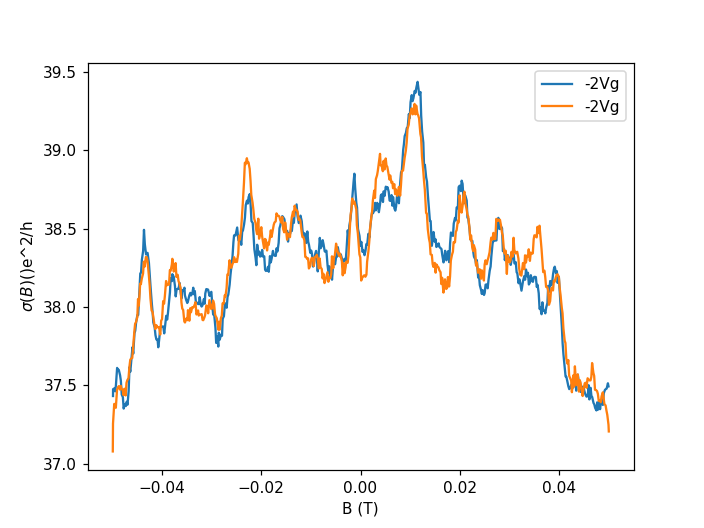

In [230]:
plt.figure()
plt.plot(data1.triton_field, 1/(data1.lockin865_X[:]/10e-9)/esqh, label='-2Vg')
plt.plot(data5.triton_field, 1/(data5.lockin865_X[:]/10e-9)/esqh, label='-2Vg')
#plt.plot(data6.triton_field, 1/(data6.lockin865_X[:]/10e-9)/esqh, label='-2Vg')
plt.ylabel('$\sigma(B)$()e^2/h')
plt.xlabel('B (T)')
plt.legend()

In [208]:
lockin865.time_constant()

0.3

In [209]:
lockin830.time_constant()

0.3

In [333]:
triton.field() 

-0.049923

In [334]:
for i in range(26):
    Vg = -1.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.05)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.05)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.05, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.06 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 1209.568 seconds
Started at 2020-03-26 20:57:59
DataSet:
   location = 'data/2020-03-26/#054_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-1.74_10nA_20-57-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 21:18:06
Please wait 70.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 1208.7459999999999 seconds
Started at 2020-03-26 21:19:36
DataSet:
   location = 'data/2020-03-26/#055_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-1.

KeyboardInterrupt: 

In [343]:
triton.field()

-0.050005

In [ ]:
# now try smaller range 25mT

In [344]:
for i in range(26):
    Vg = -1.84 - 0.02*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 25.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-03-26 22:48:22
DataSet:
   location = 'data/2020-03-26/#059_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-1.84_10nA_22-48-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-26 22:58:27
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-03-26 22:59:27
DataSet:
   location = 'data/2020-03-26/#060_W5_865_40-39_830_39-38_baseT_WALfield

In [ ]:
#try around +7Vg

In [345]:
for i in range(26):
    Vg = 7.24 - 0.02*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.1139999999999 seconds
Started at 2020-03-27 03:37:25
DataSet:
   location = 'data/2020-03-27/#020_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg7.24_10nA_03-37-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-27 03:47:32
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.8520000000001 seconds
Started at 2020-03-27 03:48:32
DataSet:
   location = 'data/2020-03-27/#021_W5_865_40-39_830_39-38_baseT_WALfieldsw_

In [ ]:
#try around -3.5V

In [346]:
for i in range(26):
    Vg = -3.26 - 0.02*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-03-27 08:26:18
DataSet:
   location = 'data/2020-03-27/#046_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-3.26_10nA_08-26-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-27 08:36:23
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-03-27 08:37:22
DataSet:
   location = 'data/2020-03-27/#047_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-3.28_10

In [ ]:
#maybe also try -6 a little bit

In [347]:
for i in range(26):
    Vg = -5.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-03-27 13:42:34
DataSet:
   location = 'data/2020-03-27/#072_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-5.74_10nA_13-42-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-27 13:52:41
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-03-27 13:53:41
DataSet:
   location = 'data/2020-03-27/#073_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-5.76_

In [371]:
triton.pid_setpoint(0.9)

In [365]:
triton.pid_mode(1)

In [367]:
triton.pid_range(10)

In [356]:
triton.PT2h_temp_enable(0)# turn on off channel 1

In [372]:
#0.9K -2Vg
    time.sleep(600)

In [373]:
for i in range(30):
    Vg = -1.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_0p9K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-03-27 19:19:23
DataSet:
   location = 'data/2020-03-27/#098_W5_865_40-39_830_39-38_0p9K_WALfieldsw_Vbg-1.74_10nA_19-19-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-27 19:29:31
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.768 seconds
Started at 2020-03-27 19:30:31
DataSet:
   location = 'data/2020-03-27/#099_W5_865_40-39_830_39-38_0p9K_WALfieldsw_Vbg-1.76_10nA_19-30-31'

KeyboardInterrupt: 

In [381]:
triton.field()

-0.049985

In [ ]:
#somehow the field goes to -0.05, the data at Vg=-2 can not be use, continue measure below

In [383]:
triton.field()

-0.049985

In [384]:
triton.magnet_sweeprate()

0.005

In [387]:
triton.magnet_POC()

0

In [391]:
triton.magnet_hold()

In [396]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [398]:
triton.magnet_sweeprate(0.1)

In [399]:
triton.field(-0.025)

Sweep time approximately 25.0 seconds


In [400]:
for i in range(17):
    Vg = -2 - 0.02*i
    st = 'W5_865_40-39_830_39-38_0p9K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-03-28 09:54:20
DataSet:
   location = 'data/2020-03-28/#001_W5_865_40-39_830_39-38_0p9K_WALfieldsw_Vbg-2.00_10nA_09-54-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-28 10:04:26
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-03-28 10:05:25
DataSet:
   location = 'data/2020-03-28/#002_W5_865_40-39_830_39-38_0p9K_WALfieldsw_V

In [401]:
triton.pid_setpoint(0.3)

In [402]:
for i in range(30):
    Vg = -1.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-03-28 14:12:10
DataSet:
   location = 'data/2020-03-28/#018_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-1.74_10nA_14-12-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-28 14:22:15
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.768 seconds
Started at 2020-03-28 14:23:13
DataSet:
   location = 'data/2020-03-28/#019_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-1.76_10nA_14-23-1

In [403]:
for i in range(26):
    Vg = -3.26 - 0.02*i
    st = 'W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-03-28 19:44:23
DataSet:
   location = 'data/2020-03-28/#048_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-3.26_10nA_19-44-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-28 19:54:30
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.376 seconds
Started at 2020-03-28 19:55:27
DataSet:
   location = 'data/2020-03-28/#049_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-3.28_10nA_19-55

In [404]:
for i in range(26):
    Vg = -5.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-03-29 00:32:28
DataSet:
   location = 'data/2020-03-29/#003_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-5.74_10nA_00-32-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-29 00:42:33
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.9359999999999 seconds
Started at 2020-03-29 00:43:32
DataSet:
   location = 'data/2020-03-29/#004_W5_865_40-39_830_39-38_300mK_WALfieldsw

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-03-29/#007_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-5.82_10nA_01-16-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-29 01:26:52
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-03-29 01:27:52
DataSet:
   location = 'data/2020-03-29/#008_W5_865_40-39_830_39-38_300mK_WALfieldsw_Vbg-5.84_10nA_01-27-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Mea

In [405]:
srframe.volt_p1(-2)

In [406]:
triton.pid_setpoint(0.5)

In [407]:
time.sleep(3600)

In [408]:
for i in range(30):
    Vg = -1.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.376 seconds
Started at 2020-03-29 06:20:46
DataSet:
   location = 'data/2020-03-29/#029_W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg-1.74_10nA_06-20-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-29 06:30:52
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-03-29 06:31:51
DataSet:
   location = 'data/2020-03-29/#030_W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg-1.76_10nA_06-31-5

In [409]:
for i in range(26):
    Vg = -3.26 - 0.02*i
    st = 'W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-03-29 11:53:12
DataSet:
   location = 'data/2020-03-29/#059_W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg-3.26_10nA_11-53-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-29 12:03:18
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-03-29 12:04:16
DataSet:
   location = 'data/2020-03-29/#060_W5_865_40-39_830_39-38_500mK_WALfieldsw

In [410]:
for i in range(26):
    Vg = -5.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-03-29 16:41:34
DataSet:
   location = 'data/2020-03-29/#085_W5_865_40-39_830_39-38_500mK_WALfieldsw_Vbg-5.74_10nA_16-41-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-29 16:51:40
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-03-29 16:52:39
DataSet:
   location = 'data/2020-03-29/#086_W5_865_40-39_830_39-38_500mK_WALfieldsw

In [411]:
triton.pid_setpoint(0.7)

In [412]:
 srframe.volt_p1(-2)

In [413]:
for i in range(30):
    Vg = -1.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.0459999999999 seconds
Started at 2020-03-29 21:55:16
DataSet:
   location = 'data/2020-03-29/#111_W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg-1.74_10nA_21-55-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-29 22:05:21
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-03-29 22:06:20
DataSet:
   location = 'data/2020-03-29/#112_W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg-1.76_10

In [414]:
for i in range(26):
    Vg = -3.26 - 0.02*i
    st = 'W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.098 seconds
Started at 2020-03-30 03:27:31
DataSet:
   location = 'data/2020-03-30/#019_W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg-3.26_10nA_03-27-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-30 03:37:37
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-03-30 03:38:36
DataSet:
   location = 'data/2020-03-30/#020_W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg-3.28_10nA_03-38

In [415]:
for i in range(26):
    Vg = -5.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-03-30 08:15:35
DataSet:
   location = 'data/2020-03-30/#045_W5_865_40-39_830_39-38_700mK_WALfieldsw_Vbg-5.74_10nA_08-15-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-30 08:25:40
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.4440000000001 seconds
Started at 2020-03-30 08:26:40
DataSet:
   location = 'data/2020-03-30/#046_W5_865_40-39_830_39-38_700mK_WALfield

In [417]:
triton.pid_setpoint(0.9)

In [426]:
lockin865.amplitude()#10nA 

1.0

In [425]:
lockin865.sensitivity()

5e-05

In [427]:
for i in range(26):
    Vg = -3.26 - 0.02*i
    st = 'W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-03-30 13:45:45
DataSet:
   location = 'data/2020-03-30/#071_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-3.26_10nA_13-45-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-30 13:55:52
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-03-30 13:56:48
DataSet:
   location = 'data/2020-03-30/#072_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-3.28_10

In [428]:
for i in range(26):
    Vg = -5.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-03-30 18:33:56
DataSet:
   location = 'data/2020-03-30/#097_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-5.74_10nA_18-33-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-30 18:44:02
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-03-30 18:45:01
DataSet:
   location = 'data/2020-03-30/#098_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-5.7

# A couple trial SdH oscillations on W5

In [442]:
lockin865.sensitivity()

0.0002

In [443]:
lockin830.sensitivity()

0.0002

In [444]:
lockin865.time_constant()

0.3

In [445]:
lockin865.amplitude()

1.0

In [430]:
triton.magnet_sweeprate(0.1)

In [12]:
triton.field()

5.999973

In [446]:
srframe.volt_p1(-6)
time.sleep(15)
triton.magnet_sweeprate(0.05)
triton.field(6)
data15, plot15 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-6Vbg_900mK_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.994 seconds
Started at 2020-03-30 23:32:32
DataSet:
   location = 'data/2020-03-30/#123_W5_865_40-39_830_39-38_fieldsweep_-6Vbg_900mK_10nA_23-32-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-31 01:33:16


In [22]:
time.sleep(5400)

In [23]:
triton.magnet_sweeprate(0.05)
triton.field(0)
data16, plot16 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-6Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 7210.0 seconds
Started at 2020-03-31 08:31:56
DataSet:
   location = 'data/2020-03-31/#001_W5_865_40-39_830_39-38_fieldsweep_-6Vbg_baseT_10nA_08-31-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-31 10:32:37


In [24]:
srframe.volt_p1(-1)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data17, plot17 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-03-31 10:33:22
DataSet:
   location = 'data/2020-03-31/#002_W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_10nA_10-33-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-03-31 12:34:04


In [28]:
triton.magnet_sweeprate(0.2)

In [78]:
triton.field()

0.0

In [51]:
lockin865.sensitivity(5e-5)

In [52]:
lockin830.sensitivity(2e-5)

In [53]:
srframe.volt_p1(-2)

In [71]:
triton.pid_setpoint(3)

In [55]:
triton.pid_mode(1)

In [64]:
triton.pid_range(100)

# W5 WAL high temperature

In [72]:
for i in range(30):
    Vg = -1.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 25.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-03-31 13:40:30
DataSet:
   location = 'data/2020-03-31/#003_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-1.74_10nA_13-40-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-31 13:50:34
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.36 seconds
Started at 2020-03-31 13:51:33
DataSet:
   location = 'data/2020-03-31/#004_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-1.76_10nA_13-51-33'
   <

In [73]:
for i in range(26):
    Vg = -3.26 - 0.02*i
    st = 'W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-03-31 19:13:24
DataSet:
   location = 'data/2020-03-31/#033_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-3.26_10nA_19-13-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-03-31 19:23:31
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-03-31 19:24:31
DataSet:
   location = 'data/2020-03-31/#034_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-3.2

In [74]:
for i in range(26):
    Vg = -5.74 - 0.02*i
    st = 'W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-04-01 00:01:42
DataSet:
   location = 'data/2020-04-01/#001_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-5.74_10nA_00-01-41'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-01 00:11:48
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-04-01 00:12:45
DataSet:
   location = 'data/2020-04-01/#002_W5_865_40-39_830_39-38_3K_WALfieldsw_Vbg-5.76_10nA_0

In [75]:
   srframe.volt_p1(0)

In [76]:
triton.pid_mode(0)

In [208]:
triton.read_temps()

MC - on:  0.0285493 K
MC_cernox - off:  321.181 K
still - off:  0.771101 K
cold_plate - off:  0.254886 K
magnet - off:  4.26876 K
PT2h - off:  3.31641 K
PT2p - off:  3.54042 K
PT1h - off:  46.9254 K
PT1p - off:  59.553 K


# Back to SdH oscillation

In [100]:
lockin865.amplitude(1.5)#15nA

In [102]:
lockin865.sensitivity(2e-4)

In [104]:
lockin830.sensitivity(2e-4)

In [105]:
lockin865.time_constant()

0.3

In [106]:
lockin830.time_constant()

0.3

In [110]:
srframe.volt_p1(-1)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data18, plot18 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-02 12:40:18
DataSet:
   location = 'data/2020-04-02/#001_W5_865_40-39_830_39-38_fieldsweep_-1Vbg_baseT_15nA_12-40-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-02 14:41:01


In [ ]:
#try close gate point to see if there is any trends

In [111]:
srframe.volt_p1(-0.8)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data19, plot19 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-0.8Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-02 14:53:43
DataSet:
   location = 'data/2020-04-02/#002_W5_865_40-39_830_39-38_fieldsweep_-0.8Vbg_baseT_15nA_14-53-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-02 16:54:27


In [112]:
srframe.volt_p1(-1.2)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data20, plot20 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-1.2Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.982 seconds
Started at 2020-04-02 17:04:27
DataSet:
   location = 'data/2020-04-02/#003_W5_865_40-39_830_39-38_fieldsweep_-1.2Vbg_baseT_15nA_17-04-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-02 19:05:08


In [113]:
srframe.volt_p1(-1.1)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data21, plot21 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-1.2Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-02 20:28:31
DataSet:
   location = 'data/2020-04-02/#004_W5_865_40-39_830_39-38_fieldsweep_-1.2Vbg_baseT_15nA_20-28-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-02 22:29:14


In [114]:
srframe.volt_p1(-0.9)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data22, plot22 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_-0.9Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-02 22:29:49
DataSet:
   location = 'data/2020-04-02/#005_W5_865_40-39_830_39-38_fieldsweep_-0.9Vbg_baseT_15nA_22-29-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 00:30:32


In [115]:
srframe.volt_p1(1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data23, plot23 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_1.6Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.03 seconds
Started at 2020-04-03 00:31:13
DataSet:
   location = 'data/2020-04-03/#001_W5_865_40-39_830_39-38_fieldsweep_1.6Vbg_baseT_15nA_00-31-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 02:31:57


In [116]:
srframe.volt_p1(1.7)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data24, plot24 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_1.7Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-03 02:32:33
DataSet:
   location = 'data/2020-04-03/#002_W5_865_40-39_830_39-38_fieldsweep_1.7Vbg_baseT_15nA_02-32-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 04:33:17


In [117]:
srframe.volt_p1(1.8)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data25, plot25 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_1.8Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.018 seconds
Started at 2020-04-03 04:33:54
DataSet:
   location = 'data/2020-04-03/#003_W5_865_40-39_830_39-38_fieldsweep_1.8Vbg_baseT_15nA_04-33-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 06:34:37


In [118]:
srframe.volt_p1(1.9)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data26, plot26 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W5_865_40-39_830_39-38_fieldsweep_1.9Vbg_baseT_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.018 seconds
Started at 2020-04-03 06:35:13
DataSet:
   location = 'data/2020-04-03/#004_W5_865_40-39_830_39-38_fieldsweep_1.9Vbg_baseT_15nA_06-35-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 08:35:57


In [122]:
triton.field()

7e-06

In [229]:
lockin865.amplitude()

1.5

In [127]:
srframe.volt_p1(0)

In [125]:
lockin865.amplitude(0.1)

In [133]:
#now try W3

In [126]:
# base temp, cables plugged
srframe.volt_p1(-8)
time.sleep(30)
gvals = np.linspace(-8, 9, 341)
data27, plot27 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-03 10:53:38
DataSet:
   location = 'data/2020-04-03/#005_W3_865_48-24_830_47-48_baseT_1nA_10-53-37'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (341,)
   Measured | lockin865_X         | X            | (341,)
   Measured | lockin865_Y         | Y            | (341,)
   Measured | lockin830_X         | X            | (341,)
   Measured | lockin830_Y         | Y            | (341,)
Finished at 2020-04-03 11:01:15


In [131]:
%matplotlib notebook

<IPython.core.display.Javascript object>


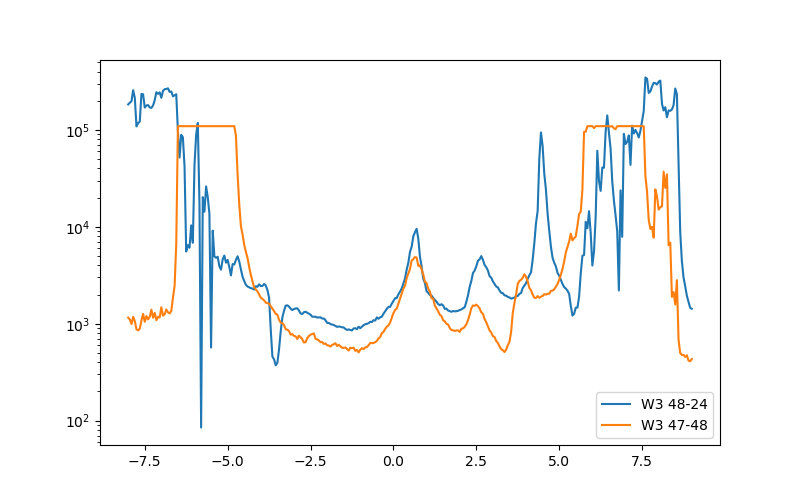

In [259]:

plt.figure(figsize=(8, 5))
plt.semilogy(data27.srframe_volt_p1_set, abs(data27.lockin865_X[:]/1e-9), label='W3 48-24')
plt.semilogy(data27.srframe_volt_p1_set, data27.lockin830_X[:]/1e-9, label='W3 47-48')
plt.legend()

In [135]:
lockin865.amplitude(1.5)#15nA

In [140]:
srframe.volt_p1(-0.9)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data28, plot28 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-0.9Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.994 seconds
Started at 2020-04-03 11:18:15
DataSet:
   location = 'data/2020-04-03/#006_W3_865_48-24_830_47-48_baseT_fieldsweep_-0.9Vbg_15nA_11-18-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 13:18:57


In [141]:
srframe.volt_p1(-1.1)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data29, plot29 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.1Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-03 13:26:30
DataSet:
   location = 'data/2020-04-03/#007_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.1Vbg_15nA_13-26-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 15:27:12


In [142]:
srframe.volt_p1(-1.3)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data30, plot30 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.3Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-03 15:42:15
DataSet:
   location = 'data/2020-04-03/#008_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.3Vbg_15nA_15-42-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 17:42:58


In [143]:
srframe.volt_p1(-1.5)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data31, plot31 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.5Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.018 seconds
Started at 2020-04-03 17:55:24
DataSet:
   location = 'data/2020-04-03/#009_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.5Vbg_15nA_17-55-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 19:56:07


In [144]:
srframe.volt_p1(-1.4)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data32, plot32 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.4Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.982 seconds
Started at 2020-04-03 20:39:46
DataSet:
   location = 'data/2020-04-03/#010_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.4Vbg_15nA_20-39-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-03 22:40:29


In [145]:
srframe.volt_p1(-1.2)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data33, plot33 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.2Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.018 seconds
Started at 2020-04-03 22:41:05
DataSet:
   location = 'data/2020-04-03/#011_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.2Vbg_15nA_22-41-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 00:41:48


In [146]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data34, plot34 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.6Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.994 seconds
Started at 2020-04-04 00:42:24
DataSet:
   location = 'data/2020-04-04/#001_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.6Vbg_15nA_00-42-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 02:43:06


In [147]:
srframe.volt_p1(-1)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data35, plot35 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-04 02:43:43
DataSet:
   location = 'data/2020-04-04/#002_W3_865_48-24_830_47-48_baseT_fieldsweep_-1Vbg_15nA_02-43-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 04:44:25


In [148]:
srframe.volt_p1(-0.8)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data36, plot36 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-0.8Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-04 04:45:01
DataSet:
   location = 'data/2020-04-04/#003_W3_865_48-24_830_47-48_baseT_fieldsweep_-0.8Vbg_15nA_04-45-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 06:45:45


In [149]:
srframe.volt_p1(-0.7)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data37, plot37 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-0.7Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-04 06:46:21
DataSet:
   location = 'data/2020-04-04/#004_W3_865_48-24_830_47-48_baseT_fieldsweep_-0.7Vbg_15nA_06-46-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 08:47:05


In [151]:
srframe.volt_p1(-0.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data38, plot38 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-0.6Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.982 seconds
Started at 2020-04-04 13:42:32
DataSet:
   location = 'data/2020-04-04/#005_W3_865_48-24_830_47-48_baseT_fieldsweep_-0.6Vbg_15nA_13-42-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 15:43:15


In [152]:
srframe.volt_p1(-0.5)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data39, plot39 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-0.5Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.994 seconds
Started at 2020-04-04 16:25:37
DataSet:
   location = 'data/2020-04-04/#006_W3_865_48-24_830_47-48_baseT_fieldsweep_-0.5Vbg_15nA_16-25-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 18:26:20


In [153]:
srframe.volt_p1(-1.7)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data40, plot40 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.7Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-04 18:49:39
DataSet:
   location = 'data/2020-04-04/#007_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.7Vbg_15nA_18-49-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 20:50:23


In [154]:
srframe.volt_p1(-1.8)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data41, plot41 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.8Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.994 seconds
Started at 2020-04-04 20:53:29
DataSet:
   location = 'data/2020-04-04/#008_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.8Vbg_15nA_20-53-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-04 22:54:12


In [179]:
srframe.volt_p1(-1.9)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data42, plot42 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-1.9Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7209.994 seconds
Started at 2020-04-05 00:33:21
DataSet:
   location = 'data/2020-04-05/#001_W3_865_48-24_830_47-48_baseT_fieldsweep_-1.9Vbg_15nA_00-33-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-05 02:34:04


In [181]:
triton.field()

0.0

In [180]:
srframe.volt_p1(-2)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data43, plot43 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-2.0Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-05 02:34:41
DataSet:
   location = 'data/2020-04-05/#002_W3_865_48-24_830_47-48_baseT_fieldsweep_-2.0Vbg_15nA_02-34-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-05 04:35:24


In [192]:
srframe.volt_p1(-2.1)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data44, plot44 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-2.1Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.006 seconds
Started at 2020-04-05 10:54:51
DataSet:
   location = 'data/2020-04-05/#005_W3_865_48-24_830_47-48_baseT_fieldsweep_-2.1Vbg_15nA_10-54-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-05 12:55:34


In [214]:
srframe.volt_p1(-2.2)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(6)
data45, plot45 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-2.2Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0419999999995 seconds
Started at 2020-04-05 16:22:22
DataSet:
   location = 'data/2020-04-05/#007_W3_865_48-24_830_47-48_baseT_fieldsweep_-2.2Vbg_15nA_16-22-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-05 18:23:05


In [219]:
srframe.volt_p1(-2.3)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(0)
data46, plot46 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=150, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-2.3Vbg_15nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 7210.0 seconds
Started at 2020-04-05 18:28:34
DataSet:
   location = 'data/2020-04-05/#008_W3_865_48-24_830_47-48_baseT_fieldsweep_-2.3Vbg_15nA_18-28-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (4500,)
   Measured | time0        | time0        | (4500,)
   Measured | triton_field | field        | (4500,)
   Measured | lockin865_X  | X            | (4500,)
   Measured | lockin865_Y  | Y            | (4500,)
   Measured | lockin830_X  | X            | (4500,)
   Measured | lockin830_Y  | Y            | (4500,)
Finished at 2020-04-05 20:29:19


In [256]:
triton.field()

-0.0

In [205]:
triton.magnet_sweeprate(0.1)

In [252]:
triton.read_temps()

MC - on:  0.027483 K
MC_cernox - off:  321.181 K
still - off:  0.771101 K
cold_plate - off:  0.254886 K
magnet - on:  4.26712 K
PT2h - off:  3.31641 K
PT2p - off:  3.54042 K
PT1h - off:  46.9254 K
PT1p - off:  59.553 K


# Hysteresis check on double side device

In [232]:
lockin865.amplitude(0.1)#1nA

In [234]:
lockin865.time_constant(0.1)

In [235]:
lockin830.time_constant(0.1)

In [243]:
lockin865.sensitivity(2e-4)

In [244]:
lockin830.sensitivity(2e-4)

In [245]:
lockin865.frequency()

13.6667

In [251]:
srframe.volt_p1(0)

In [257]:
# base temp, cables plugged
srframe.volt_p1(-8)
time.sleep(30)
gvals = np.linspace(-8, 9, 341)
data47, plot47 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-06 15:12:29
DataSet:
   location = 'data/2020-04-06/#001_W3_865_48-24_830_47-48_baseT_1nA_15-12-28'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (341,)
   Measured | lockin865_X         | X            | (341,)
   Measured | lockin865_Y         | Y            | (341,)
   Measured | lockin830_X         | X            | (341,)
   Measured | lockin830_Y         | Y            | (341,)
Finished at 2020-04-06 15:20:07


In [258]:
srframe.volt_p1(0)

<IPython.core.display.Javascript object>


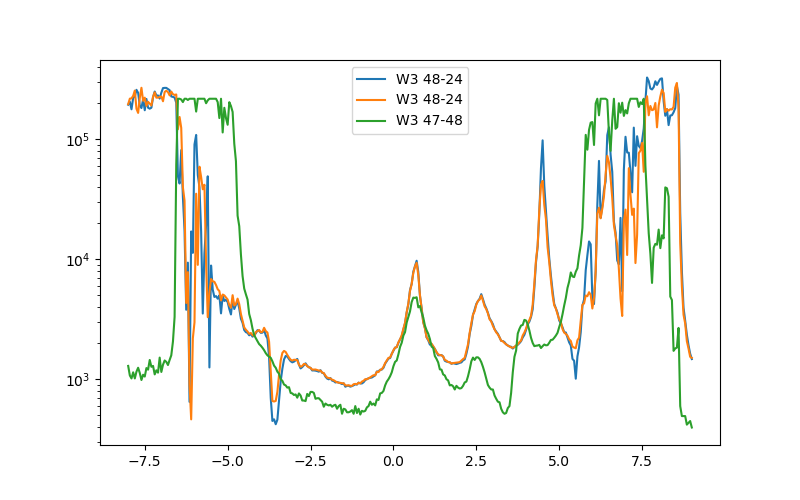

In [332]:
plt.figure(figsize=(8, 5))
plt.semilogy(data47.srframe_volt_p1_set, abs(data47.lockin865_X[:]/1e-9), label='W3 48-24')
plt.semilogy(data50.srframe_volt_p1_set, abs(data50.lockin865_X[:]/5e-9), label='W3 48-24')
plt.semilogy(data47.srframe_volt_p1_set, data47.lockin830_X[:]/1e-9, label='W3 47-48')
#plt.semilogy(data50.srframe_volt_p1_set, data50.lockin830_X[:]/5e-9, label='W3 47-48')
plt.legend()

In [308]:
lockin865.frequency(7.7717)

In [309]:
lockin865.time_constant(0.3)

In [310]:
lockin830.time_constant(0.3)

In [311]:
lockin865.sensitivity(5e-5)

In [312]:
lockin830.sensitivity(5e-5)

In [275]:
lockin865.amplitude(0.5)#5nA

In [284]:
triton.field()

-0.49999

In [285]:
srframe.volt_p1(3.3)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data48, plot48 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.3V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data49, plot49 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.3V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-06 15:50:15
DataSet:
   location = 'data/2020-04-06/#002_W3_hysteresischeck_Vg3.3V_865_48-24_830_47-48_baseT_5nA_15-50-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 16:00:33
Sweep time approximately 610.012 seconds
Started at 2020-04-06 16:00:39
DataSet:
   location = 'data/2020-04-06/#003_W3_hysteresischeck_Vg3.3V_865_48-24_830_47-48_baseT_5nA_16-00-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [316]:
lockin830.time_constant()
lockin865.time_constant()

0.3

In [302]:
lockin830.sensitivity(2e-4)
lockin865.sensitivity(2e-4)

In [317]:
lockin865.frequency()

7.7717

In [304]:
# base temp, cables plugged
srframe.volt_p1(-8)
time.sleep(30)
gvals = np.linspace(-8, 9, 341)
data50, plot50 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_5nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-06 18:19:24
DataSet:
   location = 'data/2020-04-06/#005_W3_865_48-24_830_47-48_baseT_5nA_18-19-23'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (341,)
   Measured | lockin865_X         | X            | (341,)
   Measured | lockin865_Y         | Y            | (341,)
   Measured | lockin830_X         | X            | (341,)
   Measured | lockin830_Y         | Y            | (341,)
Finished at 2020-04-06 18:27:01


In [305]:
srframe.volt_p1(0)

In [314]:
lockin865.amplitude()                                                                                                                                                                                                                                                                                                      

0.5

In [319]:
srframe.volt_p1(3.8)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data51, plot51 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data52, plot52 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.006 seconds
Started at 2020-04-06 20:36:23
DataSet:
   location = 'data/2020-04-06/#008_W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_5nA_20-36-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 20:46:39
Sweep time approximately 610.0 seconds
Started at 2020-04-06 20:46:46
DataSet:
   location = 'data/2020-04-06/#009_W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_5nA_20-46-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [329]:
lockin865.amplitude(0.1)

In [330]:
srframe.volt_p1(3.8)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data53, plot53 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data54, plot54 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.988 seconds
Started at 2020-04-06 21:20:21
DataSet:
   location = 'data/2020-04-06/#010_W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_1nA_21-20-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 21:30:38
Sweep time approximately 610.012 seconds
Started at 2020-04-06 21:30:44
DataSet:
   location = 'data/2020-04-06/#011_W3_hysteresischeck_Vg3.8V_865_48-24_830_47-48_baseT_1nA_21-30-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [333]:
lockin865.amplitude(0.5)

In [334]:
srframe.volt_p1(4)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data55, plot55 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data56, plot56 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-04-06 21:50:39
DataSet:
   location = 'data/2020-04-06/#012_W3_hysteresischeck_Vg4V_865_48-24_830_47-48_baseT_5nA_21-50-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 22:00:56
Sweep time approximately 610.006 seconds
Started at 2020-04-06 22:01:07
DataSet:
   location = 'data/2020-04-06/#013_W3_hysteresischeck_Vg4V_865_48-24_830_47-48_baseT_5nA_22-01-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [336]:
srframe.volt_p1(4.2)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data57, plot57 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data58, plot58 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-06 22:16:37
DataSet:
   location = 'data/2020-04-06/#014_W3_hysteresischeck_Vg4.2V_865_48-24_830_47-48_baseT_5nA_22-16-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 22:26:53
Sweep time approximately 610.006 seconds
Started at 2020-04-06 22:27:01
DataSet:
   location = 'data/2020-04-06/#015_W3_hysteresischeck_Vg4.2V_865_48-24_830_47-48_baseT_5nA_22-27-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [337]:
srframe.volt_p1(4.4)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data59, plot59 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data60, plot60 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-06 22:37:54
DataSet:
   location = 'data/2020-04-06/#016_W3_hysteresischeck_Vg4.4V_865_48-24_830_47-48_baseT_5nA_22-37-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 22:48:11
Sweep time approximately 610.0 seconds
Started at 2020-04-06 22:48:17
DataSet:
   location = 'data/2020-04-06/#017_W3_hysteresischeck_Vg4.4V_865_48-24_830_47-48_baseT_5nA_22-48-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [338]:
srframe.volt_p1(4.6)
time.sleep(30)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data61, plot61 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data62, plot62 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg4.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-04-06 22:59:11
DataSet:
   location = 'data/2020-04-06/#018_W3_hysteresischeck_Vg4.6V_865_48-24_830_47-48_baseT_5nA_22-59-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 23:09:29
Sweep time approximately 610.006 seconds
Started at 2020-04-06 23:09:35
DataSet:
   location = 'data/2020-04-06/#019_W3_hysteresischeck_Vg4.6V_865_48-24_830_47-48_baseT_5nA_23-09-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [339]:
srframe.volt_p1(3.6)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data63, plot63 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data64, plot64 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-06 23:27:34
DataSet:
   location = 'data/2020-04-06/#020_W3_hysteresischeck_Vg3.6V_865_48-24_830_47-48_baseT_5nA_23-27-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-06 23:37:51
Sweep time approximately 610.006 seconds
Started at 2020-04-06 23:37:57
DataSet:
   location = 'data/2020-04-06/#021_W3_hysteresischeck_Vg3.6V_865_48-24_830_47-48_baseT_5nA_23-37-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [340]:
srframe.volt_p1(3.4)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data65, plot65 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data66, plot66 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-06 23:49:57
DataSet:
   location = 'data/2020-04-06/#022_W3_hysteresischeck_Vg3.4V_865_48-24_830_47-48_baseT_5nA_23-49-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 00:00:15
Sweep time approximately 610.006 seconds
Started at 2020-04-07 00:00:29
DataSet:
   location = 'data/2020-04-07/#001_W3_hysteresischeck_Vg3.4V_865_48-24_830_47-48_baseT_5nA_00-00-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [341]:
srframe.volt_p1(3.2)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data67, plot67 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data68, plot68 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 00:11:44
DataSet:
   location = 'data/2020-04-07/#002_W3_hysteresischeck_Vg3.2V_865_48-24_830_47-48_baseT_5nA_00-11-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 00:22:01
Sweep time approximately 610.0 seconds
Started at 2020-04-07 00:22:06
DataSet:
   location = 'data/2020-04-07/#003_W3_hysteresischeck_Vg3.2V_865_48-24_830_47-48_baseT_5nA_00-22-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [342]:
srframe.volt_p1(3.0)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data69, plot69 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.0V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data70, plot70 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg3.0V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 00:33:30
DataSet:
   location = 'data/2020-04-07/#004_W3_hysteresischeck_Vg3.0V_865_48-24_830_47-48_baseT_5nA_00-33-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 00:43:47
Sweep time approximately 610.006 seconds
Started at 2020-04-07 00:43:55
DataSet:
   location = 'data/2020-04-07/#005_W3_hysteresischeck_Vg3.0V_865_48-24_830_47-48_baseT_5nA_00-43-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [343]:
srframe.volt_p1(2.8)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data71, plot71 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data72, plot72 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 00:55:19
DataSet:
   location = 'data/2020-04-07/#006_W3_hysteresischeck_Vg2.8V_865_48-24_830_47-48_baseT_5nA_00-55-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 01:05:36
Sweep time approximately 610.0 seconds
Started at 2020-04-07 01:05:44
DataSet:
   location = 'data/2020-04-07/#007_W3_hysteresischeck_Vg2.8V_865_48-24_830_47-48_baseT_5nA_01-05-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [344]:
srframe.volt_p1(2.6)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data73, plot73 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data74, plot74 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.988 seconds
Started at 2020-04-07 01:17:08
DataSet:
   location = 'data/2020-04-07/#008_W3_hysteresischeck_Vg2.6V_865_48-24_830_47-48_baseT_5nA_01-17-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 01:27:26
Sweep time approximately 609.994 seconds
Started at 2020-04-07 01:27:33
DataSet:
   location = 'data/2020-04-07/#009_W3_hysteresischeck_Vg2.6V_865_48-24_830_47-48_baseT_5nA_01-27-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [345]:
srframe.volt_p1(2.4)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data75, plot75 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data76, plot76 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 01:38:57
DataSet:
   location = 'data/2020-04-07/#010_W3_hysteresischeck_Vg2.4V_865_48-24_830_47-48_baseT_5nA_01-38-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 01:49:15
Sweep time approximately 610.006 seconds
Started at 2020-04-07 01:49:23
DataSet:
   location = 'data/2020-04-07/#011_W3_hysteresischeck_Vg2.4V_865_48-24_830_47-48_baseT_5nA_01-49-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [346]:
srframe.volt_p1(2.2)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data77, plot77 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data78, plot78 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 02:00:48
DataSet:
   location = 'data/2020-04-07/#012_W3_hysteresischeck_Vg2.2V_865_48-24_830_47-48_baseT_5nA_02-00-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 02:11:06
Sweep time approximately 610.006 seconds
Started at 2020-04-07 02:11:12
DataSet:
   location = 'data/2020-04-07/#013_W3_hysteresischeck_Vg2.2V_865_48-24_830_47-48_baseT_5nA_02-11-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [347]:
srframe.volt_p1(2.0)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data79, plot79 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.0V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data80, plot80 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg2.0V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 02:22:36
DataSet:
   location = 'data/2020-04-07/#014_W3_hysteresischeck_Vg2.0V_865_48-24_830_47-48_baseT_5nA_02-22-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 02:32:52
Sweep time approximately 610.006 seconds
Started at 2020-04-07 02:33:00
DataSet:
   location = 'data/2020-04-07/#015_W3_hysteresischeck_Vg2.0V_865_48-24_830_47-48_baseT_5nA_02-32-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [348]:
srframe.volt_p1(1.8)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data81, plot81 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data82, plot82 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 02:44:24
DataSet:
   location = 'data/2020-04-07/#016_W3_hysteresischeck_Vg1.8V_865_48-24_830_47-48_baseT_5nA_02-44-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 02:54:42
Sweep time approximately 610.006 seconds
Started at 2020-04-07 02:54:48
DataSet:
   location = 'data/2020-04-07/#017_W3_hysteresischeck_Vg1.8V_865_48-24_830_47-48_baseT_5nA_02-54-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [349]:
srframe.volt_p1(1.6)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data83, plot83 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data84, plot84 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 03:06:13
DataSet:
   location = 'data/2020-04-07/#018_W3_hysteresischeck_Vg1.6V_865_48-24_830_47-48_baseT_5nA_03-06-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 03:16:31
Sweep time approximately 610.012 seconds
Started at 2020-04-07 03:16:37
DataSet:
   location = 'data/2020-04-07/#019_W3_hysteresischeck_Vg1.6V_865_48-24_830_47-48_baseT_5nA_03-16-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [350]:
srframe.volt_p1(1.4)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data85, plot85 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data86, plot86 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 03:28:00
DataSet:
   location = 'data/2020-04-07/#020_W3_hysteresischeck_Vg1.4V_865_48-24_830_47-48_baseT_5nA_03-27-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 03:38:18
Sweep time approximately 610.0 seconds
Started at 2020-04-07 03:38:25
DataSet:
   location = 'data/2020-04-07/#021_W3_hysteresischeck_Vg1.4V_865_48-24_830_47-48_baseT_5nA_03-38-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [351]:
srframe.volt_p1(1.2)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data87, plot87 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data88, plot88 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 03:49:48
DataSet:
   location = 'data/2020-04-07/#022_W3_hysteresischeck_Vg1.2V_865_48-24_830_47-48_baseT_5nA_03-49-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 04:00:05
Sweep time approximately 610.006 seconds
Started at 2020-04-07 04:00:21
DataSet:
   location = 'data/2020-04-07/#023_W3_hysteresischeck_Vg1.2V_865_48-24_830_47-48_baseT_5nA_04-00-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [352]:
srframe.volt_p1(1.0)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data89, plot89 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.0V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data90, plot90 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg1.0V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 04:11:35
DataSet:
   location = 'data/2020-04-07/#024_W3_hysteresischeck_Vg1.0V_865_48-24_830_47-48_baseT_5nA_04-11-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 04:21:51
Sweep time approximately 610.006 seconds
Started at 2020-04-07 04:21:59
DataSet:
   location = 'data/2020-04-07/#025_W3_hysteresischeck_Vg1.0V_865_48-24_830_47-48_baseT_5nA_04-21-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [353]:
srframe.volt_p1(0.8)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data91, plot91 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data92, plot92 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.8V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 04:33:23
DataSet:
   location = 'data/2020-04-07/#026_W3_hysteresischeck_Vg0.8V_865_48-24_830_47-48_baseT_5nA_04-33-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 04:43:40
Sweep time approximately 610.0 seconds
Started at 2020-04-07 04:43:46
DataSet:
   location = 'data/2020-04-07/#027_W3_hysteresischeck_Vg0.8V_865_48-24_830_47-48_baseT_5nA_04-43-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_f

In [402]:
srframe.volt_p1(0.6)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data93, plot93 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data94, plot94 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-04-07 10:30:49
DataSet:
   location = 'data/2020-04-07/#028_W3_hysteresischeck_Vg0.6V_865_48-24_830_47-48_baseT_5nA_10-30-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 10:41:05
Sweep time approximately 610.006 seconds
Started at 2020-04-07 10:41:13
DataSet:
   location = 'data/2020-04-07/#029_W3_hysteresischeck_Vg0.6V_865_48-24_830_47-48_baseT_5nA_10-41-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [403]:
srframe.volt_p1(0.4)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data95, plot95 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data96, plot96 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.988 seconds
Started at 2020-04-07 10:52:36
DataSet:
   location = 'data/2020-04-07/#030_W3_hysteresischeck_Vg0.4V_865_48-24_830_47-48_baseT_5nA_10-52-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 11:02:53
Sweep time approximately 610.006 seconds
Started at 2020-04-07 11:02:59
DataSet:
   location = 'data/2020-04-07/#031_W3_hysteresischeck_Vg0.4V_865_48-24_830_47-48_baseT_5nA_11-02-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [404]:
srframe.volt_p1(0.2)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data97, plot97 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data98, plot98 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg0.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-04-07 11:14:22
DataSet:
   location = 'data/2020-04-07/#032_W3_hysteresischeck_Vg0.2V_865_48-24_830_47-48_baseT_5nA_11-14-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 11:24:39
Sweep time approximately 610.012 seconds
Started at 2020-04-07 11:24:45
DataSet:
   location = 'data/2020-04-07/#033_W3_hysteresischeck_Vg0.2V_865_48-24_830_47-48_baseT_5nA_11-24-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [405]:
srframe.volt_p1(-0.2)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data99, plot99 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg-0.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data100, plot100 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg-0.2V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 11:36:06
DataSet:
   location = 'data/2020-04-07/#034_W3_hysteresischeck_Vg-0.2V_865_48-24_830_47-48_baseT_5nA_11-36-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 11:46:24
Sweep time approximately 610.0 seconds
Started at 2020-04-07 11:46:30
DataSet:
   location = 'data/2020-04-07/#035_W3_hysteresischeck_Vg-0.2V_865_48-24_830_47-48_baseT_5nA_11-46-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton

In [406]:
srframe.volt_p1(-0.4)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data101, plot101 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg-0.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data102, plot102 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg-0.4V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.994 seconds
Started at 2020-04-07 11:57:52
DataSet:
   location = 'data/2020-04-07/#036_W3_hysteresischeck_Vg-0.4V_865_48-24_830_47-48_baseT_5nA_11-57-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 12:08:09
Sweep time approximately 610.012 seconds
Started at 2020-04-07 12:08:15
DataSet:
   location = 'data/2020-04-07/#037_W3_hysteresischeck_Vg-0.4V_865_48-24_830_47-48_baseT_5nA_12-08-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | tr

In [407]:
srframe.volt_p1(-0.6)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data103, plot103 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg-0.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data104, plot104 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='W3_hysteresischeck_Vg-0.6V_865_48-24_830_47-48_baseT_5nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 12:19:38
DataSet:
   location = 'data/2020-04-07/#038_W3_hysteresischeck_Vg-0.6V_865_48-24_830_47-48_baseT_5nA_12-19-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 12:29:55
Sweep time approximately 610.012 seconds
Started at 2020-04-07 12:30:01
DataSet:
   location = 'data/2020-04-07/#039_W3_hysteresischeck_Vg-0.6V_865_48-24_830_47-48_baseT_5nA_12-30-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | trit

In [420]:
def concathyst(dataup, datadown, current, instrument='lockin865'):
    nup = np.where(np.isnan(dataup.triton_field))[0][0]
    ndown = np.where(np.isnan(datadown.triton_field))[0][0]
    field = np.concatenate((dataup.triton_field[:nup], datadown.triton_field[:ndown]))
    R = np.concatenate((getattr(dataup, instrument + '_X')[:nup], getattr(datadown, instrument + '_X')[:ndown]))/current
    
    return field, R

<IPython.core.display.Javascript object>


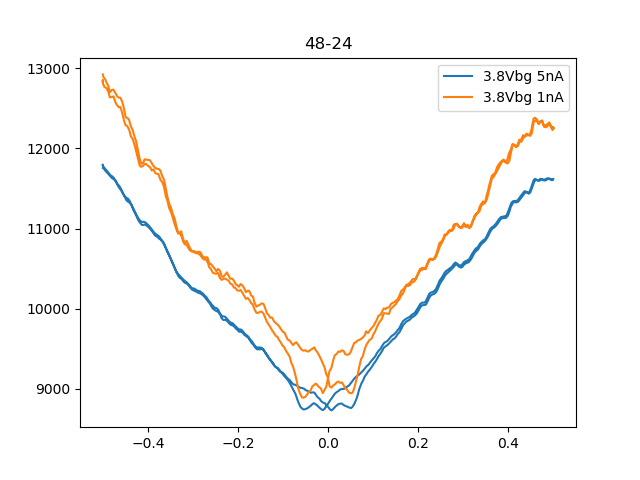

In [331]:
plt.figure()
plt.title('48-24')
plt.plot(*concathyst(data51, data52, 5e-9), label='3.8Vbg 5nA')
plt.plot(*concathyst(data53, data54, 1e-9), label='3.8Vbg 1nA')
plt.legend()

<IPython.core.display.Javascript object>


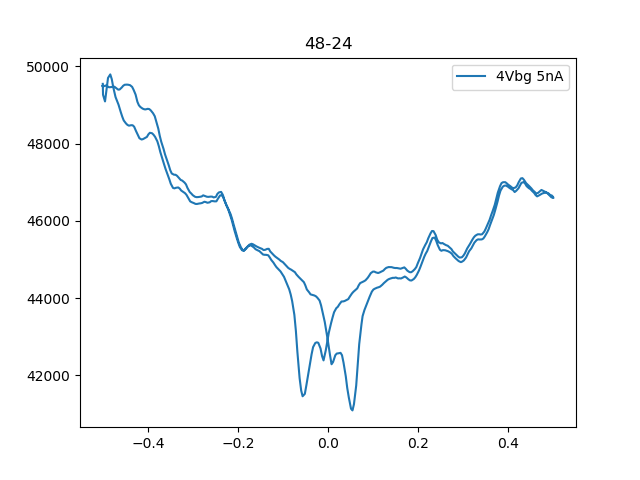

In [335]:
plt.figure()
plt.title('48-24')
plt.plot(*concathyst(data55, data56, 5e-9), label='4Vbg 5nA')
plt.legend()

<IPython.core.display.Javascript object>


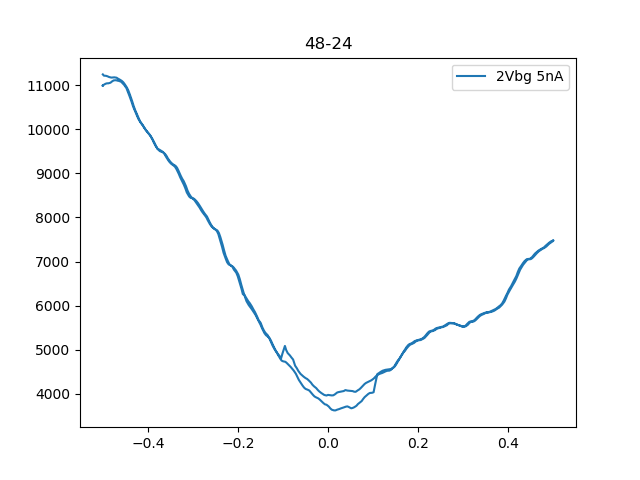

In [374]:
plt.figure()
plt.title('48-24')
plt.plot(*concathyst(data79, data80, 5e-9), label='2Vbg 5nA')
plt.legend()

<IPython.core.display.Javascript object>


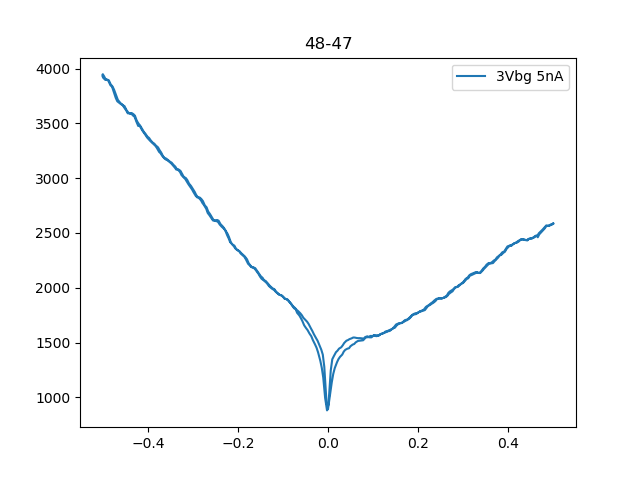

In [401]:
plt.figure()
plt.title('48-47')
plt.plot(*concathyst(data69, data70, 5e-9), label='3Vbg 5nA')
plt.legend()

In [410]:
triton.field(0)

Sweep time approximately 310.0 seconds


In [415]:
srframe.volt_p1(0)

# M26 low current hysteresis check

In [417]:
lockin865.amplitude(0.05)

In [414]:
gvals = np.linspace(0, 10, 101)
data105, plot105 = npd.single_param_sweep(srframe.volt_p1, gvals, 10, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-3_1nA')

Started at 2020-04-07 14:30:46
DataSet:
   location = 'data/2020-04-07/#040_M26_gatsweep_865_10-3_1nA_14-30-45'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
Finished at 2020-04-07 14:48:03


In [416]:
srframe.volt_p1(7.85)

In [418]:
srframe.volt_p1(7.85)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data106, plot106 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg-0.6V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data107, plot107 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg-0.6V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 14:56:06
DataSet:
   location = 'data/2020-04-07/#041_M26_gatsweep_865_10-3_Vg-0.6V_baseT_0p5nA_14-56-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 15:06:22
Sweep time approximately 610.006 seconds
Started at 2020-04-07 15:06:28
DataSet:
   location = 'data/2020-04-07/#042_M26_gatsweep_865_10-3_Vg-0.6V_baseT_0p5nA_15-06-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

<IPython.core.display.Javascript object>


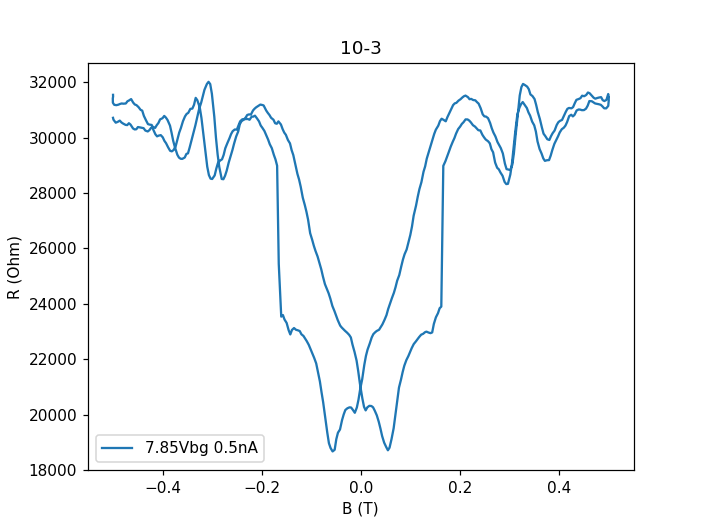

In [425]:
plt.figure()
plt.title('10-3')
plt.plot(*concathyst(data106, data107, 0.5e-9), label='7.85Vbg 0.5nA')
plt.xlabel('B (T)')
plt.ylabel('R (Ohm)')
plt.legend()

In [422]:
srframe.volt_p1(7.80)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data108, plot108 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data109, plot109 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 15:20:34
DataSet:
   location = 'data/2020-04-07/#043_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_15-20-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 15:30:52
Sweep time approximately 610.0 seconds
Started at 2020-04-07 15:30:59
DataSet:
   location = 'data/2020-04-07/#044_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_15-30-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)


<IPython.core.display.Javascript object>


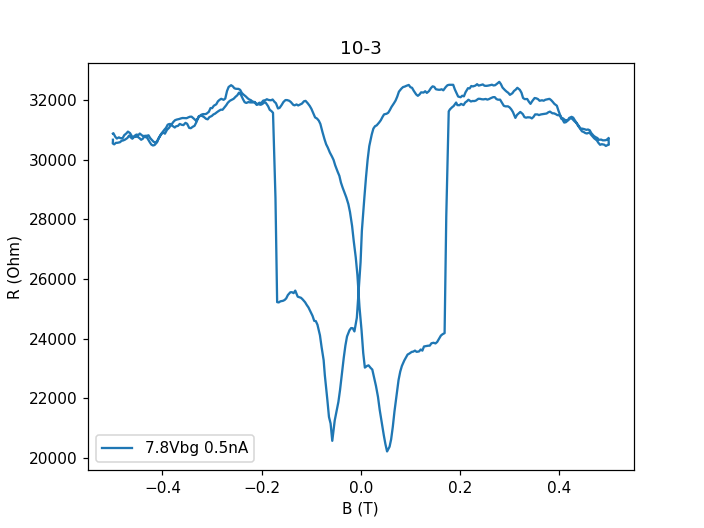

In [430]:
plt.figure()
plt.title('10-3')
plt.plot(*concathyst(data108, data109, 0.5e-9), label='7.8Vbg 0.5nA')
plt.xlabel('B (T)')
plt.ylabel('R (Ohm)')
plt.legend()

In [427]:
srframe.volt_p1(7.7)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data110, plot110 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.7V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data111, plot111 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.7V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 15:49:38
DataSet:
   location = 'data/2020-04-07/#045_M26_gatsweep_865_10-3_Vg7.7V_baseT_0p5nA_15-49-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 15:59:56
Sweep time approximately 610.006 seconds
Started at 2020-04-07 16:00:02
DataSet:
   location = 'data/2020-04-07/#046_M26_gatsweep_865_10-3_Vg7.7V_baseT_0p5nA_16-00-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,

In [428]:
srframe.volt_p1(7.9)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data112, plot112 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.9V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data113, plot113 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.9V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 16:13:12
DataSet:
   location = 'data/2020-04-07/#047_M26_gatsweep_865_10-3_Vg7.9V_baseT_0p5nA_16-13-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 16:23:30
Sweep time approximately 610.0 seconds
Started at 2020-04-07 16:23:36
DataSet:
   location = 'data/2020-04-07/#048_M26_gatsweep_865_10-3_Vg7.9V_baseT_0p5nA_16-23-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)


In [429]:
srframe.volt_p1(7.75)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data114, plot114 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.75V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data115, plot115 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.75V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-07 16:35:53
DataSet:
   location = 'data/2020-04-07/#049_M26_gatsweep_865_10-3_Vg7.75V_baseT_0p5nA_16-35-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 16:46:10
Sweep time approximately 610.006 seconds
Started at 2020-04-07 16:46:18
DataSet:
   location = 'data/2020-04-07/#050_M26_gatsweep_865_10-3_Vg7.75V_baseT_0p5nA_16-46-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

<IPython.core.display.Javascript object>


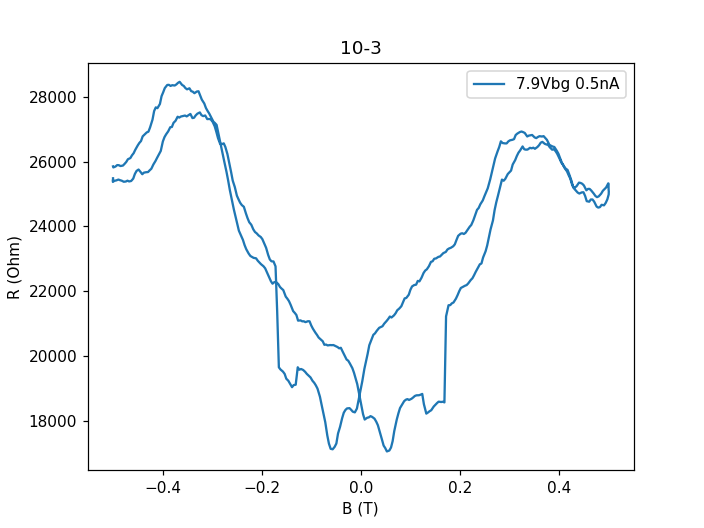

In [432]:
plt.figure()
plt.title('10-3')
plt.plot(*concathyst(data112, data113, 0.5e-9), label='7.9Vbg 0.5nA')
plt.xlabel('B (T)')
plt.ylabel('R (Ohm)')
plt.legend()

In [433]:
srframe.volt_p1(7.80)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data116, plot116 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data117, plot117 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.006 seconds
Started at 2020-04-07 17:24:25
DataSet:
   location = 'data/2020-04-07/#051_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-24-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 17:34:42
Sweep time approximately 610.012 seconds
Started at 2020-04-07 17:34:49
DataSet:
   location = 'data/2020-04-07/#052_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-34-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

In [435]:
srframe.volt_p1(7.80)
time.sleep(60)
triton.magnet_sweeprate(0.05)
triton.field(0.5)
data118, plot118 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data119, plot119 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 1210.006 seconds
Started at 2020-04-07 17:48:57
DataSet:
   location = 'data/2020-04-07/#053_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-48-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 18:09:16
Sweep time approximately 1210.006 seconds
Started at 2020-04-07 18:09:21
DataSet:
   location = 'data/2020-04-07/#054_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_18-09-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1

In [436]:
srframe.volt_p1(7.80)
time.sleep(60)
triton.magnet_sweeprate(0.02)
triton.field(0.5)
data120, plot120 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=60, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.02)
triton.field(-0.5)
data121, plot121 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=60, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 3009.97 seconds
Started at 2020-04-07 18:30:45
DataSet:
   location = 'data/2020-04-07/#055_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_18-30-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1800,)
   Measured | time0        | time0        | (1800,)
   Measured | triton_field | field        | (1800,)
   Measured | lockin865_X  | X            | (1800,)
   Measured | lockin865_Y  | Y            | (1800,)
   Measured | lockin830_X  | X            | (1800,)
   Measured | lockin830_Y  | Y            | (1800,)
Finished at 2020-04-07 19:21:11
Sweep time approximately 3009.988 seconds
Started at 2020-04-07 19:21:16
DataSet:
   location = 'data/2020-04-07/#056_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_19-21-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1800,)
   Measured | time0        | time0        | (1800,)
   Measured | triton_field | field        | (18

<IPython.core.display.Javascript object>


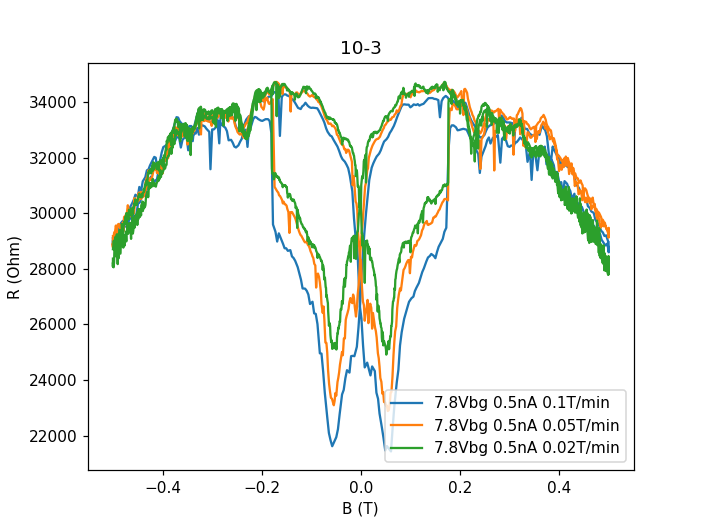

In [438]:
plt.figure()
plt.title('10-3')
plt.plot(*concathyst(data116, data117, 0.5e-9), label='7.8Vbg 0.5nA 0.1T/min')
plt.plot(*concathyst(data118, data119, 0.5e-9), label='7.8Vbg 0.5nA 0.05T/min')
plt.plot(*concathyst(data120, data121, 0.5e-9), label='7.8Vbg 0.5nA 0.02T/min')
plt.xlabel('B (T)')
plt.ylabel('R (Ohm)')
plt.legend()

In [439]:
srframe.volt_p1(7.80)
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data122, plot122 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data123, plot123 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 609.988 seconds
Started at 2020-04-07 21:28:09
DataSet:
   location = 'data/2020-04-07/#057_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_21-28-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 21:38:25
Sweep time approximately 610.006 seconds
Started at 2020-04-07 21:38:32
DataSet:
   location = 'data/2020-04-07/#058_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_21-38-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

In [440]:
triton.magnet_sweeprate(0.1)#stop at 100mT for 1min to see
triton.field(0.1)
data124, plot124 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.1, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data125, plot125 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 370.0 seconds
Started at 2020-04-07 21:48:57
DataSet:
   location = 'data/2020-04-07/#059_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_21-48-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 21:55:14
Sweep time approximately 249.994 seconds
Started at 2020-04-07 21:56:20
DataSet:
   location = 'data/2020-04-07/#060_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_21-56-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,

<IPython.core.display.Javascript object>


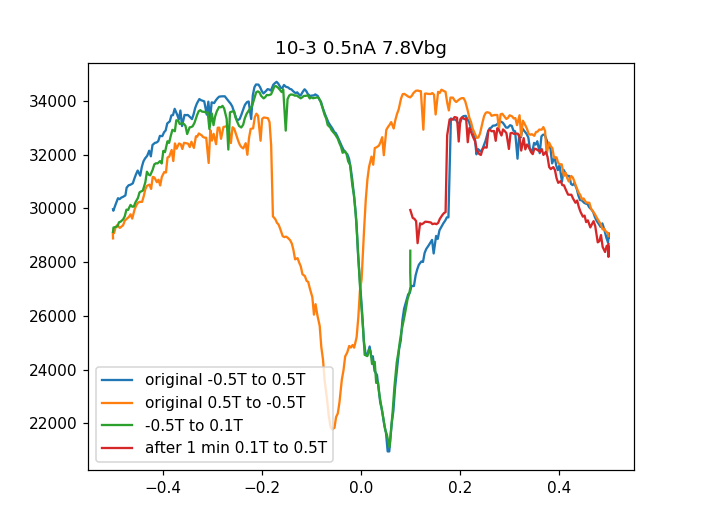

In [539]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data124.triton_field, data124.lockin865_X[:]/0.5e-9, label='-0.5T to 0.1T')
plt.plot(data125.triton_field, data125.lockin865_X[:]/0.5e-9, label='after 1 min 0.1T to 0.5T')
plt.legend()

In [455]:
triton.field(-0.5)

Sweep time approximately 610.012 seconds


In [453]:
triton.magnet_sweeprate(0.1)#stop at 35mT for 1min to see
triton.field(0.035)
data126, plot126 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.035, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data127, plot127 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 330.99399999999997 seconds
Started at 2020-04-07 22:16:18
DataSet:
   location = 'data/2020-04-07/#061_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_22-16-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 22:21:54
Sweep time approximately 288.99399999999997 seconds
Started at 2020-04-07 22:23:00
DataSet:
   location = 'data/2020-04-07/#062_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_22-22-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field

<IPython.core.display.Javascript object>


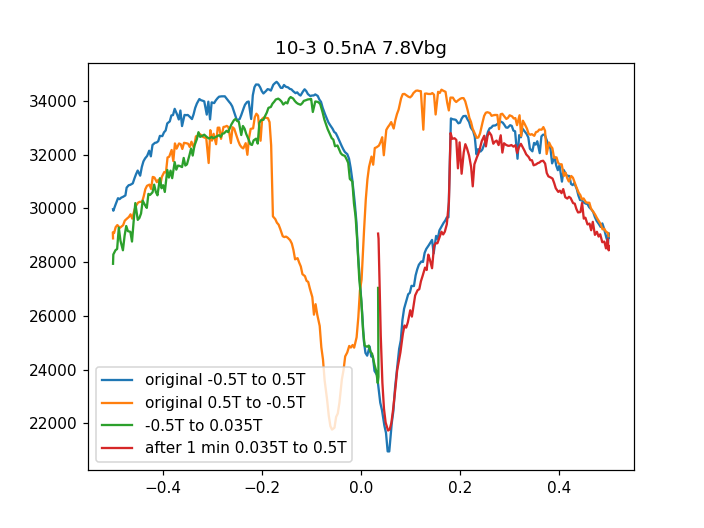

In [540]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data126.triton_field, data126.lockin865_X[:]/0.5e-9, label='-0.5T to 0.035T')
plt.plot(data127.triton_field, data127.lockin865_X[:]/0.5e-9, label='after 1 min 0.035T to 0.5T')
plt.legend()

In [466]:
triton.magnet_sweeprate(0.1)#stop at 3mT for 1min to see
triton.field(0.003)
data128, plot128 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.003, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data129, plot129 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 311.788 seconds
Started at 2020-04-07 22:45:52
DataSet:
   location = 'data/2020-04-07/#063_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_22-45-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 22:51:09
Sweep time approximately 308.206 seconds
Started at 2020-04-07 22:52:14
DataSet:
   location = 'data/2020-04-07/#064_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_22-52-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

<IPython.core.display.Javascript object>


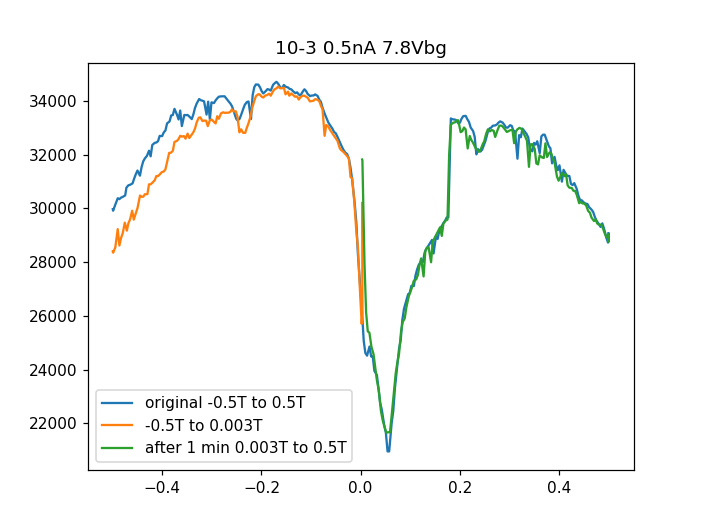

In [541]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data128.triton_field, data128.lockin865_X[:]/0.5e-9, label='-0.5T to 0.003T')
plt.plot(data129.triton_field, data129.lockin865_X[:]/0.5e-9, label='after 1 min 0.003T to 0.5T')
plt.legend()

In [476]:
triton.magnet_sweeprate(0.1)#stop at -5mT for 1min to see
triton.field(-0.005)
data130, plot130 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.005, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data131, plot131 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 307.0 seconds
Started at 2020-04-07 23:15:30
DataSet:
   location = 'data/2020-04-07/#065_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_23-15-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-07 23:20:44
Sweep time approximately 313.0 seconds
Started at 2020-04-07 23:21:50
DataSet:
   location = 'data/2020-04-07/#066_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_23-21-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


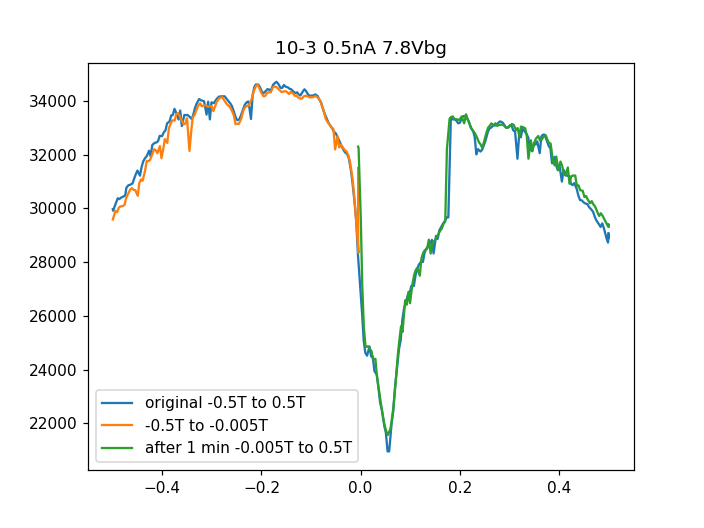

In [658]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data130.triton_field, data130.lockin865_X[:]/0.5e-9, label='-0.5T to -0.005T')
plt.plot(data131.triton_field, data131.lockin865_X[:]/0.5e-9, label='after 1 min -0.005T to 0.5T')
plt.legend()

In [483]:
triton.magnet_sweeprate(0.1)#stop at -60mT for 1min to see
triton.field(-0.06)
data132, plot132 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.06, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data133, plot133 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 274.00600000000003 seconds
Started at 2020-04-08 00:04:03
DataSet:
   location = 'data/2020-04-08/#001_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_00-04-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 00:08:43
Sweep time approximately 346.0 seconds
Started at 2020-04-08 00:09:49
DataSet:
   location = 'data/2020-04-08/#002_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_00-09-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field     

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


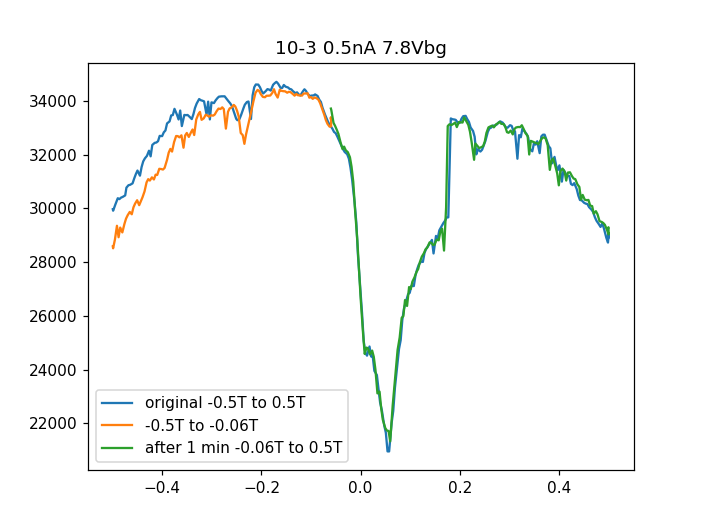

In [543]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data132.triton_field, data132.lockin865_X[:]/0.5e-9, label='-0.5T to -0.06T')
plt.plot(data133.triton_field, data133.lockin865_X[:]/0.5e-9, label='after 1 min -0.06T to 0.5T')
plt.legend()

<IPython.core.display.Javascript object>


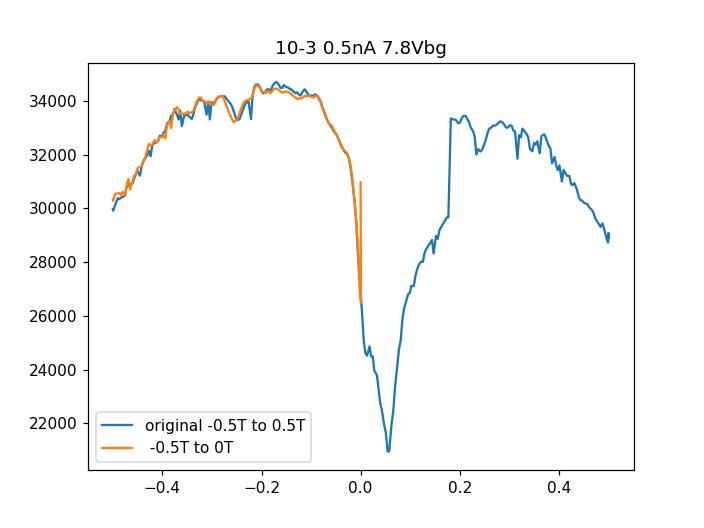

In [544]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data134.triton_field, data134.lockin865_X[:]/0.5e-9, label=' -0.5T to 0T')
plt.legend()

In [545]:
# then start from 0T and apply DC offset to see if there is domain switch

In [506]:
dc_vals = np.linspace(0, -7, 351) #70nA
data135, plot135 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0T')

Started at 2020-04-08 00:35:17
DataSet:
   location = 'data/2020-04-08/#004_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0T_00-35-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (351,)
   Measured | lockin865_X         | X            | (351,)
   Measured | lockin865_Y         | Y            | (351,)
Finished at 2020-04-08 00:47:38


<IPython.core.display.Javascript object>


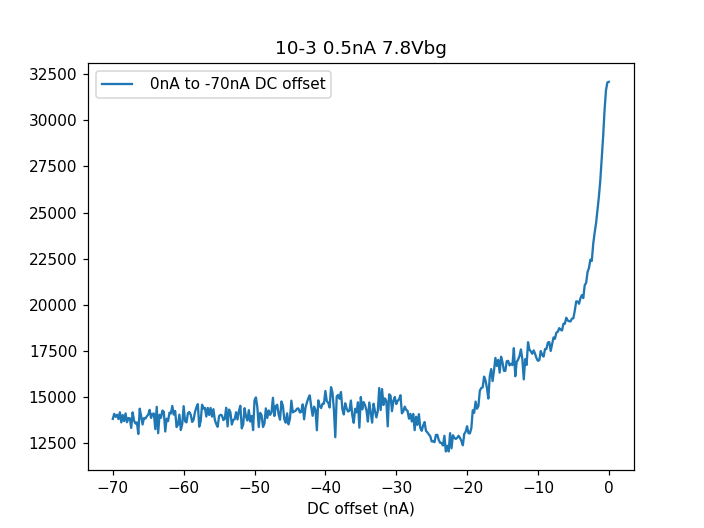

In [659]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data135.srframe_volt_p5_set[:]*10, data135.lockin865_X[:]/0.5e-9, label=' 0nA to -70nA DC offset')
plt.xlabel('DC offset (nA)')
plt.legend()

In [527]:
srframe.volt_p5()

0.0

In [508]:
dc_vals = np.linspace(-7, 7, 701) #70nA
data136, plot136 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0T')

Started at 2020-04-08 00:47:54
DataSet:
   location = 'data/2020-04-08/#005_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0T_00-47-53'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 01:12:34


In [509]:
dc_vals = np.linspace(7, -7, 701) #70nA
data137, plot137 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0T')

Started at 2020-04-08 01:15:44
DataSet:
   location = 'data/2020-04-08/#006_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0T_01-15-43'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 01:40:24


<IPython.core.display.Javascript object>


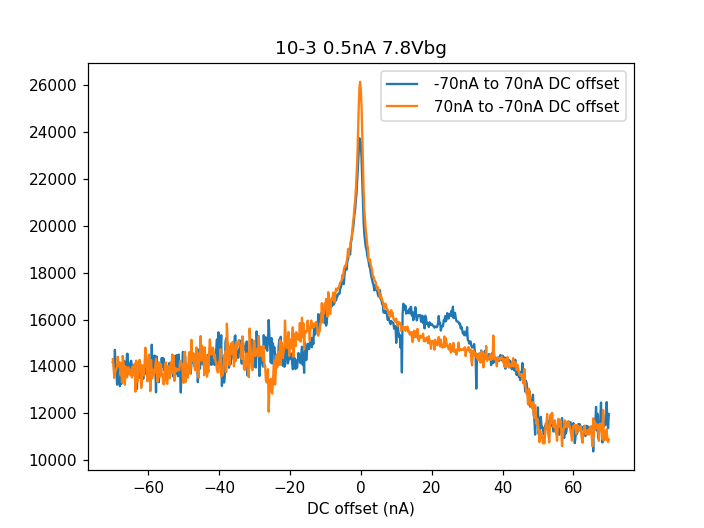

In [552]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data136.srframe_volt_p5_set[:]*10, data136.lockin865_X[:]/0.5e-9, label=' -70nA to 70nA DC offset')
plt.plot(data137.srframe_volt_p5_set[:]*10, data137.lockin865_X[:]/0.5e-9, label=' 70nA to -70nA DC offset')
plt.xlabel('DC offset (nA)')
plt.legend()

In [553]:
# then go from -70nA back to 0nA DC offset, now the resistance is around 24kOhm instead of the beginning 31kOhm

In [528]:
lockin865.X()

1.1786311916e-05

In [529]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data138, plot138 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 310.006 seconds
Started at 2020-04-08 01:47:50
DataSet:
   location = 'data/2020-04-08/#007_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_01-47-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 01:53:07


<IPython.core.display.Javascript object>


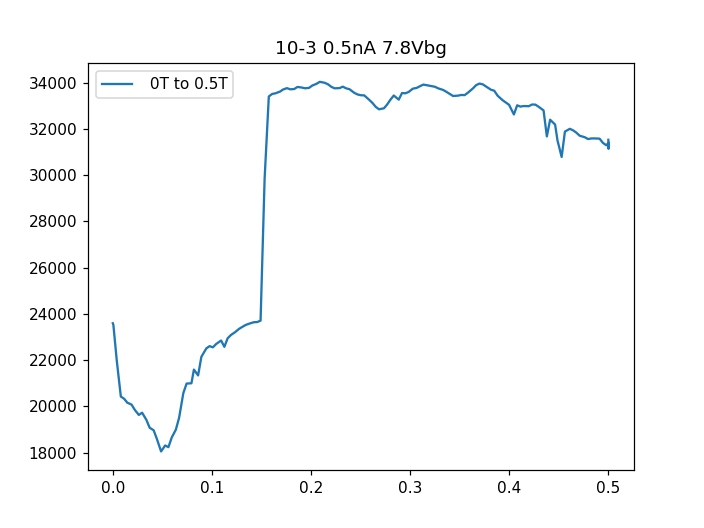

In [554]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data138.triton_field, data138.lockin865_X[:]/0.5e-9, label=' 0T to 0.5T')
plt.legend()

In [555]:
#go to -0.5T sweep again

In [536]:
triton.magnet_sweeprate(0.1)#sweep again after DC SWEEP
triton.field(0.5)
data139, plot139 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data140, plot140 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.012 seconds
Started at 2020-04-08 11:02:21
DataSet:
   location = 'data/2020-04-08/#008_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_11-02-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 11:12:39
Sweep time approximately 610.006 seconds
Started at 2020-04-08 11:13:44
DataSet:
   location = 'data/2020-04-08/#009_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_11-13-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

<IPython.core.display.Javascript object>


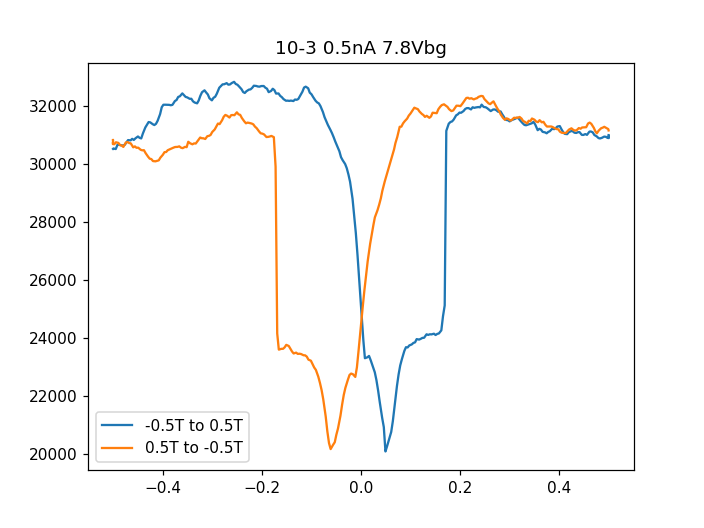

In [538]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data122.triton_field, data122.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='-0.5T to 0.5T')
plt.plot(data140.triton_field, data140.lockin865_X[:]/0.5e-9, label='0.5T to -0.5T')
plt.legend()

In [570]:
triton.magnet_sweeprate(0.1)#stop at 50mT
triton.field(0.05)
data141, plot141 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.05, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data142, plot142 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 340.006 seconds
Started at 2020-04-08 13:11:52
DataSet:
   location = 'data/2020-04-08/#011_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_13-11-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 13:17:37
Sweep time approximately 279.994 seconds
Started at 2020-04-08 13:18:43
DataSet:
   location = 'data/2020-04-08/#012_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_13-18-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (120

<IPython.core.display.Javascript object>


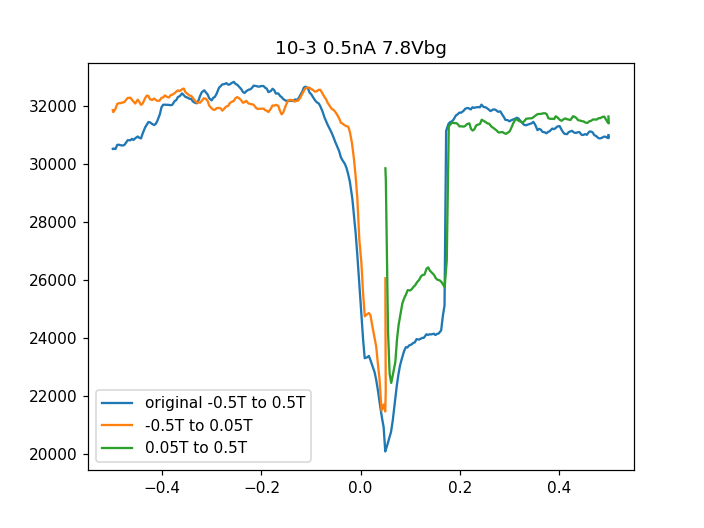

In [577]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data141.triton_field, data141.lockin865_X[:]/0.5e-9, label='-0.5T to 0.05T')
plt.plot(data142.triton_field, data142.lockin865_X[:]/0.5e-9, label='0.05T to 0.5T')
plt.legend()

In [574]:
triton.magnet_sweeprate(0.1)#stop at 120mT
triton.field(0.12)
data143, plot143 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.12, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data144, plot144 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 382.0 seconds
Started at 2020-04-08 13:48:37
DataSet:
   location = 'data/2020-04-08/#013_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_13-48-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 13:55:06
Sweep time approximately 238.0 seconds
Started at 2020-04-08 13:56:12
DataSet:
   location = 'data/2020-04-08/#014_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_13-56-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)


<IPython.core.display.Javascript object>


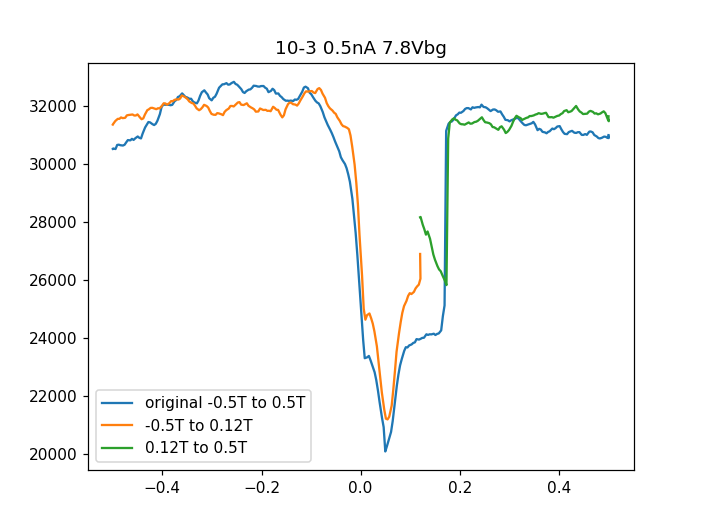

In [578]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data143.triton_field, data143.lockin865_X[:]/0.5e-9, label='-0.5T to 0.12T')
plt.plot(data144.triton_field, data144.lockin865_X[:]/0.5e-9, label='0.12T to 0.5T')
plt.legend()

In [580]:
triton.magnet_sweeprate(0.1)#stop at -60mT
triton.field(-0.06)
data145, plot145 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.06, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data146, plot146 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 274.012 seconds
Started at 2020-04-08 15:25:34
DataSet:
   location = 'data/2020-04-08/#015_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_15-25-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 15:30:15
Sweep time approximately 346.07800000000003 seconds
Started at 2020-04-08 15:31:20
DataSet:
   location = 'data/2020-04-08/#016_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_15-31-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field   

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


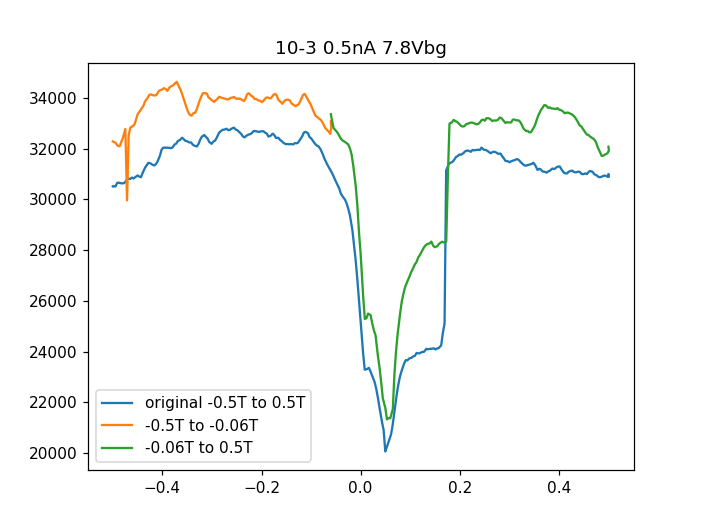

In [581]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data145.triton_field, data145.lockin865_X[:]/0.5e-9, label='-0.5T to -0.06T')
plt.plot(data146.triton_field, data146.lockin865_X[:]/0.5e-9, label='-0.06T to 0.5T')
plt.legend()

In [585]:
triton.magnet_sweeprate(0.1)#stop at 150mT
triton.field(0.15)
data147, plot147 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.15, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data148, plot148 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 400.0 seconds
Started at 2020-04-08 16:11:42
DataSet:
   location = 'data/2020-04-08/#017_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_16-11-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 16:18:29
Sweep time approximately 219.994 seconds
Started at 2020-04-08 16:19:34
DataSet:
   location = 'data/2020-04-08/#018_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_16-19-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


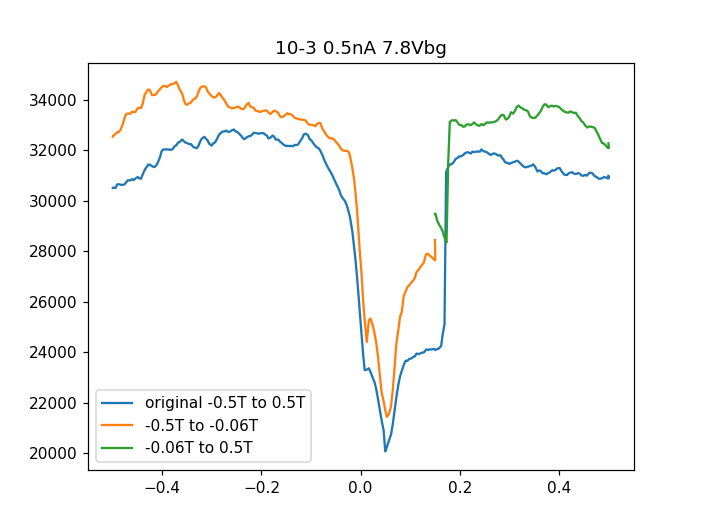

In [586]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data147.triton_field, data147.lockin865_X[:]/0.5e-9, label='-0.5T to -0.06T')
plt.plot(data148.triton_field, data148.lockin865_X[:]/0.5e-9, label='-0.06T to 0.5T')
plt.legend()

In [588]:
triton.field(-0.5)

Sweep time approximately 609.994 seconds


In [589]:
triton.magnet_sweeprate(0.1)#stop at 100mT then go back
triton.field(0.1)
data149, plot149 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.1, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data150, plot150 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 370.0 seconds
Started at 2020-04-08 17:10:26
DataSet:
   location = 'data/2020-04-08/#019_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-10-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 17:16:43
Sweep time approximately 370.012 seconds
Started at 2020-04-08 17:17:49
DataSet:
   location = 'data/2020-04-08/#020_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-17-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


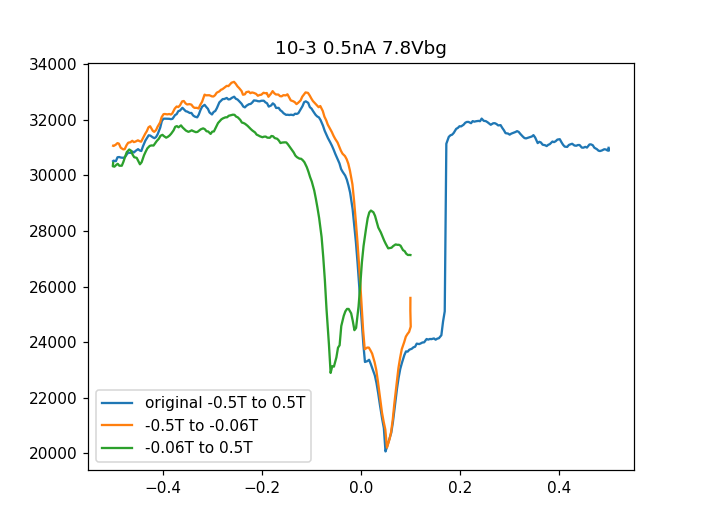

In [590]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data149.triton_field, data149.lockin865_X[:]/0.5e-9, label='-0.5T to -0.06T')
plt.plot(data150.triton_field, data150.lockin865_X[:]/0.5e-9, label='-0.06T to 0.5T')
plt.legend()

In [591]:
triton.magnet_sweeprate(0.1)#stop at 35mT then go back
triton.field(0.035)
data151, plot151 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.035, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data152, plot152 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 330.988 seconds
Started at 2020-04-08 17:39:59
DataSet:
   location = 'data/2020-04-08/#021_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-39-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 17:45:36
Sweep time approximately 331.0 seconds
Started at 2020-04-08 17:46:41
DataSet:
   location = 'data/2020-04-08/#022_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_17-46-41'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,

<IPython.core.display.Javascript object>


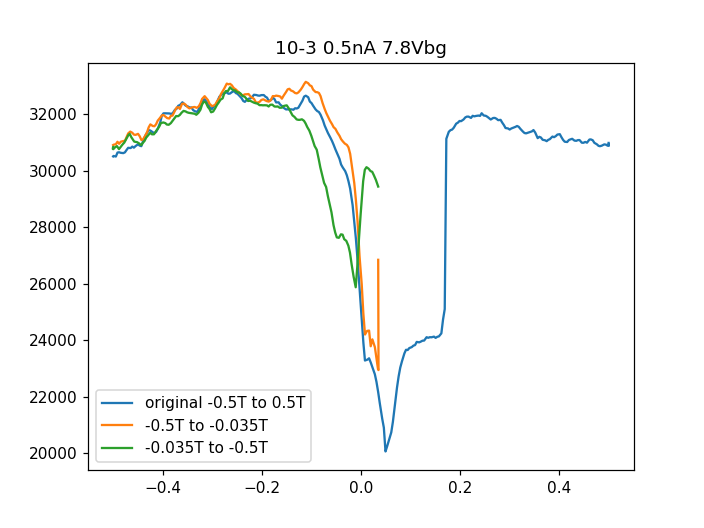

In [593]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data151.triton_field, data151.lockin865_X[:]/0.5e-9, label='-0.5T to -0.035T')
plt.plot(data152.triton_field, data152.lockin865_X[:]/0.5e-9, label='-0.035T to -0.5T')
plt.legend()

In [594]:
triton.field()

-0.499997

In [595]:
triton.magnet_sweeprate(0.1)
triton.field(0.15)
data153, plot153 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.035, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)

Sweep time approximately 400.012 seconds
Started at 2020-04-08 18:06:47
DataSet:
   location = 'data/2020-04-08/#023_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_18-06-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 18:14:34
Keyboard Interrupt


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


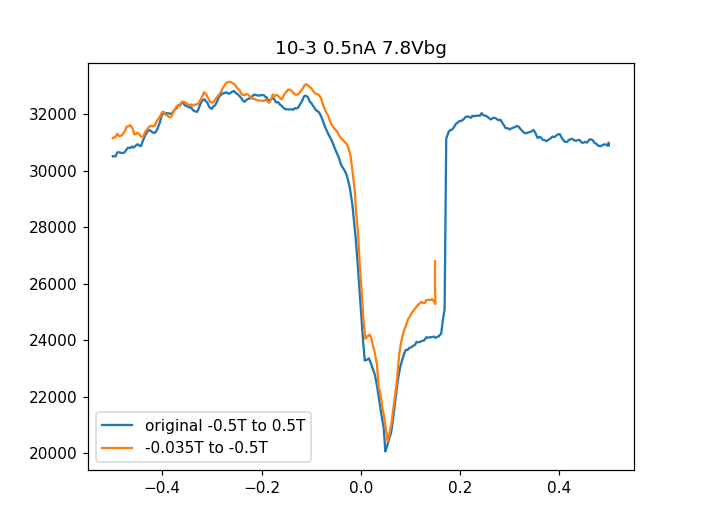

In [615]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data153.triton_field, data153.lockin865_X[:]/0.5e-9, label='-0.035T to -0.5T')
plt.legend()

In [596]:
dc_vals = np.linspace(0, -7, 351) #70nA
data154, plot154 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T')

Started at 2020-04-08 18:15:35
DataSet:
   location = 'data/2020-04-08/#024_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T_18-15-35'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (351,)
   Measured | lockin865_X         | X            | (351,)
   Measured | lockin865_Y         | Y            | (351,)
Finished at 2020-04-08 18:27:56


<IPython.core.display.Javascript object>


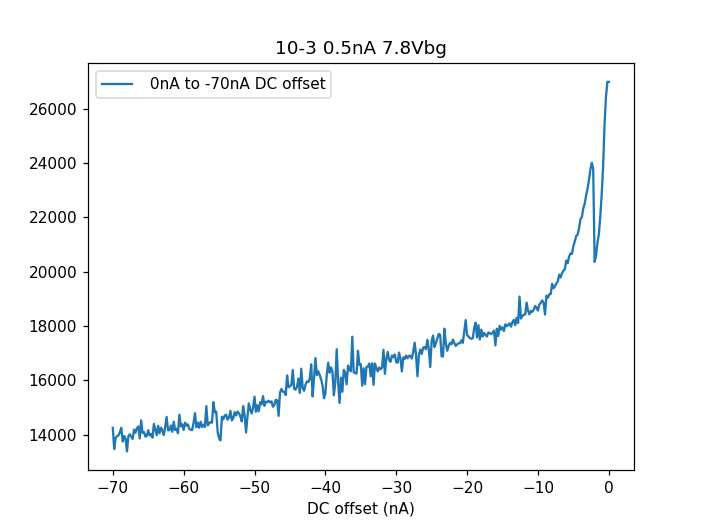

In [616]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data154.srframe_volt_p5_set[:]*10, data154.lockin865_X[:]/0.5e-9, label=' 0nA to -70nA DC offset')
plt.xlabel('DC offset (nA)')
plt.legend()

In [597]:
dc_vals = np.linspace(-7, 7, 701) #70nA
data155, plot155 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T')

Started at 2020-04-08 18:27:57
DataSet:
   location = 'data/2020-04-08/#025_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T_18-27-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 18:52:37


In [598]:
dc_vals = np.linspace(-7, 7, 701) #70nA
data156, plot156 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T')

Started at 2020-04-08 18:52:38
DataSet:
   location = 'data/2020-04-08/#026_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T_18-52-37'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 19:17:56


In [599]:
dc_vals = np.linspace(7, -7, 701) #70nA
data157, plot157 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T')

Started at 2020-04-08 19:35:59
DataSet:
   location = 'data/2020-04-08/#027_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T_19-35-58'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 20:00:38


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


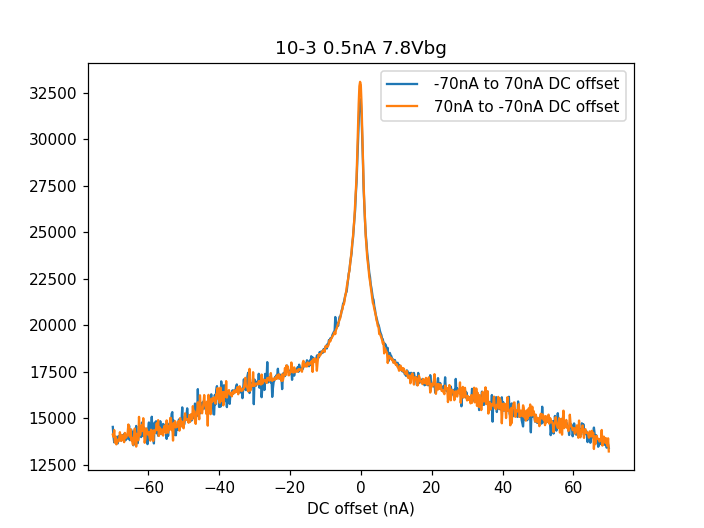

In [638]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data155.srframe_volt_p5_set[:]*10, data155.lockin865_X[:]/0.5e-9, label=' -70nA to 70nA DC offset')
plt.plot(data157.srframe_volt_p5_set[:]*10, data157.lockin865_X[:]/0.5e-9, label=' 70nA to -70nA DC offset')
plt.xlabel('DC offset (nA)')
plt.legend()

In [612]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data158, plot158 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.035, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 219.994 seconds
Started at 2020-04-08 20:18:58
DataSet:
   location = 'data/2020-04-08/#028_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_20-18-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 20:31:42
Keyboard Interrupt


<IPython.core.display.Javascript object>


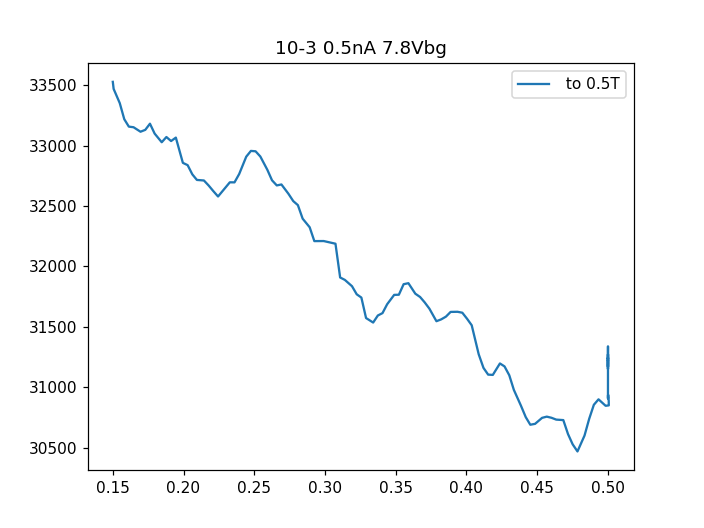

In [660]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data158.triton_field, data158.lockin865_X[:]/0.5e-9, label=' to 0.5T')
plt.legend()

In [621]:
triton.field()

-0.500003

In [622]:
triton.magnet_sweeprate(0.1)
triton.field(0.15)
data159, plot159 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.15, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)

Sweep time approximately 399.994 seconds
Started at 2020-04-08 20:43:43
DataSet:
   location = 'data/2020-04-08/#029_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_20-43-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 20:50:29


<IPython.core.display.Javascript object>


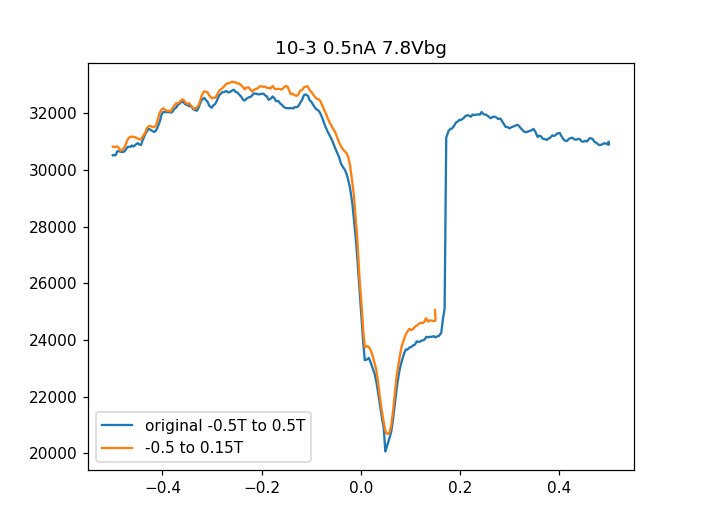

In [661]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data159.triton_field, data159.lockin865_X[:]/0.5e-9, label='-0.5 to 0.15T')
plt.legend()

In [623]:
dc_vals = np.linspace(0, -7, 351) #70nA
data160, plot160 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T')

Started at 2020-04-08 20:51:30
DataSet:
   location = 'data/2020-04-08/#030_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T_20-51-29'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (351,)
   Measured | lockin865_X         | X            | (351,)
   Measured | lockin865_Y         | Y            | (351,)
Finished at 2020-04-08 21:03:51


In [624]:
srframe.volt_p5(0)

In [628]:
triton.field()

-0.500017

In [629]:
triton.magnet_sweeprate(0.1)
triton.field(0.075)
data161, plot161 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.075, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)

Sweep time approximately 355.006 seconds
Started at 2020-04-08 21:14:49
DataSet:
   location = 'data/2020-04-08/#031_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_21-14-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 21:20:51


<IPython.core.display.Javascript object>


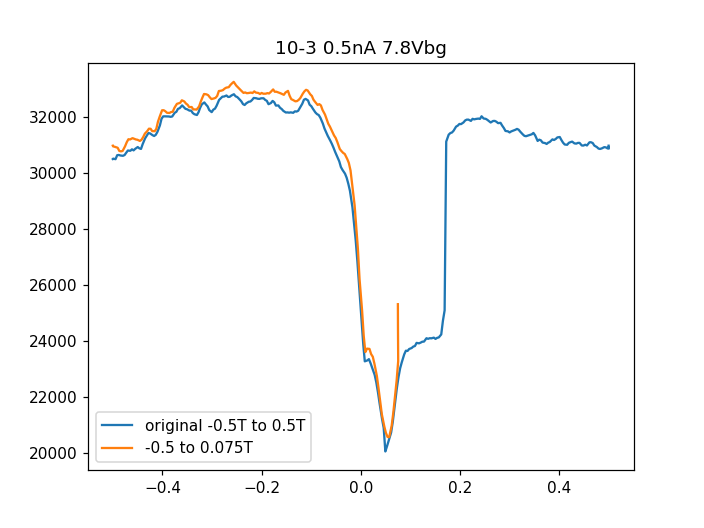

In [663]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data139.triton_field, data139.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
#plt.plot(data123.triton_field, data123.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')
plt.plot(data161.triton_field, data161.lockin865_X[:]/0.5e-9, label='-0.5 to 0.075T')
plt.legend()

In [630]:
dc_vals = np.linspace(0, -7, 351) #70nA
data162, plot162 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.075T')

Started at 2020-04-08 21:21:52
DataSet:
   location = 'data/2020-04-08/#032_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.075T_21-21-51'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (351,)
   Measured | lockin865_X         | X            | (351,)
   Measured | lockin865_Y         | Y            | (351,)
Finished at 2020-04-08 21:34:13


<IPython.core.display.Javascript object>


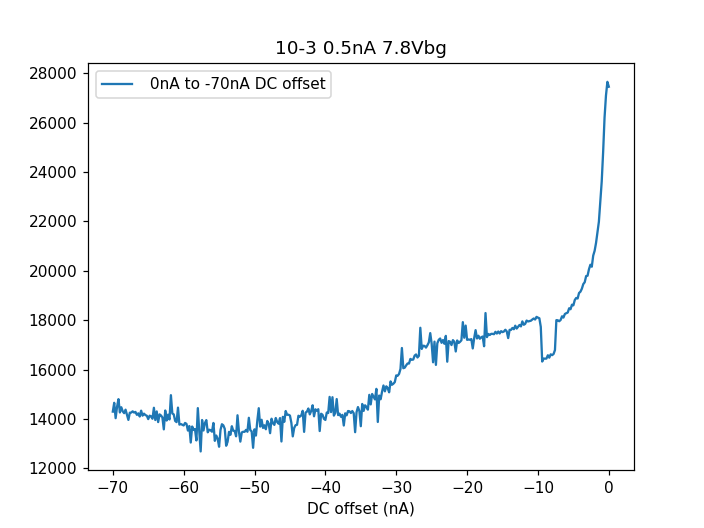

In [664]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data162.srframe_volt_p5_set[:]*10, data162.lockin865_X[:]/0.5e-9, label=' 0nA to -70nA DC offset')
plt.xlabel('DC offset (nA)')
plt.legend()

In [631]:
dc_vals = np.linspace(-7, 7, 701) #70nA
data163, plot163 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.075T')

Started at 2020-04-08 21:34:14
DataSet:
   location = 'data/2020-04-08/#033_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.075T_21-34-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 21:58:53


In [632]:
dc_vals = np.linspace(7, -7, 701) #70nA
data164, plot164 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.075T')

Started at 2020-04-08 22:05:21
DataSet:
   location = 'data/2020-04-08/#034_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.075T_22-05-21'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (701,)
   Measured | lockin865_X         | X            | (701,)
   Measured | lockin865_Y         | Y            | (701,)
Finished at 2020-04-08 22:30:01


<IPython.core.display.Javascript object>


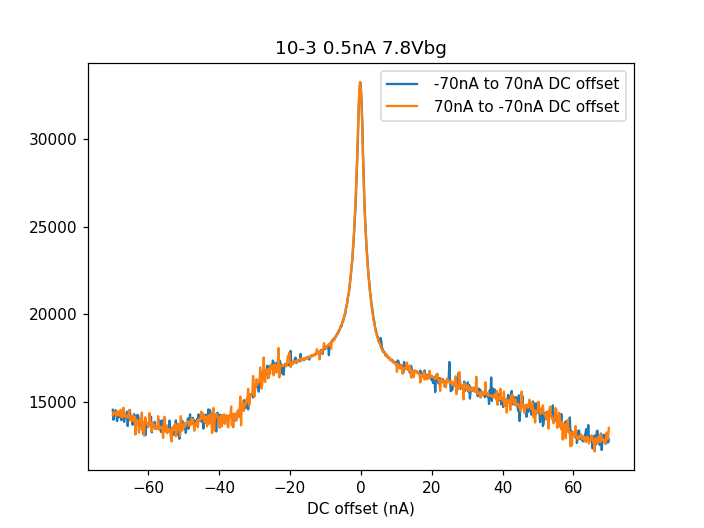

In [665]:
plt.figure()
plt.title('10-3 0.5nA 7.8Vbg')
plt.plot(data163.srframe_volt_p5_set[:]*10, data163.lockin865_X[:]/0.5e-9, label=' -70nA to 70nA DC offset')
plt.plot(data164.srframe_volt_p5_set[:]*10, data164.lockin865_X[:]/0.5e-9, label=' 70nA to -70nA DC offset')
plt.xlabel('DC offset (nA)')
plt.legend()

In [642]:
triton.field()

-0.500017

In [637]:
#see 0.15T DC bias jump is just on negative or also positive

In [643]:
triton.magnet_sweeprate(0.1)
triton.field(0.15)
data165, plot165 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.15, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)

Sweep time approximately 400.0 seconds
Started at 2020-04-08 22:45:12
DataSet:
   location = 'data/2020-04-08/#035_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_22-45-11'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 22:51:59


In [644]:
dc_vals = np.linspace(0, 7, 351) #70nA
data166, plot166 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T')

Started at 2020-04-08 22:53:10
DataSet:
   location = 'data/2020-04-08/#036_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.15T_22-53-09'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (351,)
   Measured | lockin865_X         | X            | (351,)
   Measured | lockin865_Y         | Y            | (351,)
Finished at 2020-04-08 23:05:31


In [645]:
srframe.volt_p5(0)

In [646]:
triton.field(-0.5)

Sweep time approximately 400.006 seconds


In [647]:
triton.magnet_sweeprate(0.1)
triton.field(-0.2)
data167, plot167 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.2, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)

Sweep time approximately 190.0 seconds
Started at 2020-04-08 23:51:07
DataSet:
   location = 'data/2020-04-08/#037_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_23-51-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-08 23:54:22


In [648]:
dc_vals = np.linspace(0, -7, 281) #70nA
data168, plot168 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_-0.2T')

Started at 2020-04-08 23:56:04
DataSet:
   location = 'data/2020-04-08/#038_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_-0.2T_23-56-04'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (281,)
   Measured | lockin865_X         | X            | (281,)
   Measured | lockin865_Y         | Y            | (281,)
Finished at 2020-04-09 00:06:11


In [649]:
dc_vals = np.linspace(-7, 7, 561) #70nA
data169, plot169 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_-0.2T')

Started at 2020-04-09 00:06:12
DataSet:
   location = 'data/2020-04-09/#001_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_-0.2T_00-06-11'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (561,)
   Measured | lockin865_X         | X            | (561,)
   Measured | lockin865_Y         | Y            | (561,)
Finished at 2020-04-09 00:25:56


In [650]:
dc_vals = np.linspace(7, -7, 561) #70nA
data170, plot170 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_-0.2T')

Started at 2020-04-09 00:25:57
Request timed out: ('getObjAttr', 629158, 0, b'\x80\x03}q\x00(X\x03\x00\x00\x00objq\x01cpyqtgraph.multiprocess.remoteproxy\nunpickleObjectProxy\nq\x02(Mp2J\xba\xdd\x04\x00XP\x00\x00\x00<pyqtgraph.graphicsItems.PlotDataItem.PlotDataItem object at 0x000001D1859EB798>q\x03)tq\x04Rq\x05X\x04\x00\x00\x00attrq\x06X\x07\x00\x00\x00setDataq\x07X\n\x00\x00\x00returnTypeq\x08X\x04\x00\x00\x00autoq\tu.')


  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-04-09/#002_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_-0.2T_00-25-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (561,)
   Measured | lockin865_X         | X            | (561,)
   Measured | lockin865_Y         | Y            | (561,)
Finished at 2020-04-09 00:46:11


In [651]:
srframe.volt_p5(0)

In [653]:
triton.field()

-0.499997

In [654]:
triton.magnet_sweeprate(0.1)
triton.field(0.27)
data171, plot171 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.27, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)

Sweep time approximately 472.0 seconds
Started at 2020-04-09 09:26:33
DataSet:
   location = 'data/2020-04-09/#003_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_09-26-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-09 09:34:31


In [655]:
dc_vals = np.linspace(0, -7, 281) #70nA
data172, plot172 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.27T')

Started at 2020-04-09 09:35:32
DataSet:
   location = 'data/2020-04-09/#004_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.27T_09-35-31'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (281,)
   Measured | lockin865_X         | X            | (281,)
   Measured | lockin865_Y         | Y            | (281,)
Finished at 2020-04-09 09:45:25


In [656]:
dc_vals = np.linspace(-7, 7, 561) #70nA
data173, plot173 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.27T')

Started at 2020-04-09 09:45:26
DataSet:
   location = 'data/2020-04-09/#005_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.27T_09-45-25'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (561,)
   Measured | lockin865_X         | X            | (561,)
   Measured | lockin865_Y         | Y            | (561,)
Finished at 2020-04-09 10:05:16


In [657]:
dc_vals = np.linspace(7, -7, 561) #70nA
data174, plot174 = npd.single_param_sweep(srframe.volt_p5, dc_vals, 2, lockin865.X, lockin865.Y, DataName='M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.27T')

Started at 2020-04-09 10:05:17
DataSet:
   location = 'data/2020-04-09/#006_M26_DCsweep_865_10-3_Vg7.8V_baseT_0p5nA_0.27T_10-05-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (561,)
   Measured | lockin865_X         | X            | (561,)
   Measured | lockin865_Y         | Y            | (561,)
Finished at 2020-04-09 10:25:01


In [672]:
triton.field(0)

Sweep time approximately 172.006 seconds


In [673]:
srframe.volt_p1(0)

In [674]:
# now I+9 I-3&4 V+10 V-5 to see Rxy component

In [675]:
gvals = np.linspace(0, 10, 101)
data175, plot175 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-5_0.5nA')

Started at 2020-04-09 15:25:48
DataSet:
   location = 'data/2020-04-09/#007_M26_gatsweep_865_10-5_0.5nA_15-25-47'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
Finished at 2020-04-09 15:29:37


<IPython.core.display.Javascript object>


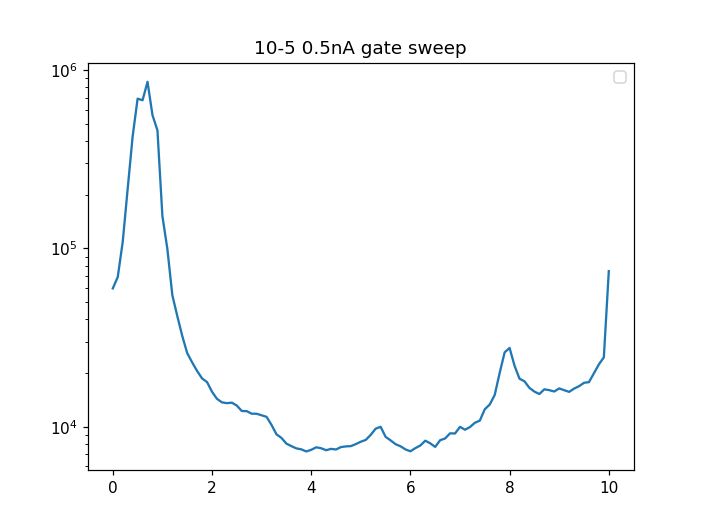

No handles with labels found to put in legend.


In [677]:
plt.figure()
plt.title('10-5 0.5nA gate sweep')
plt.semilogy(data175.srframe_volt_p1_set[:], data175.lockin865_X[:]/0.5e-9)

plt.legend()

In [678]:
srframe.volt_p1(7.8)

In [679]:
triton.field(-0.5)

Sweep time approximately 310.0 seconds


In [680]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data176, plot176 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_10-5_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data177, plot177 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-09 15:37:34
DataSet:
   location = 'data/2020-04-09/#008_M26_gatsweep_865_10-5_Vg7.8V_baseT_0p5nA_15-37-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 15:47:50
Sweep time approximately 610.0 seconds
Started at 2020-04-09 15:48:56
DataSet:
   location = 'data/2020-04-09/#009_M26_gatsweep_865_10-3_Vg7.8V_baseT_0p5nA_15-48-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)


<IPython.core.display.Javascript object>


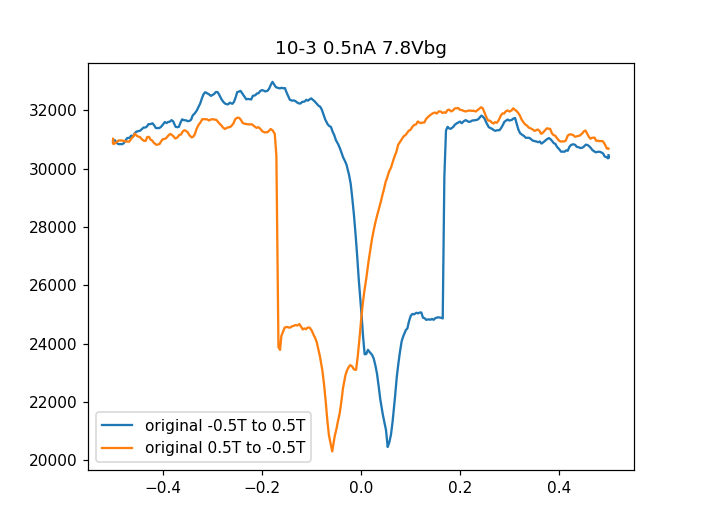

In [682]:
plt.figure()
plt.title('10-5 0.5nA 7.8Vbg')
plt.plot(data176.triton_field, data176.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data177.triton_field, data177.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')

plt.legend()

In [683]:
#switch the contact 10 and 5

In [684]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data178, plot178 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_5-10_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data179, plot179 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_5-10_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-09 16:07:02
DataSet:
   location = 'data/2020-04-09/#010_M26_gatsweep_865_5-10_Vg7.8V_baseT_0p5nA_16-07-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 16:17:19
Sweep time approximately 610.006 seconds
Started at 2020-04-09 16:18:24
DataSet:
   location = 'data/2020-04-09/#011_M26_gatsweep_865_5-10_Vg7.8V_baseT_0p5nA_16-18-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


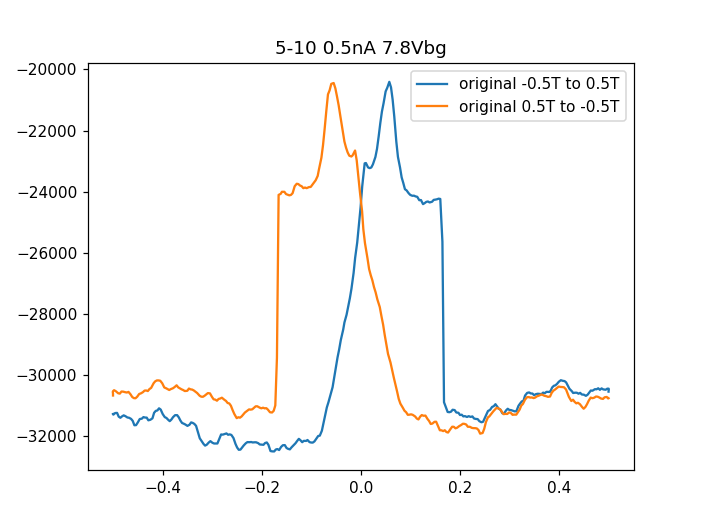

In [692]:
plt.figure()
plt.title('5-10 0.5nA 7.8Vbg')
plt.plot(data178.triton_field, data178.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data179.triton_field, data179.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')

plt.legend()

In [691]:
#next try  Onsager symmetrization
#define 9 as A
#      10 as B
#     3&4 as C
#       5 as D

In [ ]:
# first try I+A I-D V+B V-C

In [685]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data180, plot180 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager1_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data181, plot181 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager2_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-09 16:33:07
DataSet:
   location = 'data/2020-04-09/#012_M26_gatsweep_865_onsager1_Vg7.8V_baseT_0p5nA_16-33-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 16:43:24
Sweep time approximately 610.0 seconds
Started at 2020-04-09 16:44:30
DataSet:
   location = 'data/2020-04-09/#013_M26_gatsweep_865_onsager1_Vg7.8V_baseT_0p5nA_16-44-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

<IPython.core.display.Javascript object>


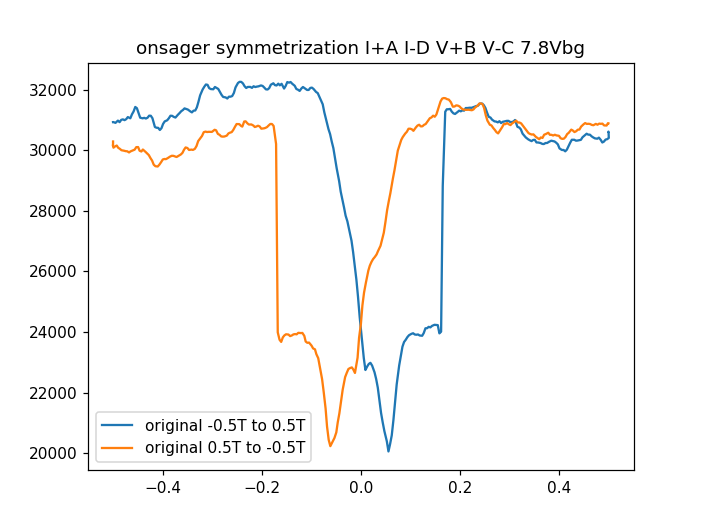

In [694]:
plt.figure()
plt.title('onsager symmetrization I+A I-D V+B V-C 7.8Vbg')
plt.plot(data180.triton_field, data180.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data181.triton_field, data181.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')

plt.legend()

In [ ]:
# try I+B I-C V+A V-D

In [686]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data182, plot182 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager1_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data183, plot183 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager2_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.006 seconds
Started at 2020-04-09 17:00:16
DataSet:
   location = 'data/2020-04-09/#014_M26_gatsweep_865_onsager1_Vg7.8V_baseT_0p5nA_17-00-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 17:10:32
Sweep time approximately 610.0 seconds
Started at 2020-04-09 17:11:38
DataSet:
   location = 'data/2020-04-09/#015_M26_gatsweep_865_onsager2_Vg7.8V_baseT_0p5nA_17-11-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            

<IPython.core.display.Javascript object>


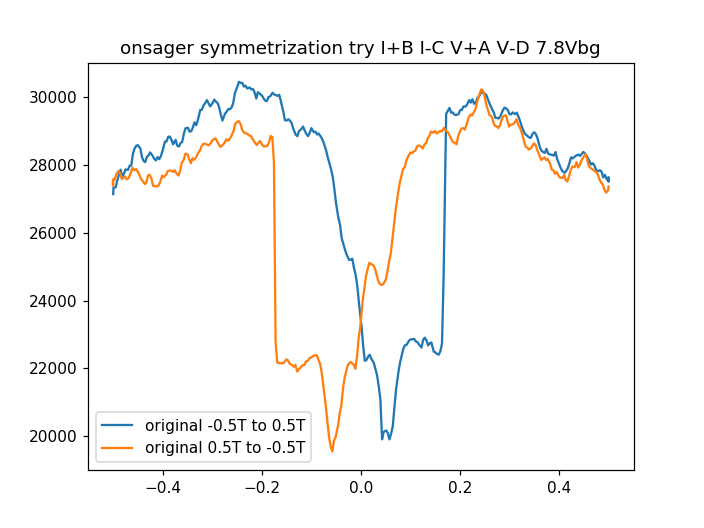

In [696]:
plt.figure()
plt.title('onsager symmetrization try I+B I-C V+A V-D 7.8Vbg')
plt.plot(data182.triton_field, data182.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data183.triton_field, data183.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')

plt.legend()

In [ ]:
# try I+A I-C V+B V-D

In [687]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data184, plot184 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data185, plot185 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager3_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-09 17:29:24
DataSet:
   location = 'data/2020-04-09/#016_M26_gatsweep_865_onsager3_Vg7.8V_baseT_0p5nA_17-29-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 17:39:40
Sweep time approximately 610.0 seconds
Started at 2020-04-09 17:40:46
DataSet:
   location = 'data/2020-04-09/#017_M26_gatsweep_865_onsager3_Vg7.8V_baseT_0p5nA_17-40-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

<IPython.core.display.Javascript object>


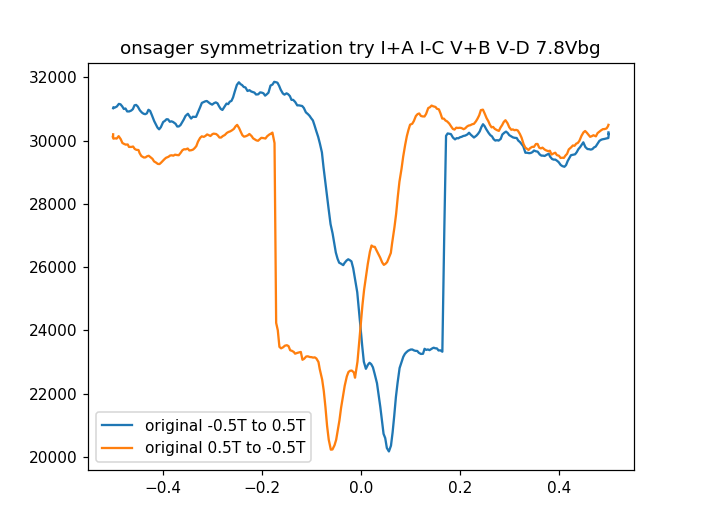

In [697]:
plt.figure()
plt.title('onsager symmetrization try I+A I-C V+B V-D 7.8Vbg')
plt.plot(data184.triton_field, data184.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data185.triton_field, data185.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')

plt.legend()

In [ ]:
# try I+B I-D V+A V-C

In [688]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data186, plot186 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager4_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data187, plot187 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_gatsweep_865_onsager4_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-09 17:53:46
DataSet:
   location = 'data/2020-04-09/#018_M26_gatsweep_865_onsager4_Vg7.8V_baseT_0p5nA_17-53-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 18:04:02
Sweep time approximately 610.0 seconds
Started at 2020-04-09 18:05:08
DataSet:
   location = 'data/2020-04-09/#019_M26_gatsweep_865_onsager4_Vg7.8V_baseT_0p5nA_18-05-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | 

<IPython.core.display.Javascript object>


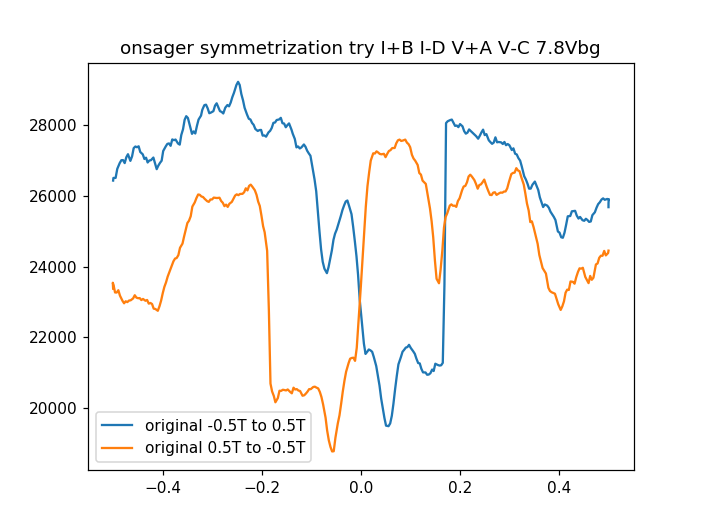

In [698]:
plt.figure()
plt.title('onsager symmetrization try I+B I-D V+A V-C 7.8Vbg')
plt.plot(data186.triton_field, data186.lockin865_X[:]/0.5e-9, label='original -0.5T to 0.5T')
plt.plot(data187.triton_field, data187.lockin865_X[:]/0.5e-9, label='original 0.5T to -0.5T')

plt.legend()

In [740]:
triton.field()

0.4

In [734]:
srframe.volt_p1(0)

In [ ]:
gvals = np.linspace(0, 10, 201)
data188, plot188 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-5_0.5nA')

In [727]:
gvals = np.linspace(0, 10, 201)
data189, plot189 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-5_0.5nA_-0.4T')

Started at 2020-04-09 21:44:38
DataSet:
   location = 'data/2020-04-09/#021_M26_gatsweep_865_10-5_0.5nA_-0.4T_21-44-37'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-04-09 21:51:42


In [ ]:
gvals = np.linspace(0, 10, 201)
data190, plot190 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-5_0.5nA_0.1T')

In [741]:
gvals = np.linspace(0, 10, 201)
data191, plot191 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, DataName='M26_gatsweep_865_10-5_0.5nA_0.4T')

Started at 2020-04-09 22:17:14
DataSet:
   location = 'data/2020-04-09/#023_M26_gatsweep_865_10-5_0.5nA_0.4T_22-17-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-04-09 22:24:19


<IPython.core.display.Javascript object>


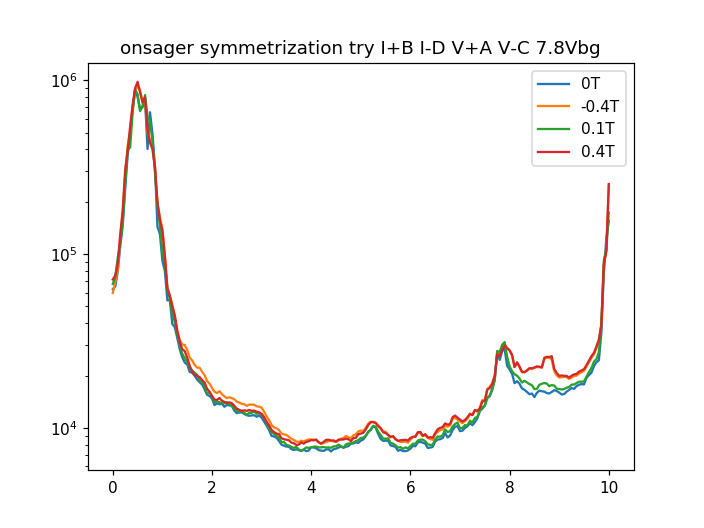

In [746]:
plt.figure()
plt.title('onsager symmetrization try I+B I-D V+A V-C 7.8Vbg')
plt.semilogy(data188.srframe_volt_p1_set, data188.lockin865_X[:]/0.5e-9, label='0T')
plt.semilogy(data189.srframe_volt_p1_set, data189.lockin865_X[:]/0.5e-9, label='-0.4T')
plt.semilogy(data190.srframe_volt_p1_set, data190.lockin865_X[:]/0.5e-9, label='0.1T')
plt.semilogy(data191.srframe_volt_p1_set, data191.lockin865_X[:]/0.5e-9, label='0.4T')
plt.legend()

In [759]:
srframe.volt_p1(7.8)

In [757]:
triton.field()

-0.500003

In [761]:
lockin865.X()

1.4470659153e-05

In [755]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data192, plot192 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_fieldsweep_865_10-5_Vg8.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data193, plot193 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_fieldsweep_865_10-5_Vg8.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-09 22:39:36
DataSet:
   location = 'data/2020-04-09/#024_M26_fieldsweep_865_10-5_Vg8.8V_baseT_0p5nA_22-39-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-09 22:49:52
Sweep time approximately 610.012 seconds
Started at 2020-04-09 22:50:58
DataSet:
   location = 'data/2020-04-09/#025_M26_fieldsweep_865_10-5_Vg8.8V_baseT_0p5nA_22-50-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1

In [763]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data194, plot194 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_fieldsweep_865_10-5_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data195, plot195 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_fieldsweep_865_10-5_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-10 15:31:49
DataSet:
   location = 'data/2020-04-10/#001_M26_fieldsweep_865_10-5_Vg7.8V_baseT_0p5nA_15-31-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-10 15:42:05
Sweep time approximately 610.0 seconds
Started at 2020-04-10 15:43:11
DataSet:
   location = 'data/2020-04-10/#002_M26_fieldsweep_865_10-5_Vg7.8V_baseT_0p5nA_15-43-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (120

In [ ]:
#try some nonlocal measurement I+10 9ground V+5 V-9ground

In [764]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data196, plot196 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_fieldsweep_865_nonlocal_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data197, plot197 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_fieldsweep_865_nonlocal_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-10 16:01:43
DataSet:
   location = 'data/2020-04-10/#003_M26_fieldsweep_865_nonlocal_Vg7.8V_baseT_0p5nA_16-01-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-10 16:12:01
Sweep time approximately 610.0 seconds
Started at 2020-04-10 16:13:06
DataSet:
   location = 'data/2020-04-10/#004_M26_fieldsweep_865_nonlocal_Vg7.8V_baseT_0p5nA_16-13-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [765]:
#Rxy 10-8

In [766]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data198, plot198 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, 0.5, 0.001, 10), DataName='M26_fieldsweep_865_Rxy10-8_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])
time.sleep(60)
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data199, plot199 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, minutes=40, breakif=npd.breakat(triton.field, -0.5, 0.001, 10), DataName='M26_fieldsweep_865_Rxy10-8_Vg7.8V_baseT_0p5nA', XParam=triton.field, YParam=[lockin865.X])

Sweep time approximately 610.0 seconds
Started at 2020-04-10 16:33:40
DataSet:
   location = 'data/2020-04-10/#005_M26_fieldsweep_865_Rxy10-8_Vg7.8V_baseT_0p5nA_16-33-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
Finished at 2020-04-10 16:43:57
Sweep time approximately 610.006 seconds
Started at 2020-04-10 16:45:01
DataSet:
   location = 'data/2020-04-10/#006_M26_fieldsweep_865_Rxy10-8_Vg7.8V_baseT_0p5nA_16-45-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y          

In [767]:
srframe.volt_p1(0)

# WAL W3

In [769]:
lockin865.frequency(13.6667)

In [775]:
srframe.volt_p1(-9)

In [771]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 10, 381)
data200, plot200 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_0.5nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-10 17:44:07
DataSet:
   location = 'data/2020-04-10/#007_W3_865_48-24_830_47-48_baseT_0.5nA_17-44-06'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (381,)
   Measured | lockin865_X         | X            | (381,)
   Measured | lockin865_Y         | Y            | (381,)
   Measured | lockin830_X         | X            | (381,)
   Measured | lockin830_Y         | Y            | (381,)
Finished at 2020-04-10 17:57:42


In [779]:
srframe.volt_p5(0)

In [776]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 10, 381)
data201, plot201 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_0.5nA_20nADCoffset', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-10 18:01:52
DataSet:
   location = 'data/2020-04-10/#008_W3_865_48-24_830_47-48_baseT_0.5nA_20nADCoffset_18-01-51'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (381,)
   Measured | lockin865_X         | X            | (381,)
   Measured | lockin865_Y         | Y            | (381,)
   Measured | lockin830_X         | X            | (381,)
   Measured | lockin830_Y         | Y            | (381,)
Finished at 2020-04-10 18:15:27


In [777]:
srframe.volt_p1(0)

In [842]:
gate1 = qc.load_data('data/2020-04-10/#007_W3_865_48-24_830_47-48_baseT_0.5nA_17-44-06')

In [843]:
gate2 = qc.load_data('data/2020-04-10/#009_W3_865_48-24_830_47-48_baseT_10nA_18-54-26')

<IPython.core.display.Javascript object>


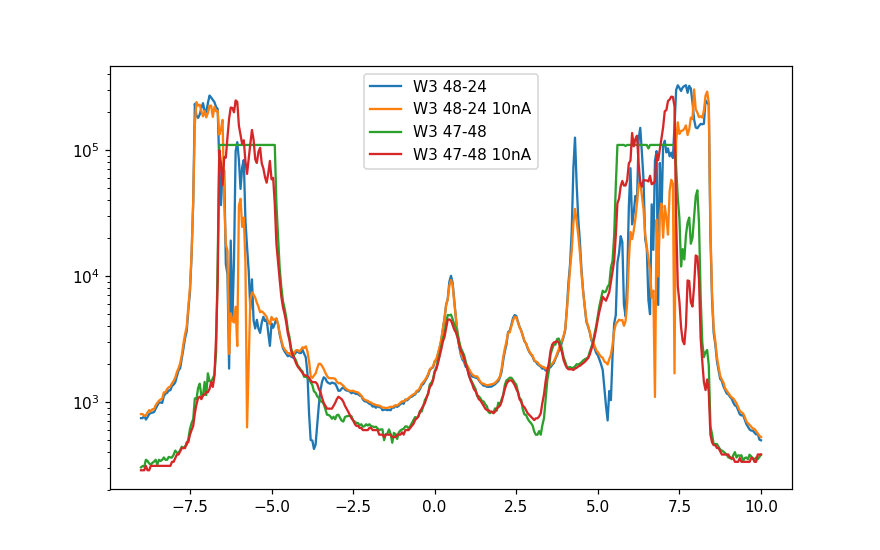

In [22]:
plt.figure(figsize=(8, 5))
plt.semilogy(gate1.srframe_volt_p1_set, abs(gate1.lockin865_X[:]/0.5e-9), label='W3 48-24')
plt.semilogy(gate2.srframe_volt_p1_set, abs(gate2.lockin865_X[:]/10e-9), label='W3 48-24 10nA')
#plt.semilogy(data201.srframe_volt_p1_set, abs(data201.lockin865_X[:]/0.5e-9), label='W3 48-24 20nA DC')
plt.semilogy(gate1.srframe_volt_p1_set, gate1.lockin830_X[:]/0.5e-9, label='W3 47-48')
plt.semilogy(gate2.srframe_volt_p1_set, gate2.lockin830_X[:]/10e-9, label='W3 47-48 10nA')
#plt.semilogy(data201.srframe_volt_p1_set, data201.lockin830_X[:]/0.5e-9, label='W3 47-48 20nA DC')
plt.legend()

In [806]:
srframe.volt_p1(0)

In [797]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 10, 381)
data202, plot202 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_10nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-10 18:54:27
DataSet:
   location = 'data/2020-04-10/#009_W3_865_48-24_830_47-48_baseT_10nA_18-54-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (381,)
   Measured | lockin865_X         | X            | (381,)
   Measured | lockin865_Y         | Y            | (381,)
   Measured | lockin830_X         | X            | (381,)
   Measured | lockin830_Y         | Y            | (381,)
Finished at 2020-04-10 19:08:02


In [917]:
lockin865.amplitude()#10nA

1.0

In [1041]:
lockin865.X()

2.202037831e-05

In [1031]:
lockin865.sensitivity(5e-5)

In [1030]:
lockin830.sensitivity(5e-5)

In [828]:
# now try at several gate points first

In [891]:
srframe.volt_p1(1.8)

In [1060]:
triton.magnet_sweeprate(0.1)
triton.field(-0.025)

Sweep time approximately 40.0 seconds


In [1044]:
triton.field()

-0.017109

In [888]:
srframe.volt_p1(1.7)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data203, plot203 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_1.7Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.2080000000001 seconds
Started at 2020-04-10 19:35:03
DataSet:
   location = 'data/2020-04-10/#010_W3_865_48-24_830_47-48_smallfieldsweep_1.7Vbg_baseT_10nA_19-35-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 19:45:11


In [897]:
srframe.volt_p1(1.8)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data204, plot204 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_1.8Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.8520000000001 seconds
Started at 2020-04-10 20:14:36
DataSet:
   location = 'data/2020-04-10/#011_W3_865_48-24_830_47-48_smallfieldsweep_1.8Vbg_baseT_10nA_20-14-36'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 20:24:43


In [898]:
srframe.volt_p1(-9)

In [939]:
srframe.volt_p1(-9)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data205, plot205 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-9Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.292 seconds
Started at 2020-04-10 21:41:38
DataSet:
   location = 'data/2020-04-10/#012_W3_865_48-24_830_47-48_smallfieldsweep_-9Vbg_baseT_10nA_21-41-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 21:51:45


In [940]:
srframe.volt_p1(-8.8)

In [948]:
srframe.volt_p1(-8.8)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data206, plot206 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-8.8Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.292 seconds
Started at 2020-04-10 21:56:34
DataSet:
   location = 'data/2020-04-10/#013_W3_865_48-24_830_47-48_smallfieldsweep_-8.8Vbg_baseT_10nA_21-56-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 22:06:41


In [949]:
srframe.volt_p1(-8.6)

In [952]:
srframe.volt_p1(-8.6)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data207, plot207 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-8.6Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.538 seconds
Started at 2020-04-10 22:23:55
DataSet:
   location = 'data/2020-04-10/#014_W3_865_48-24_830_47-48_smallfieldsweep_-8.6Vbg_baseT_10nA_22-23-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 22:34:03


In [953]:
srframe.volt_p1(-1.5)

In [968]:
srframe.volt_p1(-1.5)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data208, plot208 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-1.5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.6899999999999 seconds
Started at 2020-04-10 22:40:59
DataSet:
   location = 'data/2020-04-10/#015_W3_865_48-24_830_47-48_smallfieldsweep_-1.5Vbg_baseT_10nA_22-40-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 22:51:04


In [969]:
#try it again

In [979]:
srframe.volt_p1(-1.5)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data209, plot209 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-1.5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.784 seconds
Started at 2020-04-10 22:54:44
DataSet:
   location = 'data/2020-04-10/#016_W3_865_48-24_830_47-48_smallfieldsweep_-1.5Vbg_baseT_10nA_22-54-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 23:04:52


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


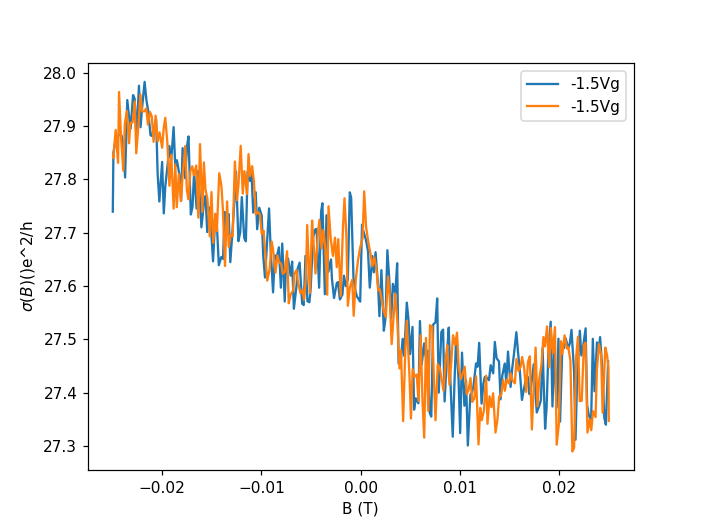

In [981]:
plt.figure()
plt.plot(data208.triton_field, 1/(data208.lockin865_X[:]/10e-9)/esqh, label='-1.5Vg')
plt.plot(data209.triton_field, 1/(data209.lockin865_X[:]/10e-9)/esqh, label='-1.5Vg')
#plt.plot(data6.triton_field, 1/(data6.lockin865_X[:]/10e-9)/esqh, label='-2Vg')
plt.ylabel('$\sigma(B)$()e^2/h')
plt.xlabel('B (T)')
plt.legend()

In [982]:
srframe.volt_p1(-1.6)

In [986]:
srframe.volt_p1(-1.6)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data210, plot210 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-1.6Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 611.02 seconds
Started at 2020-04-10 23:15:53
DataSet:
   location = 'data/2020-04-10/#017_W3_865_48-24_830_47-48_smallfieldsweep_-1.6Vbg_baseT_10nA_23-15-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 23:26:00


In [988]:
srframe.volt_p1(2.4)

In [999]:
srframe.volt_p1(2.4)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data211, plot211 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_2.4Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.6899999999999 seconds
Started at 2020-04-10 23:31:58
DataSet:
   location = 'data/2020-04-10/#018_W3_865_48-24_830_47-48_smallfieldsweep_2.4Vbg_baseT_10nA_23-31-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 23:42:06


In [1003]:
srframe.volt_p1(2.2)

In [1008]:
srframe.volt_p1(2.2)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data212, plot212 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_2.2Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.6899999999999 seconds
Started at 2020-04-10 23:46:27
DataSet:
   location = 'data/2020-04-10/#019_W3_865_48-24_830_47-48_smallfieldsweep_2.2Vbg_baseT_10nA_23-46-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-10 23:56:34


In [1011]:
srframe.volt_p1(-8.58)

In [1022]:
for i in range(26):
    Vg = -8.58 - 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-04-11 00:08:33
DataSet:
   location = 'data/2020-04-11/#001_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-8.58_10nA_00-08-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 00:18:41
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.292 seconds
Started at 2020-04-11 00:19:41
DataSet:
   location = 'data/2020-04-11/#002_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-8.60_

In [1023]:
srframe.volt_p1(-1.24)

In [1024]:
time.sleep(120)

In [1025]:
for i in range(26):
    Vg = -1.24 - 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-04-11 04:59:45
DataSet:
   location = 'data/2020-04-11/#027_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-1.24_10nA_04-59-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 05:09:52
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.292 seconds
Started at 2020-04-11 05:10:54
DataSet:
   location = 'data/2020-04-11/#028_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-1.26_10nA_05-10-5

In [1057]:
triton.field()

-0.025037

In [1032]:
srframe.volt_p1(-0.25)

In [1054]:
srframe.volt_p1(-0.25)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data213, plot213 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-0.25Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 611.02 seconds
Started at 2020-04-11 13:31:56
DataSet:
   location = 'data/2020-04-11/#053_W3_865_48-24_830_47-48_smallfieldsweep_-0.25Vbg_baseT_10nA_13-31-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 13:42:01


In [1056]:
srframe.volt_p1(-0.5)

In [1058]:
srframe.volt_p1(-0.5)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data214, plot214 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-0.5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.9359999999999 seconds
Started at 2020-04-11 13:50:11
DataSet:
   location = 'data/2020-04-11/#054_W3_865_48-24_830_47-48_smallfieldsweep_-0.5Vbg_baseT_10nA_13-50-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 14:00:18


In [1059]:
srframe.volt_p1(-0.75)

In [1061]:
srframe.volt_p1(-0.75)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data215, plot215 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_-0.75Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.8520000000001 seconds
Started at 2020-04-11 14:07:06
DataSet:
   location = 'data/2020-04-11/#055_W3_865_48-24_830_47-48_smallfieldsweep_-0.75Vbg_baseT_10nA_14-07-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 14:17:12


In [1062]:
srframe.volt_p1(-0.25)

In [ ]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-04-11 14:36:16
DataSet:
   location = 'data/2020-04-11/#056_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-0.25_10nA_14-36-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 14:46:23
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.9359999999999 seconds
Started at 2020-04-11 14:47:25
DataSet:
   location = 'data/2020-04-11/#057_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-0.2

In [ ]:
#previous one gate point messed up

In [17]:
for i in range(18):
    Vg = -0.43 - 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.024 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 608.962 seconds
Started at 2020-04-11 16:37:24
DataSet:
   location = 'data/2020-04-11/#066_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-0.43_10nA_16-37-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 16:47:28
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.376 seconds
Started at 2020-04-11 16:48:28
DataSet:
   location = 'data/2020-04-11/#067_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg-0.45_10nA_16-

<IPython.core.display.Javascript object>


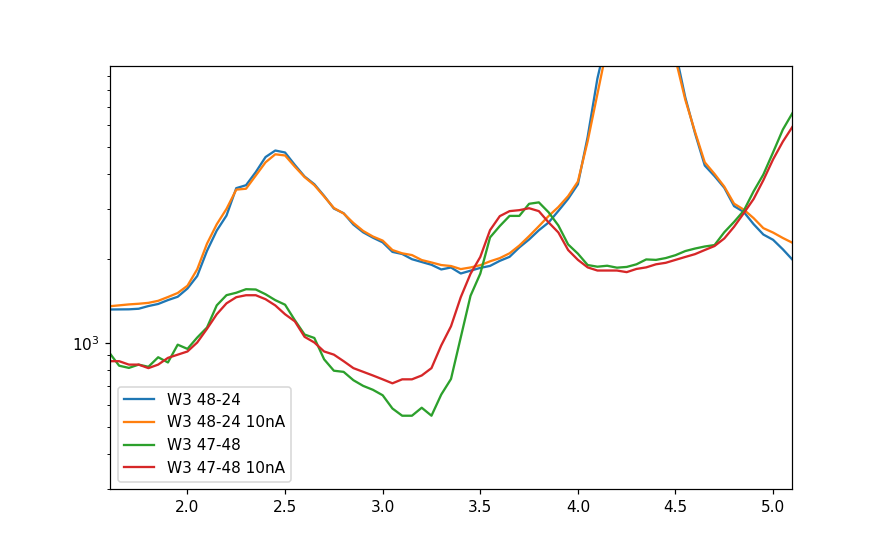

In [32]:
plt.figure(figsize=(8, 5))
plt.semilogy(gate1.srframe_volt_p1_set, abs(gate1.lockin865_X[:]/0.5e-9), label='W3 48-24')
plt.semilogy(gate2.srframe_volt_p1_set, abs(gate2.lockin865_X[:]/10e-9), label='W3 48-24 10nA')
#plt.semilogy(data201.srframe_volt_p1_set, abs(data201.lockin865_X[:]/0.5e-9), label='W3 48-24 20nA DC')
plt.semilogy(gate1.srframe_volt_p1_set, gate1.lockin830_X[:]/0.5e-9, label='W3 47-48')
plt.semilogy(gate2.srframe_volt_p1_set, gate2.lockin830_X[:]/10e-9, label='W3 47-48 10nA')
#plt.semilogy(data201.srframe_volt_p1_set, data201.lockin830_X[:]/0.5e-9, label='W3 47-48 20nA DC')
plt.legend()

In [89]:
triton.magnet_sweeprate(0.1)
triton.field(-0.025)

Sweep time approximately 40.0 seconds


In [98]:
triton.field()

-0.024941

In [62]:
lockin830.X()

1.11946e-05

In [24]:
srframe.volt_p1(1.5)

In [30]:
srframe.volt_p1(1.5)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data216, plot216 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_1.5Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.6899999999999 seconds
Started at 2020-04-11 21:07:57
DataSet:
   location = 'data/2020-04-11/#084_W3_865_48-24_830_47-48_smallfieldsweep_1.5Vbg_baseT_10nA_21-07-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 21:18:02


In [33]:
srframe.volt_p1(1.8)

In [53]:
srframe.volt_p1(1.8)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data217, plot217 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_1.8Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 611.182 seconds
Started at 2020-04-11 21:24:14
DataSet:
   location = 'data/2020-04-11/#085_W3_865_48-24_830_47-48_smallfieldsweep_1.8Vbg_baseT_10nA_21-24-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 21:34:22


In [76]:
srframe.volt_p1()

1.0

In [63]:
srframe.volt_p1(1)
time.sleep(15)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data218, plot218 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_1Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.768 seconds
Started at 2020-04-11 21:37:46
DataSet:
   location = 'data/2020-04-11/#086_W3_865_48-24_830_47-48_smallfieldsweep_1Vbg_baseT_10nA_21-37-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 21:47:52


In [99]:
for i in range(75):
    Vg = 1 + 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.768 seconds
Started at 2020-04-11 22:40:55
DataSet:
   location = 'data/2020-04-11/#087_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg1.00_10nA_22-40-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-11 22:51:02
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-04-11 22:52:04
DataSet:
   location = 'data/2020-04-11/#088_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg1.02_10

In [100]:
for i in range(125):
    Vg = 2.5 + 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005 )
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-04-12 12:41:59
DataSet:
   location = 'data/2020-04-12/#068_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg2.50_10nA_12-41-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-12 12:52:04
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-04-12 12:53:04
DataSet:
   location = 'data/2020-04-12/#069_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg2.52_10nA

In [101]:
srframe.volt_p1(0)

# M26 attempt at non-local measurements

Source/drain: 9/10, Vnl = 5 - 3(4) measured with lockin865

(Quick note: a 2-pt current measurement with 100 mV and 100 MOhms, with Vbg = -1V, for contacts 9-5 is 1 nA. For 9-6 it's 0.92 nA. For contacts 9-7, 0.59 nA. For contacts 9-8, 0.74 nA.)

Try gate sweeps at a few different current amplitudes

In [111]:
lockin865.amplitude(1)

In [117]:
lockin865.time_constant(0.1)

In [113]:
srframe.volt_p1()

0.0

In [118]:
# 10 nA
srframe.volt_p1(-15)
time.sleep(25)
gvals = np.linspace(-15, 15, 201)
data220, plot220 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, DataName='M26_Vnonlocal_865_s9-10_v5-4_10nA_0T_baseT')

Started at 2020-04-13 17:37:26
DataSet:
   location = 'data/2020-04-13/#065_M26_Vnonlocal_865_s9-10_v5-4_10nA_0T_baseT_17-37-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-04-13 17:42:22


In [121]:
data220 = qc.load_data('data/2020-04-13/#065_M26_Vnonlocal_865_s9-10_v5-4_10nA_0T_baseT_17-37-26')

In [119]:
lockin865.amplitude(0.5)

In [120]:
# 5 nA
srframe.volt_p1(-15)
time.sleep(25)
gvals = np.linspace(-15, 15, 201)
data220, plot220 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, DataName='M26_Vnonlocal_865_s9-10_v5-4_10nA_0T_baseT')
srframe.volt_p1(0)

Started at 2020-04-13 17:44:25
DataSet:
   location = 'data/2020-04-13/#066_M26_Vnonlocal_865_s9-10_v5-4_10nA_0T_baseT_17-44-25'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-04-13 17:49:20


In [122]:
data221 = qc.load_data('data/2020-04-13/#066_M26_Vnonlocal_865_s9-10_v5-4_10nA_0T_baseT_17-44-25')

<IPython.core.display.Javascript object>


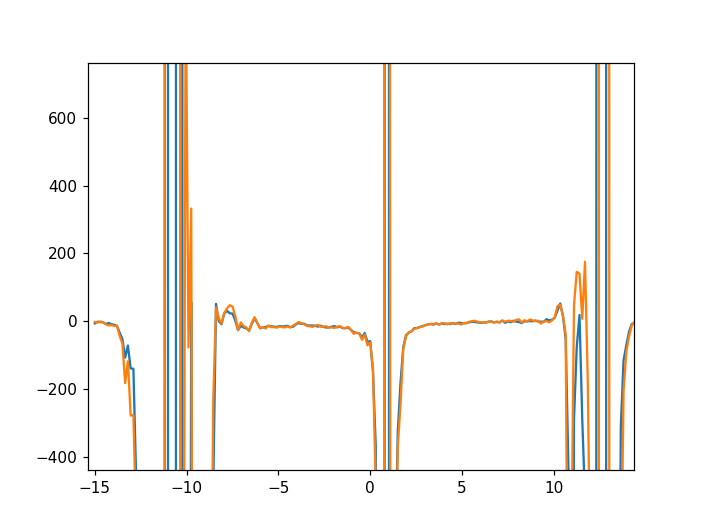

In [127]:
plt.figure()  # No feature at 8V, the 3/4 point.
plt.plot(data220.srframe_volt_p1_set, npd.Rxxfromdata(data220, 10e-9))
plt.plot(data221.srframe_volt_p1_set, npd.Rxxfromdata(data221, 5e-9))

SC device, souce/drain: 30/29, Vnl = 26-27

In [124]:
# 5 nA
srframe.volt_p1(-15)
time.sleep(25)
gvals = np.linspace(-15, 15, 201)
data222, plot222 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_Vnonlocal_s30-29_865v26-27_830v28-27_5nA_0T_baseT')
srframe.volt_p1(0)

Started at 2020-04-13 18:01:07
DataSet:
   location = 'data/2020-04-13/#067_M26_Vnonlocal_s30-29_865v26-27_830v28-27_5nA_0T_baseT_18-01-06'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-04-13 18:06:21


In [129]:
lockin865.amplitude(1)

In [130]:
# 10 nA
srframe.volt_p1(-15)
time.sleep(25)
gvals = np.linspace(-5, 5, 101)
data223, plot223 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_Vnonlocal_s30-29_865v26-27_830v28-27_5nA_0T_baseT')
srframe.volt_p1(0)

Started at 2020-04-13 18:13:45
DataSet:
   location = 'data/2020-04-13/#068_M26_Vnonlocal_s30-29_865v26-27_830v28-27_5nA_0T_baseT_18-13-44'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
   Measured | lockin830_X         | X            | (101,)
   Measured | lockin830_Y         | Y            | (101,)
Finished at 2020-04-13 18:16:40


<IPython.core.display.Javascript object>


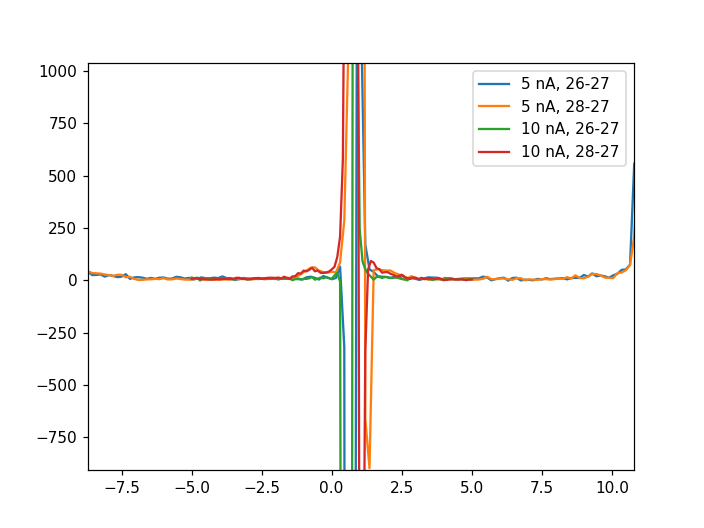

In [133]:
plt.figure()
plt.plot(data222.srframe_volt_p1_set, npd.Rxxfromdata(data222, 5e-9), label='5 nA, 26-27')
plt.plot(data222.srframe_volt_p1_set, npd.Rxxfromdata(data222, 5e-9, instrument='lockin830'), label='5 nA, 28-27')
plt.plot(data223.srframe_volt_p1_set, npd.Rxxfromdata(data223, 10e-9), label='10 nA, 26-27')
plt.plot(data223.srframe_volt_p1_set, npd.Rxxfromdata(data223, 10e-9, instrument='lockin830'), label='10 nA, 28-27')

plt.legend()

# Back to W3 SdH Oscillations

source/drain 44-23, measure with 865: 48-24, with 830: 47-48

Try SdH oscillations at a few temperatures. At Vbg -1.6 (high density but before the near -1/4 blur), -2.78 (on the other side of the near -1/4 blur, perhaps captures the emergent state)

In [134]:
lockin865.amplitude(0.1)

In [139]:
lockin865.time_constant(0.3)
lockin830.time_constant(0.3)

In [140]:
lockin830.sensitivity()

5e-05

In [141]:
lockin865.amplitude(1)  # 10 nA

In [142]:
triton.pid_setpoint()

2.2

In [143]:
triton.pid_control_channel()

8

In [144]:
triton.pid_setpoint(0.025)

In [145]:
triton.pid_setpoint(0.05)  # turn the temp to 50 mK. This will keep it stable during the sweep and at a known temperature.

In [157]:
triton.pid_mode(1)

In [158]:
triton.T1_enable(1)
time.sleep(2)
triton.T1_enable(0)  # hopefully this keeps the temp control on the MC RuOx

In [160]:
triton.pid_range(3.16)

In [156]:
triton.MC_temp()  # turned off the pid, checked the temp, and then back on.

0.0502018

In [161]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data224, plot224 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_50mK_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 8409.982 seconds
Started at 2020-04-13 20:50:58
DataSet:
   location = 'data/2020-04-13/#069_W3_865_48-24_830_47-48_50mK_fieldsweep_-1p6Vbg_10nA_20-50-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-13 23:11:49


In [162]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data225, plot225 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_50mK_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 8410.006 seconds
Started at 2020-04-13 23:12:25
DataSet:
   location = 'data/2020-04-13/#070_W3_865_48-24_830_47-48_50mK_fieldsweep_-2p78Vbg_10nA_23-12-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-13 23:42:06


Magnet quench. Couldn't finish this scan. Heated the sample to ~250 mK, so I'll just do the 500 mK sweep now.

In [184]:
triton.pid_mode(0)

In [173]:
triton.magnet_hold()  # hitting this a few times undid the quench problem

In [189]:
triton.pid_mode(1)

In [183]:
triton.pid_setpoint(0.5)
time.sleep(20)
triton.pid_range(10)
time.sleep(360)

In [194]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [193]:
triton.magnet_POC()

0

In [195]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data226, plot226 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_500mK_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-14 00:07:59
DataSet:
   location = 'data/2020-04-14/#001_W3_865_48-24_830_47-48_500mK_fieldsweep_-1p6Vbg_10nA_00-07-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 02:28:48


In [196]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data227, plot227 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_500mK_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-14 02:29:31
DataSet:
   location = 'data/2020-04-14/#002_W3_865_48-24_830_47-48_500mK_fieldsweep_-2p78Vbg_10nA_02-29-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 04:50:21


In [197]:
triton.pid_setpoint(1)
time.sleep(700)

In [198]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data228, plot228 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_1K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-14 05:02:46
DataSet:
   location = 'data/2020-04-14/#003_W3_865_48-24_830_47-48_1K_fieldsweep_-1p6Vbg_10nA_05-02-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 07:23:35


In [199]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data229, plot229 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_1K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.018 seconds
Started at 2020-04-14 07:24:17
DataSet:
   location = 'data/2020-04-14/#004_W3_865_48-24_830_47-48_1K_fieldsweep_-2p78Vbg_10nA_07-24-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 09:45:05


<IPython.core.display.Javascript object>


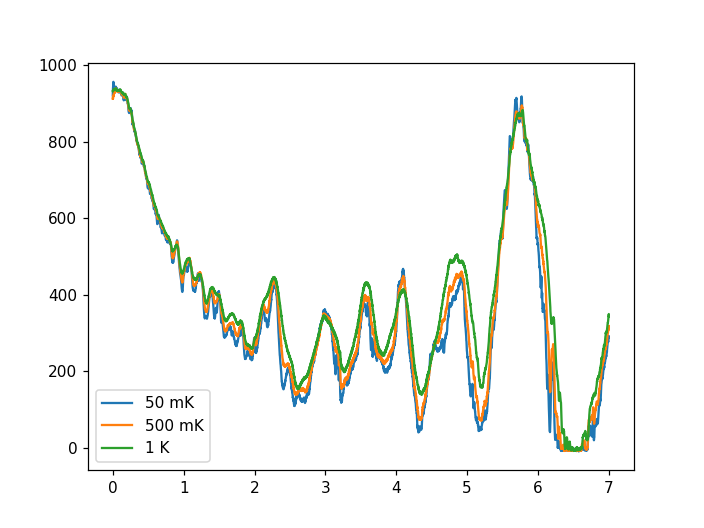

In [203]:
plt.figure()
plt.plot(data224.triton_field, data224.lockin865_X[:]/10e-9, label='50 mK')
plt.plot(data226.triton_field, data226.lockin865_X[:]/10e-9, label='500 mK')
plt.plot(data228.triton_field, data228.lockin865_X[:]/10e-9, label='1 K')
plt.legend()

This one was likely not 2K since I forgot to change the heater range to 100.

In [200]:
triton.pid_setpoint(2)
triton.magnet_swh(0)
triton.magnet_swh(1)

Wait 5 min for the switch to cool
Wait 5 min for the switch to warm


In [204]:
srframe.volt_p1(-1.6) # not actually 2K
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data230, plot230 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_2K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8409.958 seconds
Started at 2020-04-14 10:54:06
DataSet:
   location = 'data/2020-04-14/#005_W3_865_48-24_830_47-48_2K_fieldsweep_-1p6Vbg_10nA_10-54-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 13:14:56


In [205]:
srframe.volt_p1(-2.78)  # not actually 2K
time.sleep(30)
triton.field(0)
data231, plot231 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_2K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.018 seconds
Started at 2020-04-14 13:15:38
DataSet:
   location = 'data/2020-04-14/#006_W3_865_48-24_830_47-48_2K_fieldsweep_-2p78Vbg_10nA_13-15-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 15:36:30


Now switching over to reading MC cernox. Repeat 2K

In [206]:
triton.magnet_swh(0)

Wait 5 min for the switch to cool


In [209]:
triton.pid_mode(0)

In [210]:
triton.pid_mode(1)

In [211]:
triton.pid_range(100)

In [213]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [214]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data232, plot232 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_2K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.018 seconds
Started at 2020-04-14 17:02:34
DataSet:
   location = 'data/2020-04-14/#007_W3_865_48-24_830_47-48_2K_fieldsweep_-1p6Vbg_10nA_17-02-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-14 19:23:23


In [219]:
triton.magnet_POC(0)

In [220]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [221]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data233, plot233 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_2K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.024000000001 seconds
Started at 2020-04-14 22:37:04
DataSet:
   location = 'data/2020-04-14/#009_W3_865_48-24_830_47-48_2K_fieldsweep_-2p78Vbg_10nA_22-37-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 00:57:53


In [222]:
triton.pid_setpoint(5)
time.sleep(360)

In [223]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data234, plot234 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_5K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-15 01:04:38
DataSet:
   location = 'data/2020-04-15/#001_W3_865_48-24_830_47-48_5K_fieldsweep_-1p6Vbg_10nA_01-04-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 03:25:27


In [224]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data235, plot235 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_5K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-15 03:26:09
DataSet:
   location = 'data/2020-04-15/#002_W3_865_48-24_830_47-48_5K_fieldsweep_-2p78Vbg_10nA_03-26-09'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 05:46:59


In [225]:
triton.pid_setpoint(10)
triton.magnet_swh(0)  #turn the switch heater on and off to try to keep it from quenching and give it 10 minutes to get up to temperature
time.sleep(20)
triton.magnet_swh(1)

Wait 5 min for the switch to cool
Wait 5 min for the switch to warm


In [226]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data236, plot236 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_10K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.018 seconds
Started at 2020-04-15 05:58:13
DataSet:
   location = 'data/2020-04-15/#003_W3_865_48-24_830_47-48_10K_fieldsweep_-1p6Vbg_10nA_05-58-12'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 08:19:04


In [227]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data237, plot237 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_10K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.018 seconds
Started at 2020-04-15 08:19:46
DataSet:
   location = 'data/2020-04-15/#004_W3_865_48-24_830_47-48_10K_fieldsweep_-2p78Vbg_10nA_08-19-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 10:40:35


In [229]:
lockin830.sensitivity(200e-6)

In [230]:
triton.pid_setpoint(15)
triton.magnet_swh(0)  #turn the switch heater on and off to try to keep it from quenching and give it 10 minutes to get up to temperature
time.sleep(20)
triton.magnet_swh(1)

Wait 5 min for the switch to cool
Wait 5 min for the switch to warm


In [231]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data238, plot238 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_15K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8409.958 seconds
Started at 2020-04-15 11:45:50
DataSet:
   location = 'data/2020-04-15/#005_W3_865_48-24_830_47-48_15K_fieldsweep_-1p6Vbg_10nA_11-45-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 14:06:41


In [232]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data239, plot239 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_15K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8409.994 seconds
Started at 2020-04-15 14:07:23
DataSet:
   location = 'data/2020-04-15/#006_W3_865_48-24_830_47-48_15K_fieldsweep_-2p78Vbg_10nA_14-07-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 16:28:12


In [233]:
triton.pid_setpoint(20)
triton.magnet_swh(0)  #turn the switch heater on and off to try to keep it from quenching and give it 10 minutes to get up to temperature
time.sleep(20)
triton.magnet_swh(1)

Wait 5 min for the switch to cool
Wait 5 min for the switch to warm


In [234]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data240, plot240 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_20K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8409.994 seconds
Started at 2020-04-15 16:39:28
DataSet:
   location = 'data/2020-04-15/#007_W3_865_48-24_830_47-48_20K_fieldsweep_-1p6Vbg_10nA_16-39-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-15 19:00:18


In [239]:
triton.magnet_hold()

In [267]:
triton.pid_mode(0)

In [269]:
triton.MC_cernox_temp()

19.9657

In [270]:
triton.magnet_temp_enable(1)

In [273]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [277]:
triton.magnet_temp()

4.62416

In [278]:
triton.MC_cernox_temp()

19.9409

In [252]:
triton.pid_mode(1)
time.sleep(8)
triton.pid_range(100)

There was perhaps a magnet quench at ~5T on the way down. So we'll try to repeat the measurement.

In [266]:
triton.magnet_POC(0)

In [258]:
triton.magnet_sweeprate()

0.05

In [279]:
triton.magnet_sweeprate(0.1)
triton.field_set_stable(7)

Please wait 4210.006 seconds for the field sweep, plus the time required for operating the switch...


Another magnet quench, only a few minutes in...

In [280]:
triton.field()

7.000007

In [281]:
triton.magnet_temp()

4.71826

In [282]:
triton.MC_cernox_temp()

19.6858

In [283]:
triton.magnet_temp_enable(0)

In [284]:
triton.read_temps()

MC - off:  1.8217 K
MC_cernox - on:  19.6844 K
still - off:  0.765916 K
cold_plate - off:  0.247917 K
magnet - off:  4.71921 K
PT2h - off:  3.31641 K
PT2p - off:  3.53932 K
PT1h - off:  46.9254 K
PT1p - off:  59.5605 K


In [285]:
triton.pid_mode(1)
time.sleep(8)
triton.pid_range(100)

In [286]:
triton.magnet_sweeprate(0.05)
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data241, plot241 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_20K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.018 seconds
Started at 2020-04-16 00:02:48
DataSet:
   location = 'data/2020-04-16/#001_W3_865_48-24_830_47-48_20K_fieldsweep_-2p78Vbg_10nA_00-02-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-16 02:23:37


One more quick check on low-field data since there appears to be a dip in resistance (but it only seems to happen at the point where the magnet starts up).

In [291]:
triton.magnet_sweeprate(0.15)
triton.field(0.5)

Sweep time approximately 210.00400000000002 seconds


In [293]:
srframe.volt_p1(-1.6)  # no, it's just where the magnet starts that the resistance jumps upward...
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(-0.5)
data242, plot242 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='W3_865_48-24_830_47-48_20K_smallfieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 1210.018 seconds
Started at 2020-04-16 02:51:49
DataSet:
   location = 'data/2020-04-16/#002_W3_865_48-24_830_47-48_20K_smallfieldsweep_-1p6Vbg_10nA_02-51-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-16 03:12:08


In [294]:

triton.magnet_sweeprate(0.05)
triton.field(0.5)
data243, plot243 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='W3_865_48-24_830_47-48_20K_smallfieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 1210.012 seconds
Started at 2020-04-16 03:12:16
DataSet:
   location = 'data/2020-04-16/#003_W3_865_48-24_830_47-48_20K_smallfieldsweep_-1p6Vbg_10nA_03-12-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-16 03:32:34


In [295]:
triton.magnet_sweeprate(0.15)
triton.field_set_stable(0)

Please wait 210.00400000000002 seconds for the field sweep, plus the time required for operating the switch...


In [303]:
triton.pid_mode(0)
time.sleep(10)
triton.alltempsenable()
time.sleep(360)
triton.write('SET:SYS:DR:ACTN:CLDN')

The forepump, unfortunately, had a flipped breaker. Unflipping it allowed the full cooldown to run. (and exiting the magnet VRM software window)

In [332]:
lockin865.amplitude(0)

In [341]:
triton.MC_temp()

0.0283683

In [339]:
triton.MC_cernox_temp()

1.55659

<IPython.core.display.Javascript object>


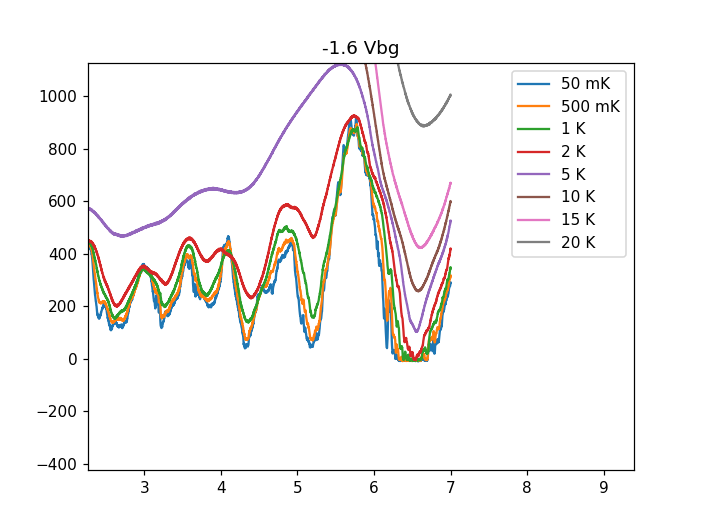

Text(0.5, 1.0, '-1.6 Vbg')

In [289]:
plt.figure()
plt.plot(data224.triton_field, data224.lockin865_X[:]/10e-9, label='50 mK')
plt.plot(data226.triton_field, data226.lockin865_X[:]/10e-9, label='500 mK')
plt.plot(data228.triton_field, data228.lockin865_X[:]/10e-9, label='1 K')
plt.plot(data232.triton_field, data232.lockin865_X[:]/10e-9, label='2 K')
plt.plot(data234.triton_field, data234.lockin865_X[:]/10e-9, label='5 K')
plt.plot(data236.triton_field, data236.lockin865_X[:]/10e-9, label='10 K')
plt.plot(data238.triton_field, data238.lockin865_X[:]/10e-9, label='15 K')
plt.plot(data240.triton_field, data240.lockin865_X[:]/10e-9, label='20 K')
plt.legend()
plt.title('-1.6 Vbg')

<IPython.core.display.Javascript object>


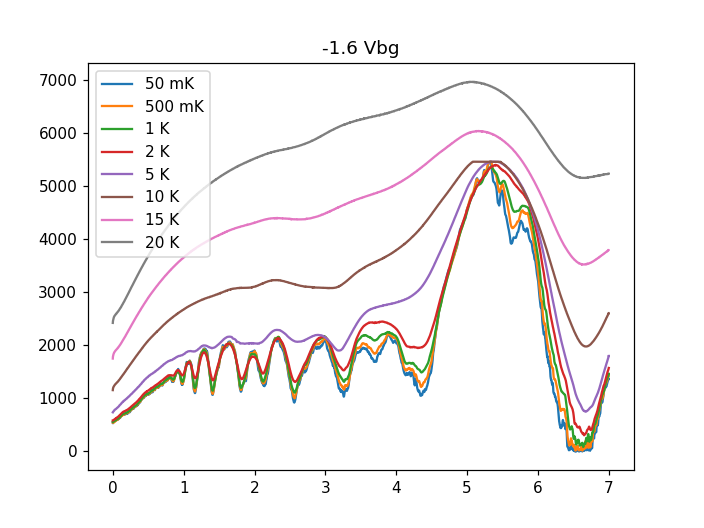

Text(0.5, 1.0, '-1.6 Vbg')

In [292]:
plt.figure()
plt.plot(data224.triton_field, data224.lockin830_X[:]/10e-9, label='50 mK')
plt.plot(data226.triton_field, data226.lockin830_X[:]/10e-9, label='500 mK')
plt.plot(data228.triton_field, data228.lockin830_X[:]/10e-9, label='1 K')
plt.plot(data232.triton_field, data232.lockin830_X[:]/10e-9, label='2 K')
plt.plot(data234.triton_field, data234.lockin830_X[:]/10e-9, label='5 K')
plt.plot(data236.triton_field, data236.lockin830_X[:]/10e-9, label='10 K')
plt.plot(data238.triton_field, data238.lockin830_X[:]/10e-9, label='15 K')
plt.plot(data240.triton_field, data240.lockin830_X[:]/10e-9, label='20 K')
plt.legend()
plt.title('-1.6 Vbg')

<IPython.core.display.Javascript object>


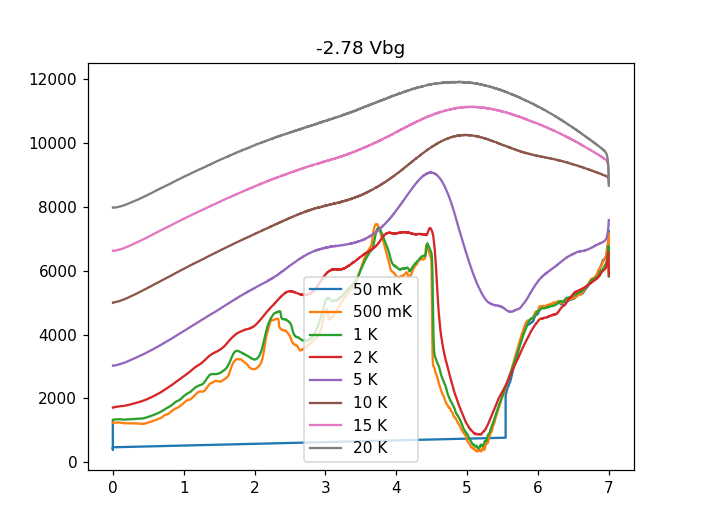

Text(0.5, 1.0, '-2.78 Vbg')

In [290]:
plt.figure()
plt.plot(data225.triton_field, data225.lockin865_X[:]/10e-9, label='50 mK')
plt.plot(data227.triton_field, data227.lockin865_X[:]/10e-9, label='500 mK')
plt.plot(data229.triton_field, data229.lockin865_X[:]/10e-9, label='1 K')
plt.plot(data233.triton_field, data233.lockin865_X[:]/10e-9, label='2 K')
plt.plot(data235.triton_field, data235.lockin865_X[:]/10e-9, label='5 K')
plt.plot(data237.triton_field, data237.lockin865_X[:]/10e-9, label='10 K')
plt.plot(data239.triton_field, data239.lockin865_X[:]/10e-9, label='15 K')
plt.plot(data241.triton_field, data241.lockin865_X[:]/10e-9, label='20 K')
plt.legend()
plt.title('-2.78 Vbg')

I should get 50 mK, 3.5K, 7K for -2.78V and probably 3.5, 7K for -1.6V

In [342]:
triton.read_temps()

MC - on:  0.0280309 K
MC_cernox - on:  321.181 K
still - on:  0.780927 K
cold_plate - on:  0.070223 K
magnet - on:  4.2745 K
PT2h - on:  3.29403 K
PT2p - on:  3.54568 K
PT1h - on:  46.7327 K
PT1p - on:  59.9316 K


In [343]:
triton.tempdisable_excMC()

In [344]:
triton.magnet_swh()

1

First check from 3.6 to 5T and back in case there's some hysteresis at the point of the jump. (base temp, leave excitation current and everything else the same)

In [353]:
triton.magnet_sweeprate(0.15)
triton.field(3.6)

Sweep time approximately 1450.0 seconds


In [358]:
triton.field()

3.599993

In [359]:
triton.magnet_POC(0) #turn this off when I get the chance.

In [360]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [361]:
lockin865.amplitude(1)  # 10 nA
triton.magnet_sweeprate(0.1)
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(5)
data244, plot244 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 5, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweepup_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 850.012 seconds
Started at 2020-04-16 16:26:53
DataSet:
   location = 'data/2020-04-16/#004_W3_865_48-24_830_47-48_baseT_fieldsweepup_-2p78Vbg_10nA_16-26-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-16 16:41:10


In [362]:

triton.field(3.6)
data245, plot245 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 3.6, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweepdown_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 850.006 seconds
Started at 2020-04-16 16:41:15
DataSet:
   location = 'data/2020-04-16/#005_W3_865_48-24_830_47-48_baseT_fieldsweepdown_-2p78Vbg_10nA_16-41-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-04-16 16:55:32


Then SdH oscillations on the way back down

In [363]:
triton.magnet_sweeprate(0.15)
time.sleep(5)
triton.field_set_stable(7.5)

Please wait 1569.988 seconds for the field sweep, plus the time required for operating the switch...


In [364]:
triton.magnet_sweeprate(0.05)
time.sleep(5)
triton.field(0)
data246, plot246 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=180, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_baseT_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 9009.964 seconds
Started at 2020-04-16 17:24:04
DataSet:
   location = 'data/2020-04-16/#006_W3_865_48-24_830_47-48_baseT_fieldsweep_-2p78Vbg_10nA_17-24-04'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5400,)
   Measured | time0        | time0        | (5400,)
   Measured | triton_field | field        | (5400,)
   Measured | lockin865_X  | X            | (5400,)
   Measured | lockin865_Y  | Y            | (5400,)
   Measured | lockin830_X  | X            | (5400,)
   Measured | lockin830_Y  | Y            | (5400,)
Finished at 2020-04-16 19:54:58


In [722]:
triton.read_temps()

MC - on:  1.29815 K
MC_cernox - on:  1.29981 K
still - off:  0.780927 K
cold_plate - off:  0.070223 K
magnet - off:  4.2745 K
PT2h - off:  3.29403 K
PT2p - off:  3.54568 K
PT1h - off:  46.7186 K
PT1p - off:  59.9316 K


In [544]:
triton.MC_temp()

1.01268

In [369]:
triton.still_temp()

0.780927

In [503]:
triton.pid_control_channel()

8

In [654]:
triton.ask('READ:DEV:T5:TEMP:LOOP:MODE')

'STAT:DEV:T5:TEMP:LOOP:MODE:OFF'

In [660]:
# This works for changing the temperature control channel. I'll have to update the driver, but I'll use this in the meantime.
triton.write('SET:DEV:T8:TEMP:LOOP:HTR:H1')

I was going to repeat the measurement at 1K (with range 31.6) since it was likely ~0.8K instead of 1K before due to a pid range of 10.

We'll go back to that once we've done the parts above 2K.

In [694]:
triton.pid_mode(1)

In [691]:
triton.pid_mode(0)

In [662]:
triton.pid_setpoint(1)

In [663]:
triton.pid_range(31.6)

In [552]:
triton.magnet_hold()

In [553]:
triton.magnet_sweeprate(0.1)
triton.field(0)

Sweep time approximately 90.616 seconds


In [695]:
triton.pid_setpoint(2)
time.sleep(5)
triton.pid_range(100)

In [678]:
triton.MC_temp()

1.64525

In [693]:
triton.MC_cernox_temp()

3.42801

In [655]:
triton.MC_temp_enable(1)

In [652]:
triton.MC_cernox_temp_enable(0)

In [679]:
triton.MC_temp_enable(0)
triton.MC_cernox_temp_enable(1)

In [680]:
triton.write('SET:DEV:T5:TEMP:LOOP:HTR:H1')

In [696]:
triton.pid_setpoint(3.5)

In [578]:
triton.write('SET:DEV:V4:VALV:SIG:STATE:OPEN')

In [579]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:CLOSE')

In [600]:
triton.write('SET:DEV:TURB1:PUMP:SIG:STATE:OFF')

In [702]:
triton.read_pumps()

Turbo: 0,  speed: 0.0 Hz
KNF: 1
Forepump: 1


In [707]:
triton.read_pressures()

P1:  337.771
P2:  350.255
P3:  7.2
P4:  4.6
P5:  119.599
POVC:  0.00035


Do the sweeps at 3.5K, 7K

In [697]:
triton.magnet_swh(0)
time.sleep(5)
triton.magnet_swh(1)

Wait 5 min for the switch to cool
Wait 5 min for the switch to warm


In [698]:
lockin865.amplitude()

1.0

In [700]:
triton.pid_setpoint(3.5)

In [705]:
triton.pid_range()

100.0

In [708]:
time.sleep(600)

In [709]:
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data247, plot247 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_3p5K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8409.982 seconds
Started at 2020-04-16 23:58:28
DataSet:
   location = 'data/2020-04-16/#009_W3_865_48-24_830_47-48_3p5K_fieldsweep_-1p6Vbg_10nA_23-58-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-17 02:19:11


In [710]:
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data248, plot248 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_3p5K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-17 02:19:53
DataSet:
   location = 'data/2020-04-17/#001_W3_865_48-24_830_47-48_3p5K_fieldsweep_-2p78Vbg_10nA_02-19-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-17 04:40:44


In [711]:
triton.pid_setpoint(7)
triton.magnet_swh(0)
time.sleep(10)
triton.magnet_swh(1)
time.sleep(5)

Wait 5 min for the switch to cool
Wait 5 min for the switch to warm


In [712]:
#7K
srframe.volt_p1(-1.6)
time.sleep(30)
triton.magnet_sweeprate(0.05)
triton.field(7)
data249, plot249 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 7, 0.002, 10), DataName='W3_865_48-24_830_47-48_7K_fieldsweep_-1p6Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8409.970000000001 seconds
Started at 2020-04-17 04:51:53
DataSet:
   location = 'data/2020-04-17/#002_W3_865_48-24_830_47-48_7K_fieldsweep_-1p6Vbg_10nA_04-51-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-17 07:12:43


In [713]:
#7K
srframe.volt_p1(-2.78)
time.sleep(30)
triton.field(0)
data250, plot250 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=170, breakif=npd.breakat(triton.field, 0, 0.002, 10), DataName='W3_865_48-24_830_47-48_7K_fieldsweep_-2p78Vbg_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Sweep time approximately 8410.006 seconds
Started at 2020-04-17 07:13:26
DataSet:
   location = 'data/2020-04-17/#003_W3_865_48-24_830_47-48_7K_fieldsweep_-2p78Vbg_10nA_07-13-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (5100,)
   Measured | time0        | time0        | (5100,)
   Measured | triton_field | field        | (5100,)
   Measured | lockin865_X  | X            | (5100,)
   Measured | lockin865_Y  | Y            | (5100,)
   Measured | lockin830_X  | X            | (5100,)
   Measured | lockin830_Y  | Y            | (5100,)
Finished at 2020-04-17 09:34:14


In [714]:
time.sleep(10)
triton.pid_mode(0)
triton.MC_temp_enable(1)
time.sleep(10)
triton.write('SET:DEV:V4:VALV:SIG:STATE:CLOSE')
time.sleep(10)
triton.write('SET:DEV:V9:VALV:SIG:STATE:OPEN')

For later:

-Run a temperature sweep at gate voltage 4.25 (or the peak of the +half-filling state, which should be near here). This is fastest if you're in the lab, and you slowly turn the MC heater up till you reach 2K, while running a datalog, similar to doing field sweeps. Then switch to the high-temp control mode while holding at 2K using the pid. Then use the heater to manually increase the temperature again to 10-15K. (if you keep it to <=15K, you can cool it without running the pre-cool loop).

-Run field-gate sweeps near the emergent state (3-6T only, for a limited gate range), at a few different temperatures. Say base, 1K, 5K, and 7 or 10K.

In [724]:
triton.read_pressures()

P1:  470.698
P2:  1089.28
P3:  6.6
P4:  4.4
P5:  125.98
POVC:  0.0003


In [721]:
triton.magnet_swh(0)

Wait 5 min for the switch to cool


In [755]:
triton.read_temps()

MC - on:  0.0393001 K
MC_cernox - off:  1.21336 K
still - on:  0.8207 K
cold_plate - off:  0.070223 K
magnet - on:  4.41208 K
PT2h - off:  3.29403 K
PT2p - off:  3.54568 K
PT1h - off:  46.7186 K
PT1p - off:  61.5584 K


In [731]:
triton.magnet_sweeprate(0.1)

In [757]:
triton.field()

3.000007

In [759]:
lockin865.time_constant(0.1)

In [760]:
lockin830.time_constant(0.1)

In [761]:
srframe.volt_p1(-1.7)

In [762]:
srframe.volt_p1(-1.7)
time.sleep(60)
gvals = np.linspace(-1.7, -3.7, 201)
bvals = np.linspace(3, 6, 61)
data251, plot251 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=45, SetDelay2=1.8, Param2_SetBetween=0, DataName='W3_865_48-24_830_47-48_baseT_10nA_B-Vg2D_emerging_state')

Started at 2020-04-17 15:13:08
Please wait 10.03 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operatin

In [764]:
import matplotlib.colors as colors

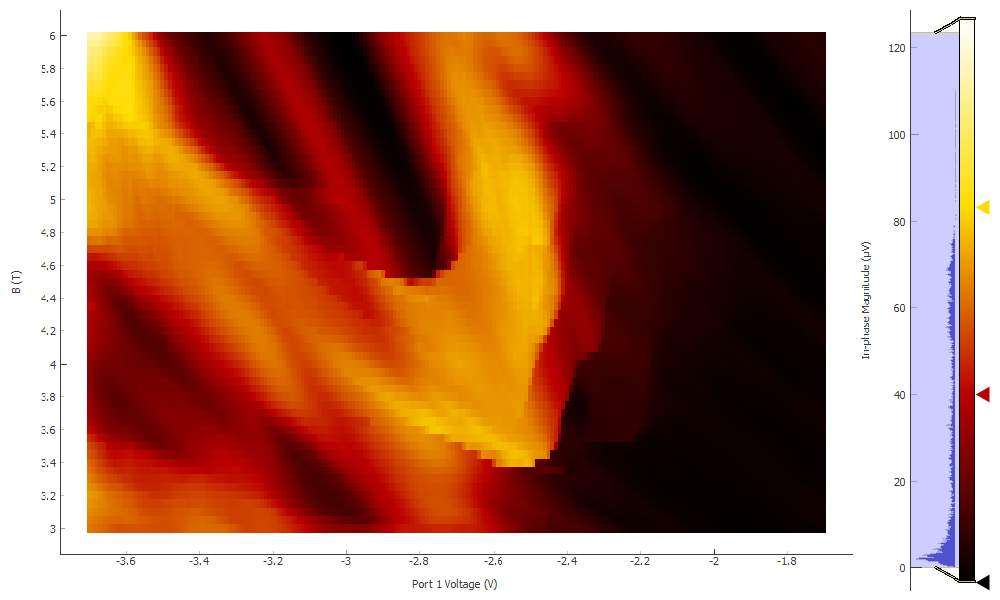

In [769]:
plot251[0]

In [795]:
srframe.volt_p1(-1.9)

In [791]:
triton.pid_setpoint(1)

In [786]:
triton.pid_range(10)

In [785]:
triton.pid_mode(1)

In [792]:
srframe.volt_p1(-1.9)
time.sleep(60)
gvals = np.linspace(-1.9, -3.9, 201)
bvals = np.linspace(6, 3, 61)
data252, plot252 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=45, SetDelay2=1.8, Param2_SetBetween=0, DataName='W3_865_48-24_830_47-48_1K_10nA_B-Vg2D_emerging_state')

Started at 2020-04-18 13:18:37
Please wait 10.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.982 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.03 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.024 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating th

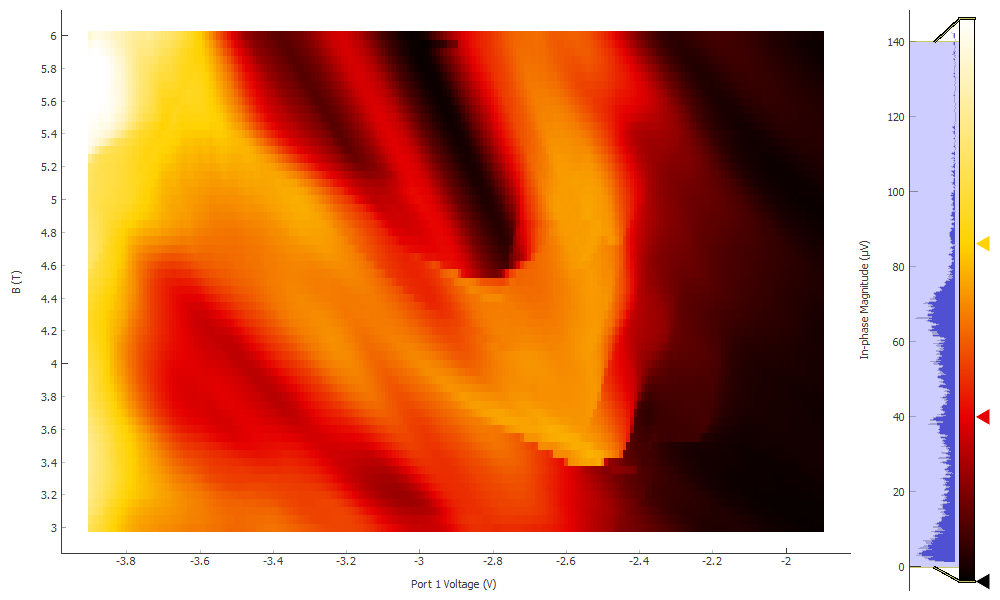

In [794]:
plot252[0]

In [798]:
triton.pid_range(100)

In [806]:
triton.pid_setpoint(5)

In [807]:
srframe.volt_p1(-1.9)
time.sleep(60)
gvals = np.linspace(-1.9, -3.9, 201)
bvals = np.linspace(3, 6, 61)
data253, plot253 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=45, SetDelay2=1.8, Param2_SetBetween=0, DataName='W3_865_48-24_830_47-48_5K_10nA_B-Vg2D_emerging_state')

Started at 2020-04-19 11:17:04
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operati

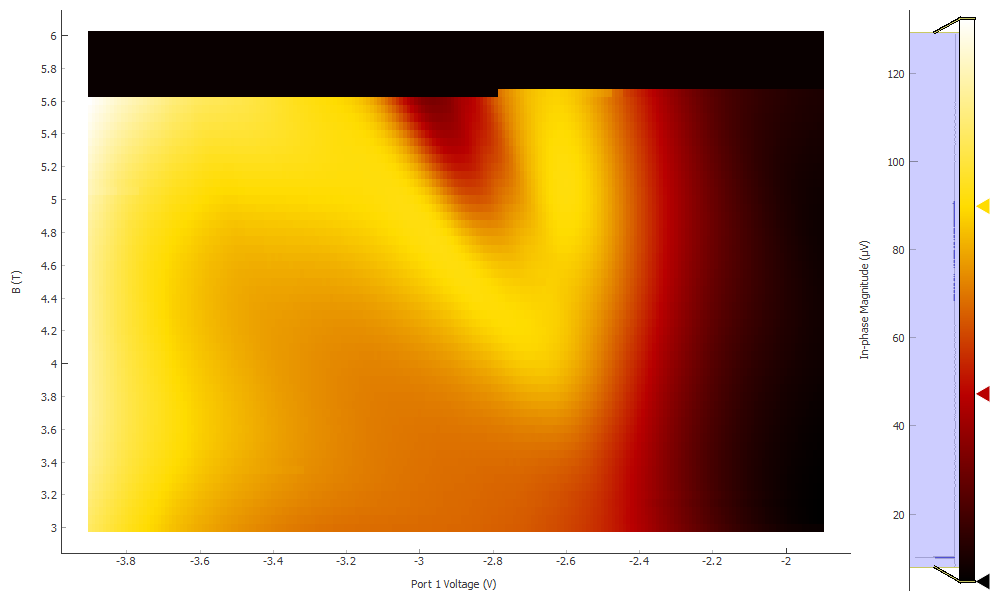

In [808]:
plot253[0]

In [812]:
srframe.volt_p1(-1.9)

In [811]:
srframe.volt_p1(-1.9)
time.sleep(60)
gvals = np.linspace(-1.9, -3.9, 201)
bvals = np.linspace(5.6, 6, 9)
data254, plot254 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=45, SetDelay2=1.8, Param2_SetBetween=0, DataName='W3_865_48-24_830_47-48_5K_10nA_B-Vg2D_emerging_state')

Started at 2020-04-20 11:22:42
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.64 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-04-20/#001_W3_865_48-24_830_47-48_5K_10nA_B-V

In [816]:
triton.pid_setpoint(10)

In [817]:
srframe.volt_p1(-1.9)
time.sleep(60)
gvals = np.linspace(-1.9, -3.9, 201)
bvals = np.linspace(6, 3, 61)
data255, plot255 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=45, SetDelay2=1.8, Param2_SetBetween=0, DataName='W3_865_48-24_830_47-48_10K_10nA_B-Vg2D_emerging_state')

Started at 2020-04-20 15:12:20
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.64 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.64 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.646 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operati

In [819]:
triton.magnet_sweeprate(0.1)

In [825]:
triton.field()

0.417623

In [827]:
triton.pid_mode(0)

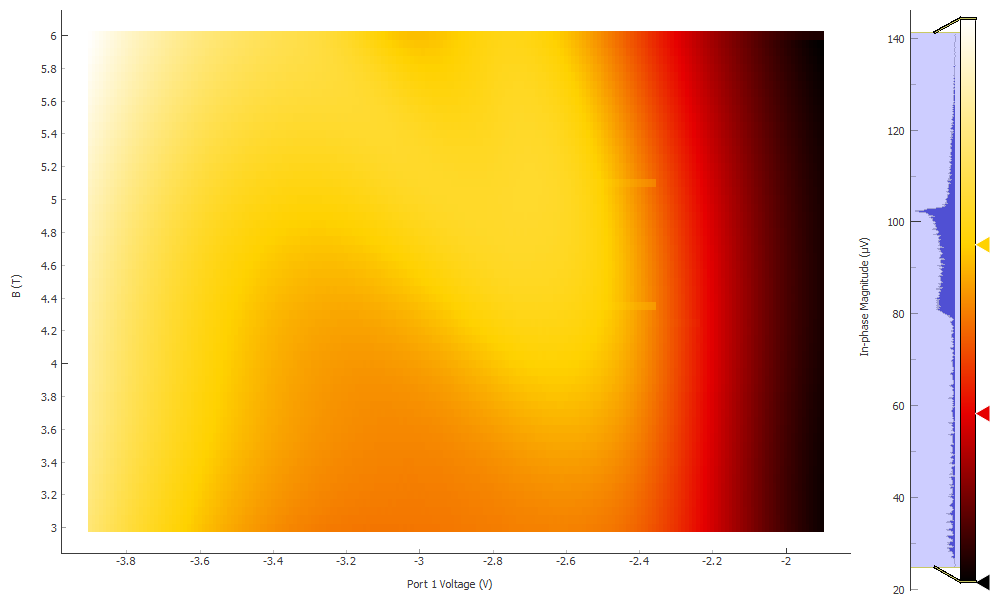

In [828]:
plot255[0]

# WAL W3 T dependence

In [833]:
triton.read_temps()

MC - on:  0.0344148 K
MC_cernox - off:  1.22432 K
still - off:  0.706775 K
cold_plate - off:  0.070223 K
magnet - off:  4.09998 K
PT2h - off:  3.29403 K
PT2p - off:  3.54568 K
PT1h - off:  46.7186 K
PT1p - off:  61.5584 K


In [840]:
lockin830.sensitivity()

0.0001

In [846]:
srframe.volt_p1(-9)

In [847]:
srframe.volt_p1(-9)
time.sleep(30)
gvals = np.linspace(-9, 10, 191)
data256, plot256 = npd.single_param_sweep(srframe.volt_p1, gvals, 2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W3_865_48-24_830_47-48_baseT_10nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-21 15:56:37
DataSet:
   location = 'data/2020-04-21/#002_W3_865_48-24_830_47-48_baseT_10nA_15-56-36'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (191,)
   Measured | lockin865_X         | X            | (191,)
   Measured | lockin865_Y         | Y            | (191,)
   Measured | lockin830_X         | X            | (191,)
   Measured | lockin830_Y         | Y            | (191,)
Finished at 2020-04-21 16:03:59


In [848]:
srframe.volt_p1(0)

<IPython.core.display.Javascript object>


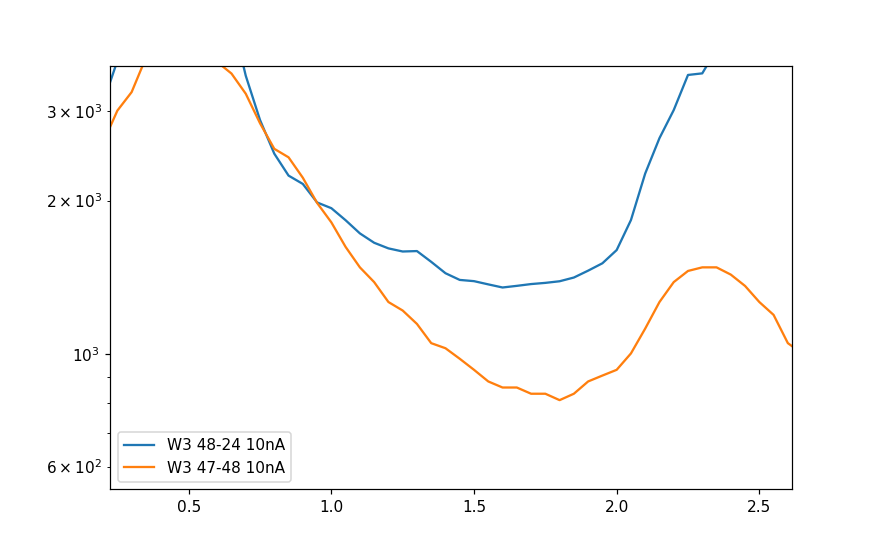

In [851]:
plt.figure(figsize=(8, 5))
plt.semilogy(gate2.srframe_volt_p1_set, abs(gate2.lockin865_X[:]/10e-9), label='W3 48-24 10nA')

plt.semilogy(gate2.srframe_volt_p1_set, gate2.lockin830_X[:]/10e-9, label='W3 47-48 10nA')

plt.legend()

In [853]:
triton.field()

-0.025009

In [854]:
srframe.volt_p1(9)

In [931]:
lockin830.X()

3.70482e-06

In [942]:
lockin865.sensitivity()

1e-05

In [943]:
lockin830.sensitivity()

2e-05

In [900]:
srframe.volt_p1(9)
time.sleep(30)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data257, plot257 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_9Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.606 seconds
Started at 2020-04-21 16:27:26
DataSet:
   location = 'data/2020-04-21/#003_W3_865_48-24_830_47-48_smallfieldsweep_9Vbg_baseT_10nA_16-27-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 16:37:31


In [907]:
srframe.volt_p1(8.8)

In [919]:
srframe.volt_p1(8.8)
time.sleep(30)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data258, plot258 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_8.8Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.538 seconds
Started at 2020-04-21 16:44:06
DataSet:
   location = 'data/2020-04-21/#004_W3_865_48-24_830_47-48_smallfieldsweep_8.8Vbg_baseT_10nA_16-44-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 16:54:13


In [921]:
srframe.volt_p1(9.2)

In [926]:
srframe.volt_p1(9.2)
time.sleep(30)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data259, plot259 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_9.2Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.946 seconds
Started at 2020-04-21 16:58:30
DataSet:
   location = 'data/2020-04-21/#005_W3_865_48-24_830_47-48_smallfieldsweep_9.2Vbg_baseT_10nA_16-58-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 17:08:37


In [929]:
srframe.volt_p1(9.4)

In [932]:
srframe.volt_p1(9.4)
time.sleep(30)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data260, plot260 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_9.4Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 609.6999999999999 seconds
Started at 2020-04-21 17:10:56
DataSet:
   location = 'data/2020-04-21/#006_W3_865_48-24_830_47-48_smallfieldsweep_9.4Vbg_baseT_10nA_17-10-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 17:21:00


In [934]:
srframe.volt_p1(9.6)

In [938]:
srframe.volt_p1(9.6)
time.sleep(30)
triton.magnet_sweeprate(0.005)
triton.field(0.025)
data261, plot261 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName='W3_865_48-24_830_47-48_smallfieldsweep_9.6Vbg_baseT_10nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Sweep time approximately 610.276 seconds
Started at 2020-04-21 17:22:53
DataSet:
   location = 'data/2020-04-21/#007_W3_865_48-24_830_47-48_smallfieldsweep_9.6Vbg_baseT_10nA_17-22-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 17:32:58


In [939]:
triton.magnet_sweeprate(0.15)
triton.field(-0.025)

Sweep time approximately 30.003999999999998 seconds


In [937]:
triton.field()

-0.024975

In [944]:
for i in range(26):
    Vg = 9.6 - 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.042 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-04-21 17:35:09
DataSet:
   location = 'data/2020-04-21/#008_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg9.60_10nA_17-35-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 17:45:14
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-04-21 17:46:14
DataSet:
   location = 'data/2020-04-21/#009_W3_865_48-24_830_47-48_baseT_WALfieldsw_Vbg9.58_10

In [955]:
triton.pid_setpoint(0.3)

In [949]:
triton.pid_range(10)

In [951]:
triton.pid_mode(1)

In [956]:
srframe.volt_p1(-8.58)

In [957]:
triton.magnet_sweeprate(0.15)
triton.field(-0.025)

Sweep time approximately 30.003999999999998 seconds


In [958]:
for i in range(13):
    Vg = -8.58 - 0.02*i
    st = 'W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.768 seconds
Started at 2020-04-21 22:45:20
DataSet:
   location = 'data/2020-04-21/#034_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg-8.58_10nA_22-45-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-21 22:55:27
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.768 seconds
Started at 2020-04-21 22:56:27
DataSet:
   location = 'data/2020-04-21/#035_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg-8.60_10nA_22-56-2

In [959]:
srframe.volt_p1(-0.25)

In [960]:
 time.sleep(180)

In [961]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-04-22 01:12:45
DataSet:
   location = 'data/2020-04-22/#007_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg-0.25_10nA_01-12-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-22 01:22:51
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-04-22 01:23:50
DataSet:
   location = 'data/2020-04-22/#008_W3_865_48-24_830_47-48_300mK_WALfieldsw

In [962]:
srframe.volt_p1(1.7)

In [963]:
 time.sleep(180)

In [964]:
for i in range(26):
    Vg = 1.7 - 0.02*i
    st = 'W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.4440000000001 seconds
Started at 2020-04-22 06:04:02
DataSet:
   location = 'data/2020-04-22/#033_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg1.70_10nA_06-04-02'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-22 06:14:08
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-04-22 06:15:08
DataSet:
   location = 'data/2020-04-22/#034_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg1.68_10

In [965]:
srframe.volt_p1(9.6)

In [966]:
 time.sleep(180)

In [967]:
for i in range(26):
    Vg = 9.6 - 0.02*i
    st = 'W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-04-22 10:55:29
DataSet:
   location = 'data/2020-04-22/#059_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg9.60_10nA_10-55-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-22 11:05:35
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.376 seconds
Started at 2020-04-22 11:06:35
DataSet:
   location = 'data/2020-04-22/#060_W3_865_48-24_830_47-48_300mK_WALfieldsw_Vbg9.58_10nA_11-06-3

In [968]:
triton.pid_setpoint(0.5)

In [969]:
srframe.volt_p1(-8.58)

In [970]:
for i in range(13):
    Vg = -8.58 - 0.02*i
    st = 'W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-04-22 16:24:55
DataSet:
   location = 'data/2020-04-22/#085_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg-8.58_10nA_16-24-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-22 16:35:01
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-04-22 16:36:01
DataSet:
   location = 'data/2020-04-22/#086_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg-8.6

In [971]:
srframe.volt_p1(-0.25)

In [972]:
 time.sleep(180)

In [973]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-04-22 18:52:20
DataSet:
   location = 'data/2020-04-22/#098_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg-0.25_10nA_18-52-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-22 19:02:26
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-04-22 19:03:27
DataSet:
   location = 'data/2020-04-22/#099_W3_865_48-24_830_47-48_500mK_WALfield

In [974]:
srframe.volt_p1(1.7)

In [975]:
 time.sleep(180)

In [976]:
for i in range(26):
    Vg = 1.7 - 0.02*i
    st = 'W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-04-22 23:43:40
DataSet:
   location = 'data/2020-04-22/#124_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg1.70_10nA_23-43-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-22 23:53:46
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-04-22 23:54:45
DataSet:
   location = 'data/2020-04-22/#125_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vb

In [977]:
srframe.volt_p1(9.6)

In [978]:
 time.sleep(180)

In [979]:
for i in range(26):
    Vg = 9.6 - 0.02*i
    st = 'W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-04-23 04:35:06
DataSet:
   location = 'data/2020-04-23/#025_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg9.60_10nA_04-35-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-23 04:45:12
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-04-23 04:46:09
DataSet:
   location = 'data/2020-04-23/#026_W3_865_48-24_830_47-48_500mK_WALfieldsw_Vbg9.58_10

In [980]:
triton.pid_setpoint(0.7)

In [981]:
 time.sleep(600)

In [982]:
srframe.volt_p1(-8.58)

In [983]:
 time.sleep(180)

In [984]:
for i in range(13):
    Vg = -8.58 - 0.02*i
    st = 'W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-04-23 09:36:53
DataSet:
   location = 'data/2020-04-23/#051_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg-8.58_10nA_09-36-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-23 09:46:59
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-04-23 09:47:59
DataSet:
   location = 'data/2020-04-23/#052_W3_865_48-24_830_47-48_700mK_WALfieldsw_V

In [985]:
srframe.volt_p1(-0.25)

In [986]:
 time.sleep(180)

In [987]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-04-23 12:04:16
DataSet:
   location = 'data/2020-04-23/#064_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg-0.25_10nA_12-04-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-23 12:14:22
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.8520000000001 seconds
Started at 2020-04-23 12:15:21
DataSet:
   location = 'data/2020-04-23/#065_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg-0.27_

In [988]:
srframe.volt_p1(1.7)

In [989]:
 time.sleep(180)

In [990]:
for i in range(26):
    Vg = 1.7 - 0.02*i
    st = 'W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-04-23 16:55:31
DataSet:
   location = 'data/2020-04-23/#090_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg1.70_10nA_16-55-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-23 17:05:37
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-04-23 17:06:36
DataSet:
   location = 'data/2020-04-23/#091_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg1.68_10nA

In [991]:
srframe.volt_p1(9.6)

In [992]:
 time.sleep(180)

In [993]:
for i in range(26):
    Vg = 9.6 - 0.02*i
    st = 'W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-04-23 21:47:07
DataSet:
   location = 'data/2020-04-23/#116_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg9.60_10nA_21-47-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-23 21:57:13
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.784 seconds
Started at 2020-04-23 21:58:13
DataSet:
   location = 'data/2020-04-23/#117_W3_865_48-24_830_47-48_700mK_WALfieldsw_Vbg9.58_10nA_21-58-1

In [994]:
triton.pid_setpoint(0.9)

In [995]:
 time.sleep(600)

In [996]:
srframe.volt_p1(-8.58)

In [997]:
 time.sleep(180)

In [998]:
for i in range(13):
    Vg = -8.58 - 0.02*i
    st = 'W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-04-24 02:49:01
DataSet:
   location = 'data/2020-04-24/#015_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg-8.58_10nA_02-49-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-24 02:59:07
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-04-24 03:00:06
DataSet:
   location = 'data/2020-04-24/#016_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg-8.60_10nA_03-00

In [999]:
srframe.volt_p1(-0.25)

In [1000]:
 time.sleep(180)

In [1001]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-04-24 05:16:25
DataSet:
   location = 'data/2020-04-24/#028_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg-0.25_10nA_05-16-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-24 05:26:31
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-04-24 05:27:30
DataSet:
   location = 'data/2020-04-24/#029_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg-0.27_

In [1002]:
srframe.volt_p1(1.7)

In [1003]:
 time.sleep(180)

In [1004]:
for i in range(26):
    Vg = 1.7 - 0.02*i
    st = 'W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-04-24 10:08:11
DataSet:
   location = 'data/2020-04-24/#054_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg1.70_10nA_10-08-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-24 10:18:17
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-04-24 10:19:17
DataSet:
   location = 'data/2020-04-24/#055_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg1.68_10nA_10-19-1

In [1005]:
srframe.volt_p1(9.6)

In [1006]:
 time.sleep(180)

In [1007]:
for i in range(26):
    Vg = 9.6 - 0.02*i
    st = 'W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-04-24 14:59:46
DataSet:
   location = 'data/2020-04-24/#080_W3_865_48-24_830_47-48_900mK_WALfieldsw_Vbg9.60_10nA_14-59-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-24 15:09:50
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.8520000000001 seconds
Started at 2020-04-24 15:10:49
DataSet:
   location = 'data/2020-04-24/#081_W3_865_48-24_830_47-48_900mK_WALfields

In [1008]:
# seems still need 3K data

In [1011]:
triton.pid_range(100)

In [1013]:
triton.pid_setpoint(3)

In [1014]:
srframe.volt_p1(-0.25)

In [1015]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.36 seconds
Started at 2020-04-24 20:31:16
DataSet:
   location = 'data/2020-04-24/#106_W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg-0.25_10nA_20-31-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-24 20:41:22
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.36 seconds
Started at 2020-04-24 20:42:22
DataSet:
   location = 'data/2020-04-24/#107_W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg-0.27_10nA_20-42-21'
 

In [1016]:
srframe.volt_p1(-8.58)

In [1017]:
 time.sleep(180)

In [1018]:
for i in range(13):
    Vg = -8.58 - 0.02*i
    st = 'W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.1139999999999 seconds
Started at 2020-04-25 01:22:48
DataSet:
   location = 'data/2020-04-25/#008_W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg-8.58_10nA_01-22-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-25 01:32:54
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-04-25 01:33:53
DataSet:
   location = 'data/2020-04-25/#009_W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg-8.60_10nA_0

In [1019]:
srframe.volt_p1(9.6)

In [1020]:
 time.sleep(180)

In [1021]:
for i in range(26):
    Vg = 9.6 - 0.02*i
    st = 'W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.1139999999999 seconds
Started at 2020-04-25 03:50:29
DataSet:
   location = 'data/2020-04-25/#021_W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg9.60_10nA_03-50-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-25 04:00:34
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.1139999999999 seconds
Started at 2020-04-25 04:01:34
DataSet:
   location = 'data/2020-04-25/#022_W3_865_48-24_830_47-48_3K_WALfieldsw_Vbg9.5

In [1022]:
srframe.volt_p1(0)

In [1056]:
triton.read_temps()

MC - on:  0.0288631 K
MC_cernox - on:  321.181 K
still - on:  0.842514 K
cold_plate - off:  0.070223 K
magnet - off:  4.09998 K
PT2h - off:  3.29403 K
PT2p - off:  3.54568 K
PT1h - off:  46.7186 K
PT1p - off:  61.5584 K


In [1026]:
#UCF

In [1037]:
triton.magnet_sweeprate(0.1)

In [1071]:
triton.field()

0.030004

In [1070]:
srframe.volt_p1(-0.25)

In [1072]:
for i in range(26):
    Vg = -0.25 - 0.02*i
    st = 'W3_865_48-24_830_47-48_baseT_UCFfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-04-25 12:22:59
DataSet:
   location = 'data/2020-04-25/#048_W3_865_48-24_830_47-48_baseT_UCFfieldsw_Vbg-0.25_10nA_12-22-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-25 12:37:07
Please wait 52.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.0300000000001 seconds
Started at 2020-04-25 12:38:20
DataSet:
   location = 'data/2020-04-25/#049_W3_865_48-24_830_47-48_baseT_UCFfieldsw_Vbg-0.2

In [1073]:
srframe.volt_p1(0)

In [1074]:
triton.magnet_sweeprate(0.1)
triton.field(0)

Sweep time approximately 70.006 seconds


# w5 wal ucf and big range

In [1076]:
# base temp, cables plugged
srframe.volt_p1(-6)
time.sleep(60)
gvals = np.linspace(-6, 6, 241)
data262, plot262 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='W5_865_40-39_830_39-38_baseT_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-25 19:14:24
DataSet:
   location = 'data/2020-04-25/#075_W5_865_40-39_830_39-38_baseT_1nA_19-14-23'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
   Measured | lockin830_X         | X            | (241,)
   Measured | lockin830_Y         | Y            | (241,)
Finished at 2020-04-25 19:19:48


In [1078]:
lockin865.amplitude(1)

In [1079]:
triton.field(-0.02)

Sweep time approximately 22.006 seconds


In [1077]:
srframe.volt_p1(-4)

In [1080]:
for i in range(160):
    Vg = -4 + 0.04*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.042 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.156 seconds
Started at 2020-04-25 19:25:26
DataSet:
   location = 'data/2020-04-25/#076_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-4.00_10nA_19-25-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-25 19:31:18
Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.924 seconds
Started at 2020-04-25 19:32:12
DataSet:
   location = 'data/2020-04-25/#077_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-3.96_10nA_19-

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-04-26/#005_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-2.20_10nA_00-29-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-26 00:35:12
Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.15799999999996 seconds
Started at 2020-04-26 00:36:07
DataSet:
   location = 'data/2020-04-26/#006_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-2.16_10nA_00-36-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (9

In [1087]:
lockin830.sensitivity(1e-5)

In [1082]:
lockin865.sensitivity(2e-5)

In [1083]:
srframe.volt_p1(6)

In [1088]:
for i in range(51):
    Vg = 6 + 0.04*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.218 seconds
Started at 2020-04-26 13:31:08
DataSet:
   location = 'data/2020-04-26/#120_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg6.00_10nA_13-31-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-26 13:37:00
Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.272 seconds
Started at 2020-04-26 13:37:53
DataSet:
   location = 'data/2020-04-26/#121_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg6.04_10nA_13-37

In [1089]:
srframe.volt_p1(-6)

In [1090]:
time.sleep(180)

In [1091]:
for i in range(51):
    Vg = -6 - 0.04*i
    st = 'W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.018 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.924 seconds
Started at 2020-04-26 19:18:54
DataSet:
   location = 'data/2020-04-26/#171_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-6.00_10nA_19-18-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-26 19:24:46
Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 351.688 seconds
Started at 2020-04-26 19:25:39
DataSet:
   location = 'data/2020-04-26/#172_W5_865_40-39_830_39-38_baseT_WALfieldsw_Vbg-6.04_10nA_19-25

In [1092]:
lockin830.sensitivity(1e-5)

In [1093]:
lockin830.sensitivity(2e-5)

In [1094]:
srframe.volt_p1(-1.74)

In [1095]:
time.sleep(180)

In [1096]:
triton.magnet_sweeprate(0.1)
triton.field(0.03)

Sweep time approximately 15.994 seconds


In [1097]:
for i in range(30):
    Vg = -1.74 - 0.02*i
    st = '_baseT_UCFfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 15.994 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-04-27 01:06:15
DataSet:
   location = 'data/2020-04-27/#010_W5_865_40-39_830_39-38_baseT_UCFfieldsw_Vbg-1.74_10nA_01-06-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-27 01:20:23
Please wait 52.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.862 seconds
Started at 2020-04-27 01:21:36
DataSet:
   location = 'data/2020-04-27/#011_W5_865_40-39_830_39-38_baseT_UCFfieldsw_Vbg-1.76_10nA_01-

In [1098]:
triton.magnet_sweeprate(0.1)
triton.field(-0.02)

Sweep time approximately 82.006 seconds


In [1099]:
lockin830.sensitivity(1e-5)

In [1100]:
triton.pid_setpoint(0.05)

In [1101]:
triton.pid_range(10)

In [1102]:
triton.pid_mode(1)

In [1103]:
triton.T1_enable(1)
time.sleep(5)
triton.T1_enable(0)  # hopefully this keeps the temp control on the MC RuOx

In [1104]:
triton.pid_range(10)

In [1105]:
time.sleep(60)

In [1106]:
triton.pid_setpoint(0.5)

In [1107]:
time.sleep(360)

In [1108]:
triton.pid_setpoint(0.9)

In [1109]:
time.sleep(360)

In [1110]:
srframe.volt_p1(6)

In [1111]:
time.sleep(180)

In [1112]:
for i in range(51):
    Vg = 6 + 0.04*i
    st = 'W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.86400000000003 seconds
Started at 2020-04-27 09:01:58
DataSet:
   location = 'data/2020-04-27/#040_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg6.00_10nA_09-01-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-27 09:07:49
Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.15799999999996 seconds
Started at 2020-04-27 09:08:43
DataSet:
   location = 'data/2020-04-27/#041_W5_865_40-39_830_39-38_900mK_WALfiel

In [1113]:
srframe.volt_p1(-6)

In [1114]:
time.sleep(180)

In [1115]:
for i in range(51):
    Vg = -6 - 0.04*i
    st = 'W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.924 seconds
Started at 2020-04-27 14:49:21
DataSet:
   location = 'data/2020-04-27/#091_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-6.00_10nA_14-49-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-27 14:55:13
Please wait 34.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.804 seconds
Started at 2020-04-27 14:56:07
DataSet:
   location = 'data/2020-04-27/#092_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-6.04_10nA_14-

In [1116]:
lockin830.sensitivity(5e-5)

In [1117]:
srframe.volt_p1(-4)

In [1118]:
time.sleep(180)

In [1119]:
for i in range(160):
    Vg = -4 + 0.04*i
    st = 'W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 33.994 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.102 seconds
Started at 2020-04-27 20:36:47
DataSet:
   location = 'data/2020-04-27/#142_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-4.00_10nA_20-36-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-27 20:42:37
Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.978 seconds
Started at 2020-04-27 20:43:32
DataSet:
   location = 'data/2020-04-27/#143_W5_865_40-39_830_39-38_900mK_WALfieldsw_Vbg-3.96_10nA_20-

In [1120]:
triton.pid_mode(0)

In [1121]:
srframe.volt_p1(0)

In [1132]:
triton.read_temps()

MC - on:  0.0874151 K
MC_cernox - off:  321.181 K
still - off:  0.701871 K
cold_plate - off:  0.070223 K
magnet - off:  4.09998 K
PT2h - off:  3.29403 K
PT2p - off:  3.54568 K
PT1h - off:  46.7186 K
PT1p - off:  61.5584 K


# M26 WAL

In [1133]:
# base temp, cables plugged
srframe.volt_p1(-15)
time.sleep(120)
gvals = np.linspace(-15, 15, 301)
data263, plot263 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_865_27-28_830_28-29_baseT_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-28 15:31:08
DataSet:
   location = 'data/2020-04-28/#130_M26_865_27-28_830_28-29_baseT_1nA_15-31-07'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
Finished at 2020-04-28 15:40:10


In [1141]:
# base temp, cables plugged
srframe.volt_p1(-15)
time.sleep(120)
gvals = np.linspace(-15, 17, 321)
data264, plot264 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_865_27-28_830_28-29_baseT_10nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-04-28 16:04:04
DataSet:
   location = 'data/2020-04-28/#132_M26_865_27-28_830_28-29_baseT_10nA_16-04-03'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-04-28 16:13:42


In [1137]:
lockin865.amplitude(1)

In [ ]:
srframe.volt_p1(0)

In [1145]:
g1=np.linspace(-15, 15, 301)
g2=np.linspace(-15, 17, 321)


<IPython.core.display.Javascript object>


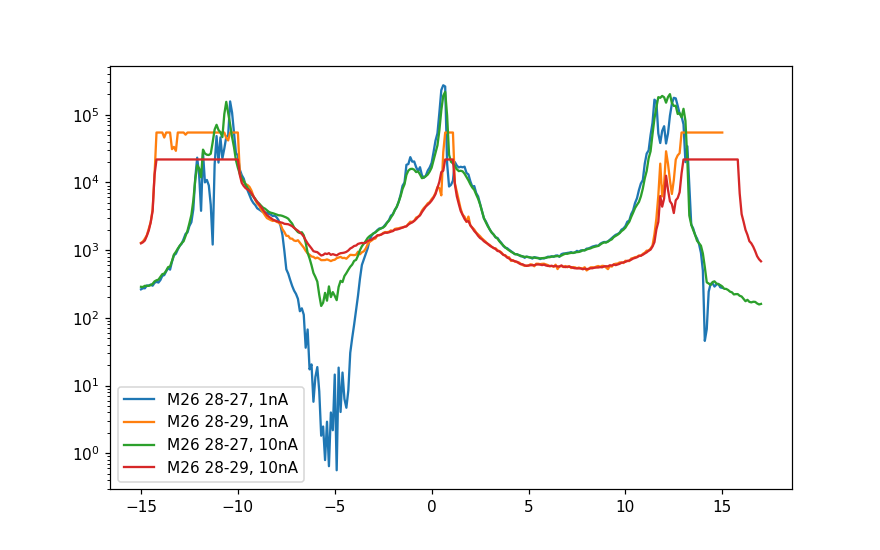

In [1146]:
plt.figure(figsize=(8, 5))
plt.semilogy(g1, np.abs(data263.lockin865_X[:]/1e-9), label='M26 28-27, 1nA')
plt.semilogy(g1, np.abs(data263.lockin830_X[:]/1e-9), label='M26 28-29, 1nA')
plt.semilogy(g2, np.abs(data264.lockin865_X[:]/10e-9), label='M26 28-27, 10nA')
plt.semilogy(g2, np.abs(data264.lockin830_X[:]/10e-9), label='M26 28-29, 10nA')
plt.legend()

In [1147]:
srframe.volt_p1(-3)

In [1148]:
triton.pid_setpoint(0.05)

In [1149]:
triton.pid_range(3.16)

In [1150]:
triton.pid_mode(1)

In [1151]:
lockin830.sensitivity()

0.0001

In [1152]:
for i in range(31):
    Vg = -3 + 0.1*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 22.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.218 seconds
Started at 2020-04-28 16:26:28
DataSet:
   location = 'data/2020-04-28/#133_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg-3.00_10nA_16-26-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-28 16:32:19
Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.332 seconds
Started at 2020-04-28 16:33:10
DataSet:
   location = 'data/2020-04-28/#134_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg-2.90_10nA_16-33

In [1153]:
srframe.volt_p1(1)

In [1155]:
lockin830.X()

7.99266e-05

In [1156]:
for i in range(106):
    Vg = 1 + 0.1*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.978 seconds
Started at 2020-04-28 20:12:57
DataSet:
   location = 'data/2020-04-28/#164_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg1.00_10nA_20-12-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-28 20:18:50
Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.74399999999997 seconds
Started at 2020-04-28 20:19:43
DataSet:
   location = 'data/2020-04-28/#165_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg1.10_1

In [1157]:
lockin830.sensitivity(2e-5)

In [1158]:
srframe.volt_p1(17)

In [1159]:
time.sleep(180)

In [1160]:
for i in range(51):
    Vg = 17 + 0.04*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.038 seconds
Started at 2020-04-29 08:10:59
DataSet:
   location = 'data/2020-04-29/#073_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg17.00_10nA_08-10-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-29 08:16:50
Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.74399999999997 seconds
Started at 2020-04-29 08:17:44
DataSet:
   location = 'data/2020-04-29/#074_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg17.

In [1161]:
srframe.volt_p1(-15)

In [1162]:
time.sleep(180)

In [1163]:
for i in range(51):
    Vg = -15 - 0.04*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.272 seconds
Started at 2020-04-29 13:58:56
DataSet:
   location = 'data/2020-04-29/#124_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg-15.00_10nA_13-58-55'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-29 14:04:48
Please wait 34.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.218 seconds
Started at 2020-04-29 14:05:41
DataSet:
   location = 'data/2020-04-29/#125_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg-15.04_10nA_14-

In [1164]:
srframe.volt_p1(0)

In [1165]:
triton.pid_range(10)

In [1166]:
triton.pid_setpoint(0.3)

In [1167]:
time.sleep(120)

In [1168]:
triton.pid_setpoint(1)

In [1169]:
time.sleep(120)

In [1170]:
triton.pid_range(100)

In [1180]:
triton.pid_setpoint(3)

In [1181]:
srframe.volt_p1(-3)

In [1178]:
lockin830.sensitivity(10e-5)

In [1182]:
for i in range(31):
    Vg = -3 + 0.1*i
    st = 'M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 33.994 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.45 seconds
Started at 2020-04-29 20:45:52
DataSet:
   location = 'data/2020-04-29/#175_M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg-3.00_10nA_20-45-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-29 20:51:44
Please wait 33.994 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 351.98199999999997 seconds
Started at 2020-04-29 20:52:38
DataSet:
   location = 'data/2020-04-29/#176_M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg-2.90_10

In [1183]:
srframe.volt_p1(1)

In [1184]:
time.sleep(120)

In [1185]:
for i in range(106):
    Vg = 1 + 0.1*i
    st = 'M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.15799999999996 seconds
Started at 2020-04-30 00:17:00
DataSet:
   location = 'data/2020-04-30/#003_M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg1.00_10nA_00-16-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-30 00:22:51
Please wait 34.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.396 seconds
Started at 2020-04-30 00:23:44
DataSet:
   location = 'data/2020-04-30/#004_M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg1.10_10n

In [1186]:
srframe.volt_p1(-15)

In [1187]:
time.sleep(120)

In [1188]:
for i in range(51):
    Vg = -15 - 0.04*i
    st = 'M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 33.982 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.218 seconds
Started at 2020-04-30 12:15:09
DataSet:
   location = 'data/2020-04-30/#109_M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg-15.00_10nA_12-15-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-30 12:21:01
Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 353.332 seconds
Started at 2020-04-30 12:21:56
DataSet:
   location = 'data/2020-04-30/#110_M26_865_27-28_830_28-29_3K_WALfieldsw_Vbg-15.04_10nA_12-21-5

In [1189]:
srframe.volt_p1(0)

In [1190]:
triton.pid_mode(0)

In [1191]:
# do some fine scan

In [1193]:
srframe.volt_p1(-2.5)

In [1196]:
triton.read_temps()

MC - on:  0.667096 K
MC_cernox - off:  1.21336 K
still - off:  0.634692 K
cold_plate - off:  0.070223 K
magnet - off:  4.09998 K
PT2h - off:  3.29403 K
PT2p - off:  3.54568 K
PT1h - off:  46.7186 K
PT1p - off:  61.5584 K


In [1197]:
srframe.volt_p1(-3)

In [1198]:
triton.pid_setpoint(0.05)

In [1199]:
triton.pid_range(3.16)

In [1200]:
triton.pid_mode(1)

In [1201]:
for i in range(26):
    Vg = -3 + 0.02*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 34.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 489.35200000000003 seconds
Started at 2020-04-30 20:08:08
DataSet:
   location = 'data/2020-04-30/#160_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg-3.00_10nA_20-08-07'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-04-30 20:16:13
Please wait 33.994 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 490.504 seconds
Started at 2020-04-30 20:17:07
DataSet:
   location = 'data/2020-04-30/#161_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg-2.98

In [1213]:
srframe.volt_p1(7)

In [1214]:
time.sleep(120)

In [1215]:
for i in range(26):
    Vg = 7 + 0.04*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 36.988 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-05-01 00:35:09
DataSet:
   location = 'data/2020-05-01/#004_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg7.00_10nA_00-35-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-01 00:45:16
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-05-01 00:46:16
DataSet:
   location = 'data/2020-05-01/#005_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg7.04_10

In [1216]:
srframe.volt_p1(9)

In [1217]:
time.sleep(120)

In [1218]:
for i in range(26):
    Vg = 9 + 0.04*i
    st = 'M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-05-01 05:25:14
DataSet:
   location = 'data/2020-05-01/#030_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg9.00_10nA_05-25-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-01 05:35:19
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.376 seconds
Started at 2020-05-01 05:36:18
DataSet:
   location = 'data/2020-05-01/#031_M26_865_27-28_830_28-29_50mK_WALfieldsw_Vbg9.04_

In [1219]:
lockin830.sensitivity(5e-5)

In [1220]:
srframe.volt_p1(-3)

In [1221]:
time.sleep(120)

In [1222]:
for i in range(26):
    Vg = -3 + 0.02*i
    st = 'M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 13.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.0300000000001 seconds
Started at 2020-05-01 10:15:24
DataSet:
   location = 'data/2020-05-01/#056_M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg-3.00_10nA_10-15-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-01 10:29:31
Please wait 51.988 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-05-01 10:30:43
DataSet:
   location = 'data/2020-05-01/#057_M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg-2.9

In [1223]:
srframe.volt_p1(7)

In [1224]:
time.sleep(120)

In [1225]:
for i in range(26):
    Vg = 7 + 0.04*i
    st = 'M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.192 seconds
Started at 2020-05-01 16:55:57
DataSet:
   location = 'data/2020-05-01/#082_M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg7.00_10nA_16-55-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-01 17:10:05
Please wait 52.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.862 seconds
Started at 2020-05-01 17:11:15
DataSet:
   location = 'data/2020-05-01/#083_M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg7.04_10nA_17-11-1

In [1226]:
srframe.volt_p1(9)

In [1227]:
time.sleep(120)

In [1228]:
for i in range(26):
    Vg = 9 + 0.04*i
    st = 'M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.0300000000001 seconds
Started at 2020-05-01 23:36:18
DataSet:
   location = 'data/2020-05-01/#108_M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg9.00_10nA_23-36-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-01 23:50:26
Please wait 52.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.862 seconds
Started at 2020-05-01 23:51:38
DataSet:
   location = 'data/2020-05-01/#109_M26_865_27-28_830_28-29_50mK_UCFfieldsw_Vbg9.04_10

In [1229]:
triton.pid_range(10)

In [1230]:
time.sleep(10)

In [1231]:
triton.pid_setpoint(0.3)

In [1232]:
time.sleep(600)

In [1233]:
lockin830.sensitivity(2e-5)

In [1234]:
srframe.volt_p1(-3)

In [1235]:
time.sleep(120)

In [1236]:
for i in range(26):
    Vg = -3 + 0.02*i
    st = 'M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 85.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.376 seconds
Started at 2020-05-02 06:28:02
DataSet:
   location = 'data/2020-05-02/#025_M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg-3.00_10nA_06-28-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-02 06:38:08
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-05-02 06:39:08
DataSet:
   location = 'data/2020-05-02/#026_M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg-2.98_10nA_0

In [1237]:
srframe.volt_p1(7)

In [1238]:
time.sleep(120)

In [1239]:
for i in range(26):
    Vg = 7 + 0.04*i
    st = 'M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-05-02 11:18:24
DataSet:
   location = 'data/2020-05-02/#051_M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg7.00_10nA_11-18-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-02 11:28:29
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 608.962 seconds
Started at 2020-05-02 11:29:27
DataSet:
   location = 'data/2020-05-02/#052_M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg7.04_10

In [1240]:
srframe.volt_p1(9)

In [1241]:
time.sleep(120)

In [1242]:
for i in range(26):
    Vg = 9 + 0.04*i
    st = 'M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.784 seconds
Started at 2020-05-02 16:08:35
DataSet:
   location = 'data/2020-05-02/#077_M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg9.00_10nA_16-08-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-02 16:18:39
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-05-02 16:19:38
DataSet:
   location = 'data/2020-05-02/#078_M26_865_27-28_830_28-29_300mK_WALfieldsw_Vbg9.04_10

In [1243]:
triton.pid_setpoint(0.6)

In [1244]:
time.sleep(600)

In [1245]:
srframe.volt_p1(-3)

In [1246]:
time.sleep(120)

In [1247]:
for i in range(26):
    Vg = -3 + 0.02*i
    st = 'M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.02 seconds
Started at 2020-05-02 21:09:02
DataSet:
   location = 'data/2020-05-02/#103_M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg-3.00_10nA_21-09-01'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-02 21:19:07
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-05-02 21:20:05
DataSet:
   location = 'data/2020-05-02/#104_M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg-2.98

In [1248]:
srframe.volt_p1(7)

In [1249]:
time.sleep(120)

In [1250]:
for i in range(26):
    Vg = 7 + 0.04*i
    st = 'M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-05-03 01:59:20
DataSet:
   location = 'data/2020-05-03/#011_M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg7.00_10nA_01-59-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-03 02:09:27
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-05-03 02:10:25
DataSet:
   location = 'data/2020-05-03/#012_M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg7.04_

In [1251]:
srframe.volt_p1(9)

In [1252]:
time.sleep(120)

In [1253]:
for i in range(26):
    Vg = 9 + 0.04*i
    st = 'M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-05-03 06:49:15
DataSet:
   location = 'data/2020-05-03/#037_M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg9.00_10nA_06-49-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-03 06:59:19
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.182 seconds
Started at 2020-05-03 07:00:18
DataSet:
   location = 'data/2020-05-03/#038_M26_865_27-28_830_28-29_600mK_WALfieldsw_Vbg9.04_10

In [1254]:
triton.pid_setpoint(0.9)

In [1255]:
time.sleep(600)

In [31]:
srframe.volt_p1(9)

In [32]:
time.sleep(120)

In [1258]:
for i in range(26):
    Vg = 9 + 0.04*i
    st = 'M26_865_27-28_830_28-29_900mK_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-05-03 11:49:25
DataSet:
   location = 'data/2020-05-03/#063_M26_865_27-28_830_28-29_900mK_WALfieldsw_Vbg9.00_10nA_11-49-24'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-03 11:59:30
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-05-03 12:00:30
DataSet:
   location = 'data/2020-05-03/#064_M26_865_27-28_830_28-29_900mK_WALfields

In [26]:
triton.pid_range(100)

In [30]:
triton.pid_setpoint(3)

In [28]:
triton.pid_mode(1)

In [7]:
for i in range(26):
    Vg = 9 + 0.04*i
    st = 'M26_830_28-27_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin830.X], save_plots=False)

Please wait 10.042 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.02 seconds
Started at 2020-05-03 19:50:27
DataSet:
   location = 'data/2020-05-03/#096_M26_830_28-27_3K_WALfieldsw_Vbg9.00_10nA_19-50-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-03 20:00:33
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-05-03 20:01:32
DataSet:
   location = 'data/2020-05-03/#097_M26_830_28-27_3K_WALfieldsw_Vbg9.04_10nA_20-01-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   

In [8]:
srframe.volt_p1(7)

In [9]:
time.sleep(120)

In [10]:
for i in range(26):
    Vg = 7 + 0.04*i
    st = 'M26_830_28-27_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 608.632 seconds
Started at 2020-05-04 00:40:25
DataSet:
   location = 'data/2020-05-04/#004_M26_830_28-27_3K_WALfieldsw_Vbg7.00_10nA_00-40-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-04 00:50:30
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.1139999999999 seconds
Started at 2020-05-04 00:51:36
Request timed out: ('getObjAttr', 16368, 0, b'\x80\x03}q\x00(X\x03\x00\x00\x00objq\x01cpyqtgraph.multiprocess.remoteproxy\nunpickleObjectProxy\nq\x02(M\xbc\x1cM\xfd XP\x00\x00\x00<pyqtgraph.graphicsItems.PlotDat

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-05-04/#005_M26_830_28-27_3K_WALfieldsw_Vbg7.04_10nA_00-51-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-04 01:01:38
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-05-04 01:02:39
DataSet:
   location = 'data/2020-05-04/#006_M26_830_28-27_3K_WALfieldsw_Vbg7.08_10nA_01-02-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y

In [11]:
srframe.volt_p1(-3)

In [12]:
time.sleep(120)

In [13]:
for i in range(26):
    Vg = -3 + 0.02*i
    st = 'M26_830_28-27_3K_WALfieldsw_Vbg{:.2f}_10nA'.format(Vg)
    srframe.volt_p1(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-05-04 05:31:21
DataSet:
   location = 'data/2020-05-04/#030_M26_830_28-27_3K_WALfieldsw_Vbg-3.00_10nA_05-31-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-05-04 05:41:26
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.36 seconds
Started at 2020-05-04 05:42:25
DataSet:
   location = 'data/2020-05-04/#031_M26_830_28-27_3K_WALfieldsw_Vbg-2.98_10nA_05-42-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
 

In [18]:
srframe.volt_p1(0)

In [17]:
# base temp, cables plugged
srframe.volt_p1(-15)
time.sleep(120)
gvals = np.linspace(-15, 17, 321)
data270, plot270 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.5, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M26_865_27-28_830_28-29_3K_1nA', YParam=[lockin865.X, lockin830.X])

Started at 2020-05-04 11:38:41
DataSet:
   location = 'data/2020-05-04/#057_M26_865_27-28_830_28-29_3K_1nA_11-38-40'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-05-04 11:48:19


In [24]:
triton.pid_setpoint(40)

In [25]:
triton.close()

In [26]:
lockin865.close()

In [27]:
lockin830.close()
srframe.close()